In [0]:
from google.colab import files
uploaded = files.upload()

Saving data.rar to data (1).rar


In [0]:
get_ipython().system_raw("unrar x data.rar")


In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import linear_model
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from mlxtend.classifier import StackingClassifier
from mlxtend.classifier import EnsembleVoteClassifier
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from imblearn.over_sampling import SMOTE


In [0]:
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout
import tensorflow as tf
from tensorflow.keras.models import Sequential
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Input, Dense, LSTM, MaxPooling1D, Conv1D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam,SGD
from tensorflow.keras.callbacks import EarlyStopping ,ModelCheckpoint,LearningRateScheduler, Callback,ReduceLROnPlateau

In [0]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [0]:
train.head(2)

,id,target,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,...,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
0,0,1.0,-0.098,2.165,0.681,-0.614,1.309,-0.455,-0.236,0.276,-2.246,1.825,-0.912,-0.107,0.305,0.102,0.826,0.417,0.177,-0.673,-0.503,1.864,0.41,-1.927,0.102,-0.931,1.763,1.449,-1.097,-0.686,-0.25,-1.859,1.125,1.009,-2.296,0.385,-0.876,1.528,-0.144,-1.078,...,-0.681,1.250,-0.565,-1.318,-0.923,0.075,-0.704,2.457,0.771,-0.460,0.569,-1.320,-1.516,-2.145,-1.120,0.156,0.820,-1.049,-1.125,0.484,0.617,1.253,1.248,0.504,-0.802,-0.896,-1.793,-0.284,-0.601,0.569,0.867,1.347,0.504,-0.649,0.672,-2.097,1.051,-0.414,1.038,-1.065
1,1,0.0,1.081,-0.973,-0.383,0.326,-0.428,0.317,1.172,0.352,0.004,-0.291,2.907,1.085,2.144,1.540,0.584,1.133,1.098,-0.237,-0.498,0.283,-1.10,-0.417,1.382,-0.515,-1.519,0.619,-0.128,0.866,-0.54,1.238,-0.227,0.269,-0.390,-2.721,1.659,0.106,-0.121,1.719,...,0.971,-1.489,0.530,0.917,-0.094,-1.407,0.887,-0.104,-0.583,1.267,-1.667,-2.771,-0.516,1.312,0.491,0.932,2.064,0.422,1.215,2.012,0.043,-0.307,-0.059,1.121,1.333,0.211,1.753,0.053,1.274,-0.612,-0.165,-1.695,-1.257,1.359,-0.808,-1.624,-0.458,-1.099,-0.936,0.973


In [0]:
test.head(2)

,id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,...,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
0,250,0.500,-1.033,-1.595,0.309,-0.714,0.502,0.535,-0.129,-0.687,1.291,0.507,-0.317,1.848,-0.232,-0.340,-0.051,0.804,0.764,1.860,0.262,1.112,-0.491,-1.039,-0.492,0.183,-0.671,-1.313,0.149,0.244,1.072,-1.003,0.832,-1.075,1.988,1.201,-2.065,-0.826,-0.016,0.490,...,0.824,0.928,1.372,1.505,0.645,0.641,-1.132,1.009,0.998,0.210,-1.634,1.046,0.114,-0.806,0.301,0.145,-0.684,0.794,-0.290,-1.688,0.313,1.140,0.447,-0.616,1.294,0.785,0.453,1.550,-0.866,1.007,-0.088,-2.628,-0.845,2.078,-0.277,2.132,0.609,-0.104,0.312,0.979
1,251,0.776,0.914,-0.494,1.347,-0.867,0.480,0.578,-0.313,0.203,1.356,-1.086,0.322,0.876,-0.563,-1.394,0.385,1.891,-2.107,-0.636,-0.055,-0.843,0.041,0.253,0.557,0.475,-0.839,-1.146,1.210,1.427,0.347,1.077,-0.194,0.323,0.543,0.894,1.190,0.342,-0.858,0.756,...,-1.791,0.122,-0.669,-1.558,-0.244,2.583,-0.829,0.133,-2.746,0.341,-1.145,0.492,0.437,-0.628,0.271,2.639,0.481,-0.687,1.017,1.648,-1.272,-0.797,-0.870,-1.582,-1.987,-0.052,-0.194,0.539,-1.788,-0.433,-0.683,-0.066,0.025,0.606,-0.353,-1.133,-3.138,0.281,-0.625,-0.761


In [0]:
y_train = train['target']
x_train = train.drop(['id' ,'target'] ,axis = 1)
x_train.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
0,-0.098,2.165,0.681,-0.614,1.309,-0.455,-0.236,0.276,-2.246,1.825,-0.912,-0.107,0.305,0.102,0.826,0.417,0.177,-0.673,-0.503,1.864,0.41,-1.927,0.102,-0.931,1.763,1.449,-1.097,-0.686,-0.25,-1.859,1.125,1.009,-2.296,0.385,-0.876,1.528,-0.144,-1.078,-0.403,0.005,...,-0.681,1.250,-0.565,-1.318,-0.923,0.075,-0.704,2.457,0.771,-0.460,0.569,-1.320,-1.516,-2.145,-1.120,0.156,0.820,-1.049,-1.125,0.484,0.617,1.253,1.248,0.504,-0.802,-0.896,-1.793,-0.284,-0.601,0.569,0.867,1.347,0.504,-0.649,0.672,-2.097,1.051,-0.414,1.038,-1.065
1,1.081,-0.973,-0.383,0.326,-0.428,0.317,1.172,0.352,0.004,-0.291,2.907,1.085,2.144,1.540,0.584,1.133,1.098,-0.237,-0.498,0.283,-1.10,-0.417,1.382,-0.515,-1.519,0.619,-0.128,0.866,-0.54,1.238,-0.227,0.269,-0.390,-2.721,1.659,0.106,-0.121,1.719,0.411,-0.303,...,0.971,-1.489,0.530,0.917,-0.094,-1.407,0.887,-0.104,-0.583,1.267,-1.667,-2.771,-0.516,1.312,0.491,0.932,2.064,0.422,1.215,2.012,0.043,-0.307,-0.059,1.121,1.333,0.211,1.753,0.053,1.274,-0.612,-0.165,-1.695,-1.257,1.359,-0.808,-1.624,-0.458,-1.099,-0.936,0.973


In [0]:
x_test = test.drop(['id'] ,axis=1)

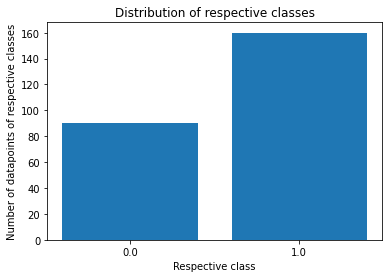

In [0]:
dic = dict(y_train.value_counts())
plt.bar(dic.keys(),dic.values())
plt.ylabel("Number of datapoints of respective classes")
plt.xlabel("Respective class")
plt.title("Distribution of respective classes")
plt.xticks(list(dic.keys()),list(dic.keys()))
plt.show()

Here we can see that our data is imbalanced.

In [0]:
mean_list=list(x_train.mean())
median_list = list(x_train.median())

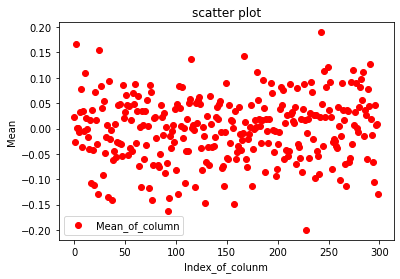

In [0]:
plt.scatter(list(range(300)) , mean_list, color='r',label="Mean_of_column")
plt.xlabel('Index_of_colunm')
plt.ylabel('Mean')
plt.title('scatter plot')
plt.legend()
plt.show()

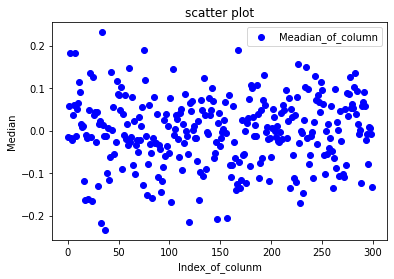

In [0]:
plt.scatter(list(range(300)), median_list, color='b',label="Meadian_of_column")
plt.xlabel('Index_of_colunm')
plt.ylabel('Median')
plt.title('scatter plot')
plt.legend()
plt.show()

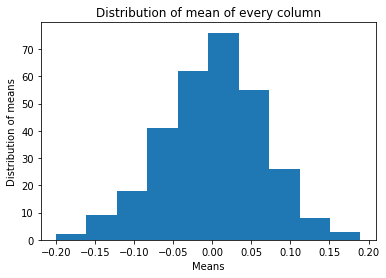

In [0]:
plt.hist(mean_list,density=False)
plt.ylabel("Distribution of means")
plt.xlabel("Means")
plt.title("Distribution of mean of every column")
plt.show()

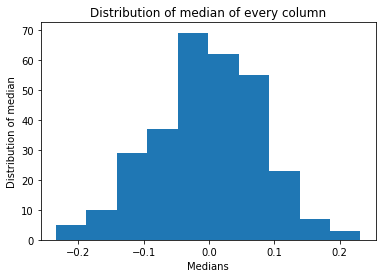

In [0]:
plt.hist(median_list,density=False)
plt.ylabel("Distribution of median")
plt.xlabel("Medians")
plt.title("Distribution of median of every column")
plt.show()

By looking at the above 4 plots we can say that
1.   mean is mainly distributed between -0.15 to 0.15.
2.   Median is mostly distributed between -0.2 to 0.2

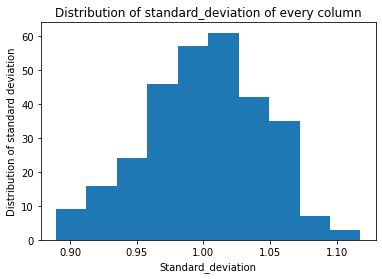

In [0]:
std_list=list(x_train.std())
plt.hist(std_list,density=False)
plt.ylabel("Distribution of standard deviation")
plt.xlabel("Standard_deviation")
plt.title("Distribution of standard_deviation of every column")
plt.show()

Here we can see that standard deviation is mainly distributed between 0.90 to 1.10.

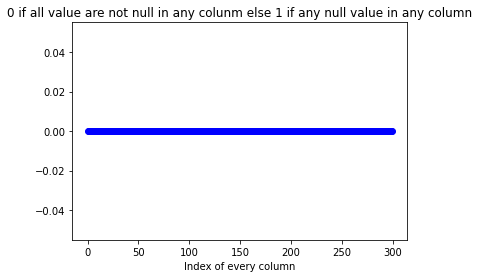

In [0]:
l=list(x_train.isna().any())
ll=list()
for i in l:
  if (i==False):
    ll.append(0)
  else:
    ll.append(1)
plt.scatter(list(range(300)), ll, color='b')
plt.title("0 if all value are not null in any colunm else 1 if any null value in any column")
plt.xlabel("Index of every column")
plt.show()

So we can say that there is not any null value.

Distributions of every third columns from starting


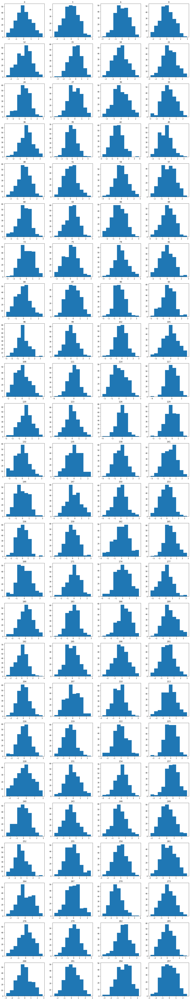

In [0]:
print('Distributions of every third columns from starting')
plt.figure(figsize=(20, 110))
for i, col in enumerate(list(x_train.columns)[::3]):
 plt.subplot(25, 4, i + 1)
 plt.hist(train[col])
 plt.title(col)

Here we have plotted the distribution of each third column from starting, and we saw that almost each column
was of same distribution

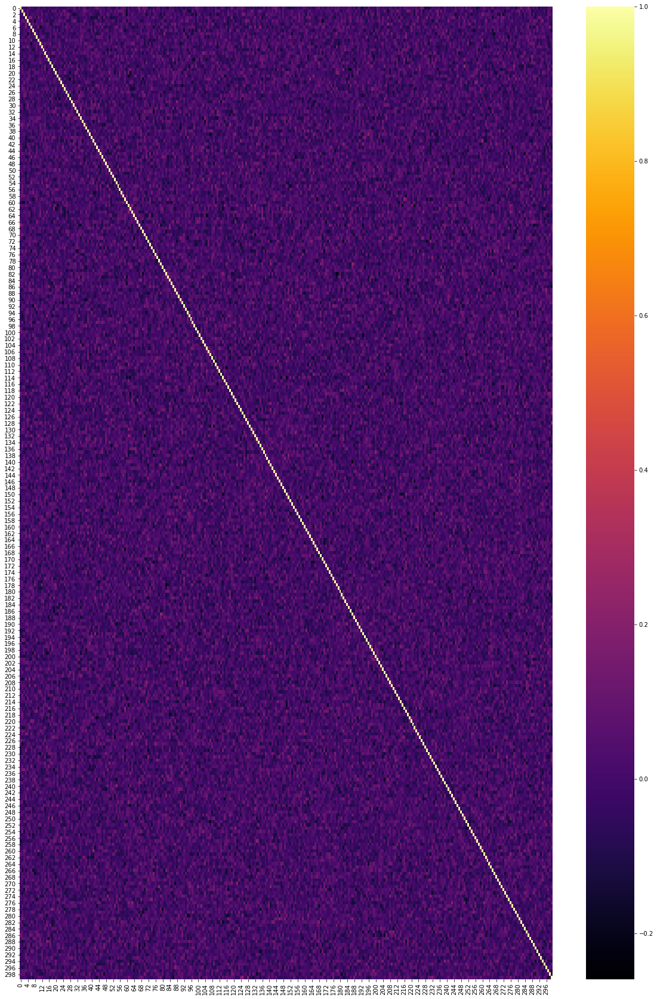

In [0]:
plt.figure(figsize=(20,30))
sns.heatmap(x_train.corr(),cmap="inferno")

We can see that correlation between columns are between mostly -0.2 to 0.4,with some variation.

Plotting box_plot of every column with target value as thier classification


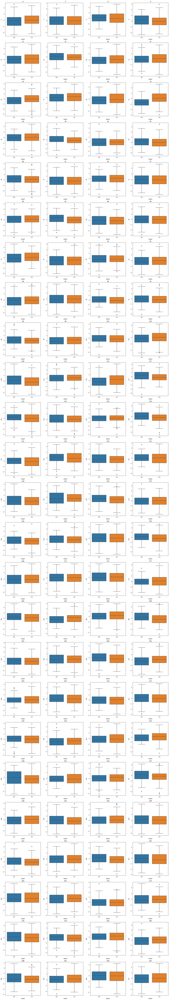

In [0]:
print("Plotting box_plot of every column with target value as thier classification")
plt.figure(figsize=(24, 150))
for i, col in enumerate(list(x_train.columns)[::3]):
 plt.subplot(25, 4, i + 1)
 sns.boxplot(x='target',y=col,data=train)
 plt.title(col)

Here we see that all the distribution is same i.e, no any column of a biased distribution over any class.

###LR_TUNING

In [0]:
parameters = {"penalty":['l1','l2'],"alpha":np.logspace(-4, 4, 20)}
clf = linear_model.SGDClassifier(loss="log",class_weight='balanced',random_state = 2)
best_SGD_LR = GridSearchCV(clf,parameters,cv = 5,scoring = "roc_auc")
best_SGD_LR.fit(x_train,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=SGDClassifier(alpha=0.0001, average=False,
                                     class_weight='balanced',
                                     early_stopping=False, epsilon=0.1,
                                     eta0=0.0, fit_intercept=True,
                                     l1_ratio=0.15, learning_rate='optimal',
                                     loss='log', max_iter=1000,
                                     n_iter_no_change=5, n_jobs=None,
                                     penalty='l2', power_t=0.5, random_state=2,
                                     shuffle=True, tol=0.001,
                                     validation_fraction=0.1...
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+

In [0]:
best_SGD_LR.best_score_

0.7677083333333334

In [0]:
best_SGD_LR.best_params_

{'alpha': 0.08858667904100823, 'penalty': 'l1'}

In [0]:
y_pred = best_SGD_LR.predict(x_train)

In [0]:
y_prob = best_SGD_LR.predict_proba(x_train)

Roc_auc score is 0.8054166666666667


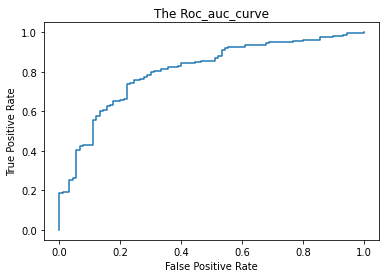

In [0]:
print("Roc_auc score is",roc_auc_score(y_train,y_prob[:,1]))
fpr, tpr,_ = roc_curve(y_train, y_prob[:,1])
plt.plot(fpr, tpr)
plt.title("The Roc_auc_curve")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-09 10-48-49.png to Screenshot from 2020-05-09 10-48-49.png


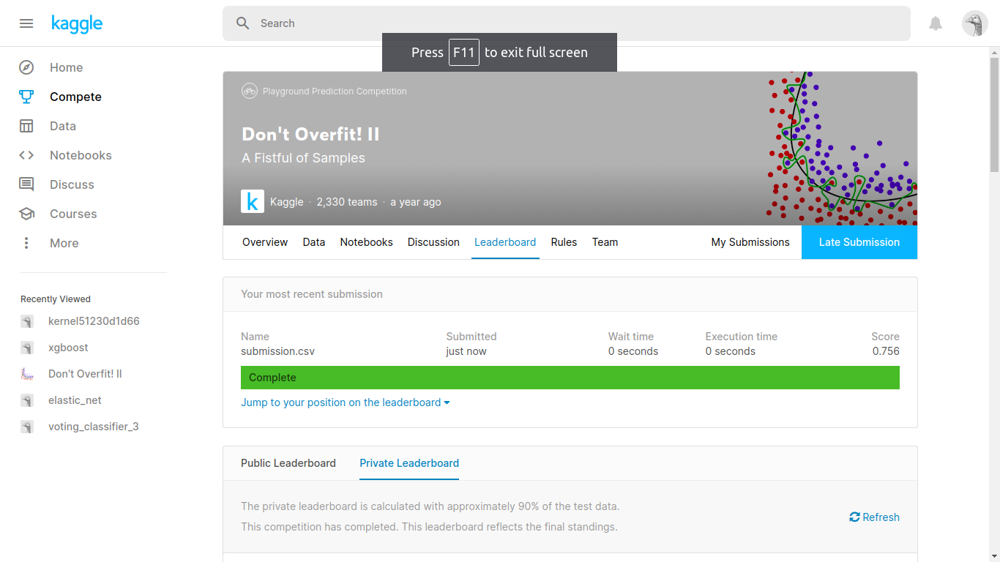

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 10-48-49.png')

###Grid_Search_on_SVM

In [0]:
Cs = list(np.logspace(-4, 4, 20))
gammas = list(np.logspace(-4, 4, 20))
param_grid = {'C':Cs,'gamma':gammas}
svm = SVC(random_state = 4,kernel = 'linear',probability=True)
best_svm = GridSearchCV(svm,param_grid,cv= 5,scoring = "roc_auc")
best_svm.fit(x_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='linear', max_iter=-1,
                           probability=True, random_state=4, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.0001, 0.00026366508987303583,
                               0.00069...
                                   0.004832930238571752, 0.012742749857031334,
                                   0.03359818286283781, 0.08858667904100823,
                                   0.23357214690901212, 0.615848211066026,
                                   1.623776739188721, 4.281332398719396,
                                   11.288378916846883, 29.763514416313132,
                                   78.47

In [0]:
best_svm.best_score_

0.7572916666666666

In [0]:
best_svm.best_params_

{'C': 0.03359818286283781, 'gamma': 0.0001}

In [0]:
y_prob = best_svm.predict_proba(x_train)

Roc_auc score is 1.0


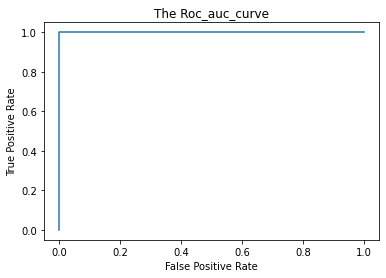

In [0]:
print("Roc_auc score is",roc_auc_score(y_train,y_prob[:,1]))
fpr, tpr,_ = roc_curve(y_train, y_prob[:,1])
plt.plot(fpr, tpr)
plt.title("The Roc_auc_curve")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-09 11-57-33.png to Screenshot from 2020-05-09 11-57-33.png


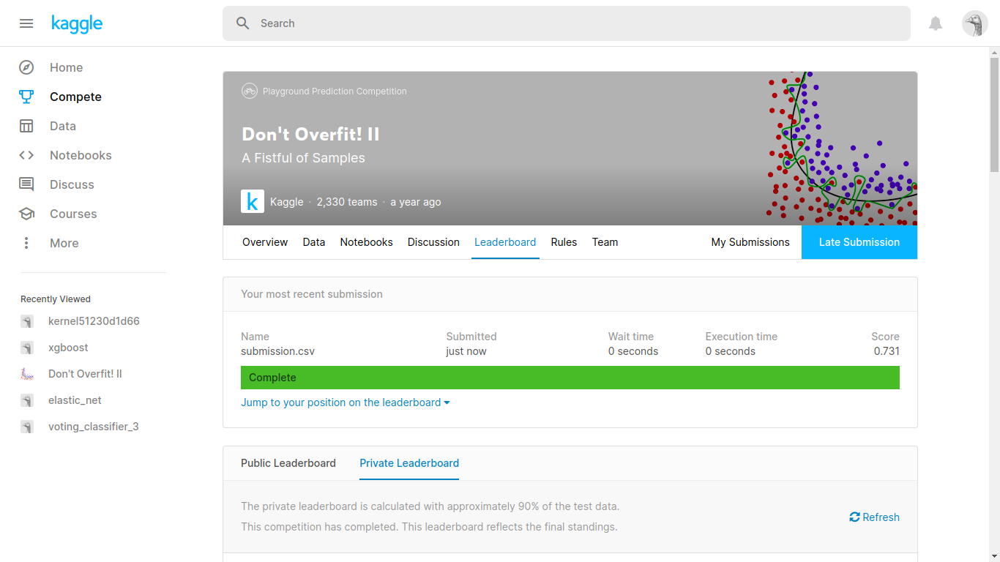

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 11-04-05.png')

###Grid_search_on_Xgboost

In [0]:
param_grid = {
 'max_depth': range (2, 30, 2),
 'n_estimators': range(60, 220, 40),
 'learning_rate': [0.05, 0.10, 0.15, 0.20, 0.25, 0.30]}

In [0]:
xgboost = XGBClassifier(random_state=6)
best_xgboost = GridSearchCV(xgboost,param_grid,cv = 5,scoring = "roc_auc")
best_xgboost.fit(x_train,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=6, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='deprecated', n_jobs=None,
             param_grid={'learning_rate': [0.05, 0.1, 0.15, 0.2, 0.25, 0.3],
                         'max_depth': range(2, 30, 2),
                         'n_estimators': rang

In [0]:
best_xgboost.best_score_

0.7368055555555555

In [0]:
best_xgboost.best_params_

{'learning_rate': 0.3, 'max_depth': 2, 'n_estimators': 180}

In [0]:
y_prob = best_xgboost.predict_proba(x_train)

Roc_auc score is 1.0


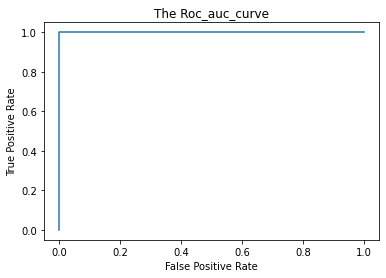

In [0]:
print("Roc_auc score is",roc_auc_score(y_train,y_prob[:,1]))
fpr, tpr,_ = roc_curve(y_train, y_prob[:,1])
plt.plot(fpr, tpr)
plt.title("The Roc_auc_curve")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

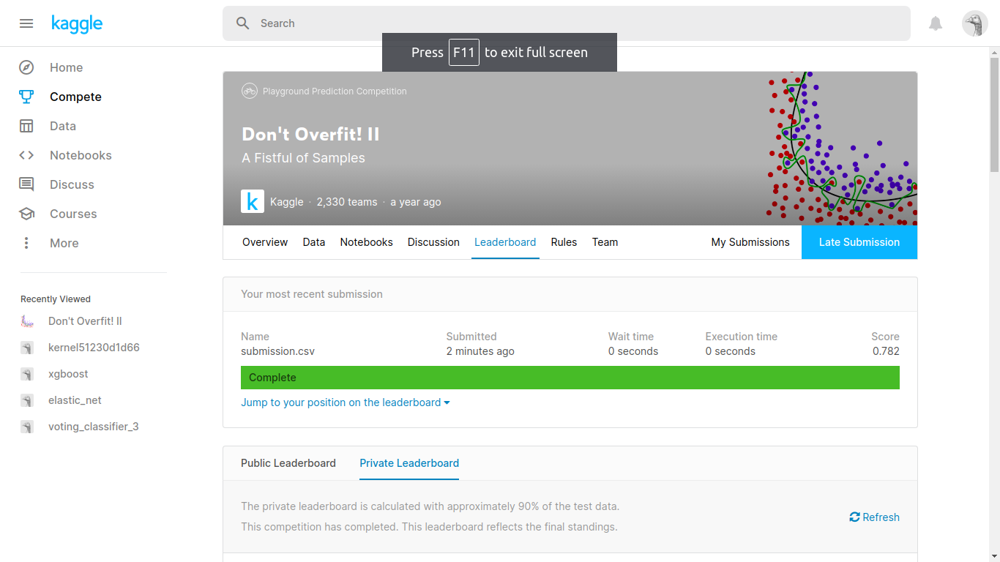

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 11-35-03.png')

###Grid_serach_on_Random_forest_classifier

In [0]:
param_grid = {
 'max_depth': range (2, 30, 2),
 'n_estimators': range(60, 220, 40),
 'criterion' : ['gini','entropy']}
rfc = RandomForestClassifier(random_state=10)
best_rfc = GridSearchCV(rfc ,param_grid,cv = 5,scoring = "roc_auc")
best_rfc.fit(x_train,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=10,
                                  

In [0]:
best_rfc.best_score_

0.7090277777777778

In [0]:
best_rfc.best_params_

{'criterion': 'entropy', 'max_depth': 4, 'n_estimators': 180}

In [0]:
y_prob = best_rfc.predict_proba(x_train)

Roc_auc score is 1.0


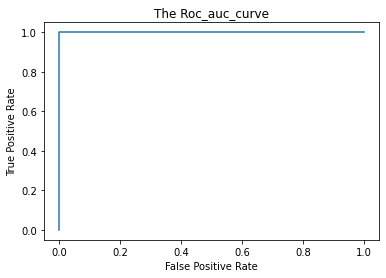

In [0]:
print("Roc_auc score is",roc_auc_score(y_train,y_prob[:,1]))
fpr, tpr,_ = roc_curve(y_train, y_prob[:,1])
plt.plot(fpr, tpr)
plt.title("The Roc_auc_curve")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

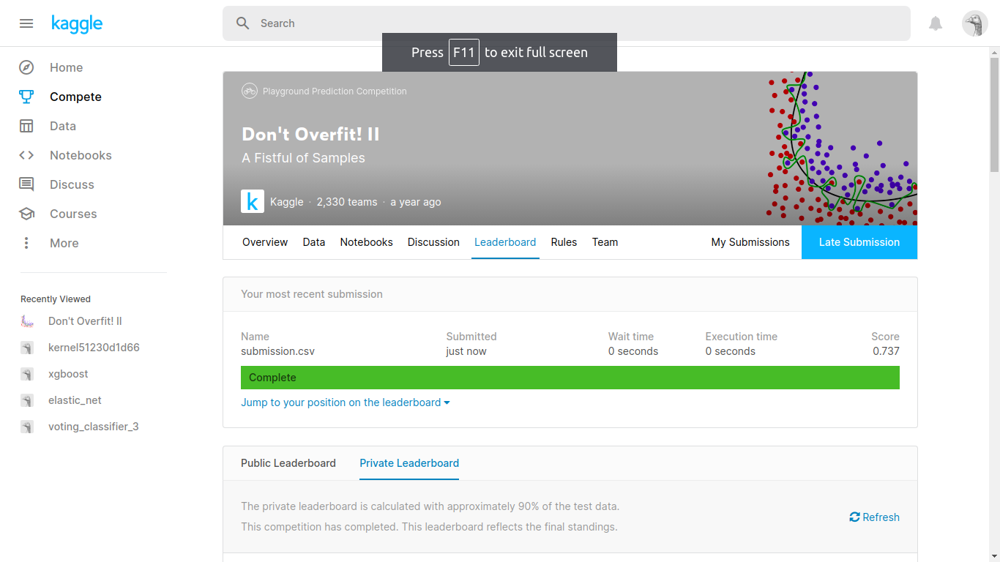

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 11-51-48.png')

###Grid_search_on_knn

In [0]:
param_grid = {'n_neighbors':[3,5,7,9,11,13,15,17,19],'metric':['euclidean','manhattan']}
neigh = KNeighborsClassifier()
best_knn = GridSearchCV(neigh,param_grid,cv = 5,scoring = "roc_auc")
best_knn.fit(x_train,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=None,
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 19]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='roc_auc', verbose=0)

In [0]:
best_knn.best_score_

0.6185763888888889

In [0]:
best_knn.best_params_

{'metric': 'euclidean', 'n_neighbors': 17}

In [0]:
y_prob = best_knn.predict_proba(x_train)

Roc_auc score is 0.7427777777777778


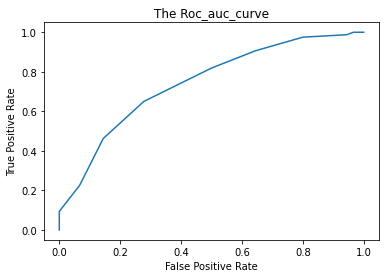

In [0]:
print("Roc_auc score is",roc_auc_score(y_train,y_prob[:,1]))
fpr, tpr,_ = roc_curve(y_train, y_prob[:,1])
plt.plot(fpr, tpr)
plt.title("The Roc_auc_curve")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

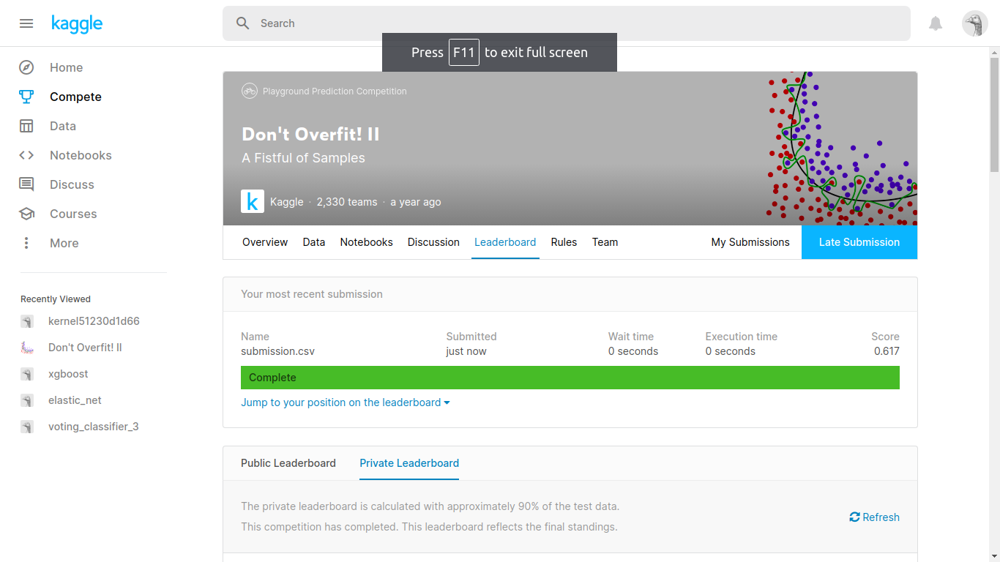

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 11-57-33.png')

###Stacking the classifier

In [0]:
# Classifier 1: Logistic Regression with best params
clf1 = linear_model.SGDClassifier(alpha=0.08858667904100823, penalty= 'l1',loss="log",class_weight='balanced',random_state = 2)
# Classifier 2: SVC with best params
clf2 = SVC(C = 0.03359818286283781, gamma = 0.0001,random_state = 4,kernel = 'linear',probability=True)
# Classifier 3: XGBoost with best params
clf3 = XGBClassifier(learning_rate= 0.3, max_depth = 2, n_estimators = 180,random_state=6)
# Classifier 4: RF with best params
clf4 = RandomForestClassifier(criterion = 'entropy', max_depth= 4, n_estimators = 180,random_state=90)
# Classifier 5 : Knn with best params
clf5 = KNeighborsClassifier(metric = 'euclidean', n_neighbors = 17)
# Stack Classifier
clf6 = linear_model.SGDClassifier(loss="log",class_weight='balanced',random_state=91)
sclf = StackingClassifier(classifiers=[clf1,clf2,clf3,clf4,clf5],meta_classifier=clf6, use_probas=True)
# Fit the model
sclf.fit(x_train, y_train)

StackingClassifier(average_probas=False,
                   classifiers=[SGDClassifier(alpha=0.08858667904100823,
                                              average=False,
                                              class_weight='balanced',
                                              early_stopping=False, epsilon=0.1,
                                              eta0=0.0, fit_intercept=True,
                                              l1_ratio=0.15,
                                              learning_rate='optimal',
                                              loss='log', max_iter=1000,
                                              n_iter_no_change=5, n_jobs=None,
                                              penalty='l1', power_t=0.5,
                                              random_state=2, shuffle=True,
                                              tol=0.001,
                                              v...
                                                 epsilon

In [0]:
ss = sclf.predict_proba(x_test)[:,1]


In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-09 14-32-41.png to Screenshot from 2020-05-09 14-32-41.png


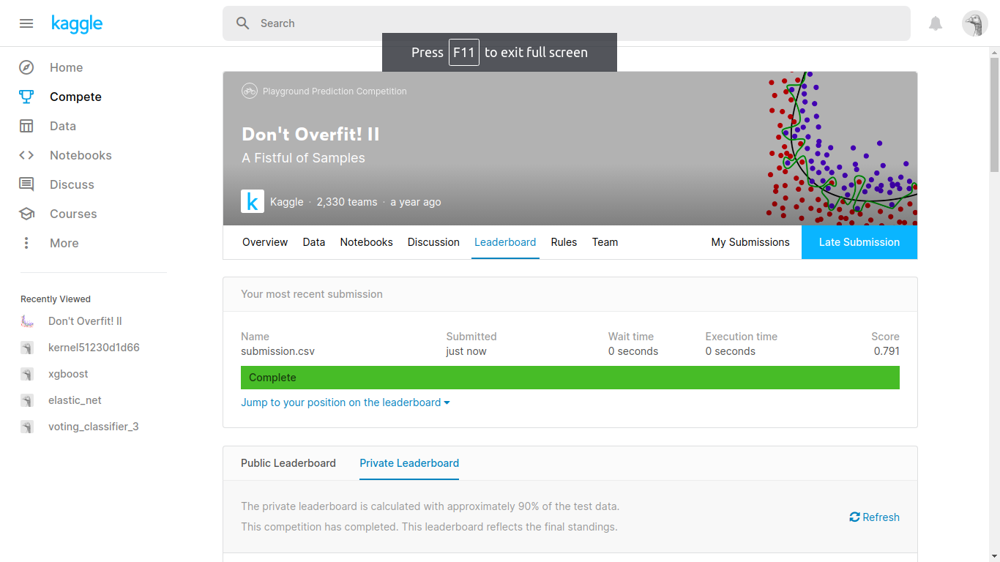

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 12-17-07.png')

###Voting Classifier (With Stack Classifier + no weights)

In [0]:
eclf = EnsembleVoteClassifier(clfs=[clf1, clf2,clf3,clf4,clf5,sclf])
eclf.fit(x_train,y_train)

EnsembleVoteClassifier(clfs=[SGDClassifier(alpha=0.08858667904100823,
                                           average=False,
                                           class_weight='balanced',
                                           early_stopping=False, epsilon=0.1,
                                           eta0=0.0, fit_intercept=True,
                                           l1_ratio=0.15,
                                           learning_rate='optimal', loss='log',
                                           max_iter=1000, n_iter_no_change=5,
                                           n_jobs=None, penalty='l1',
                                           power_t=0.5, random_state=2,
                                           shuffle=True, tol=0.001,
                                           validation_fraction=0.1, v...
                                                                              learning_rate='optimal',
                                                   

In voting classifier, if we had not used 'voting' key, it means the default voting key i.e, hard voting/majority voting will work here,
that means it give the output as the maximum of the base classifiers output

In [0]:
ss = eclf.predict_proba(x_test)[:,1]


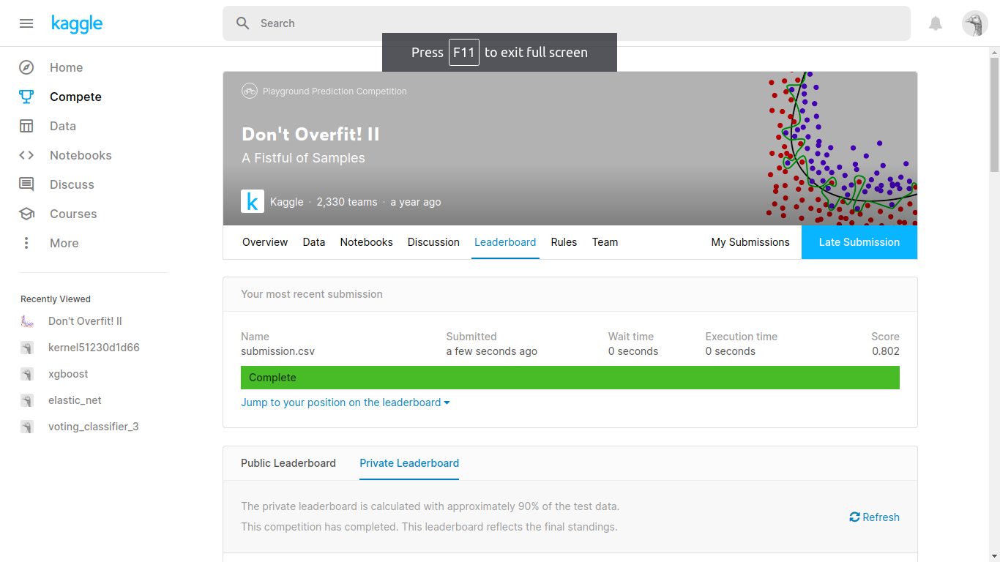

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 12-29-33.png')

###Voting Classifier (with Stack Classifier + weights)

In [0]:
eclf = EnsembleVoteClassifier(clfs=[clf1, clf2,clf3,clf4,clf5,sclf], weights=[0.1,0.1,0.25,0.25,0.05,0.25])
eclf.fit(x_train,y_train)

EnsembleVoteClassifier(clfs=[SGDClassifier(alpha=0.08858667904100823,
                                           average=False,
                                           class_weight='balanced',
                                           early_stopping=False, epsilon=0.1,
                                           eta0=0.0, fit_intercept=True,
                                           l1_ratio=0.15,
                                           learning_rate='optimal', loss='log',
                                           max_iter=1000, n_iter_no_change=5,
                                           n_jobs=None, penalty='l1',
                                           power_t=0.5, random_state=2,
                                           shuffle=True, tol=0.001,
                                           validation_fraction=0.1, v...
                                                                              loss='log',
                                                                

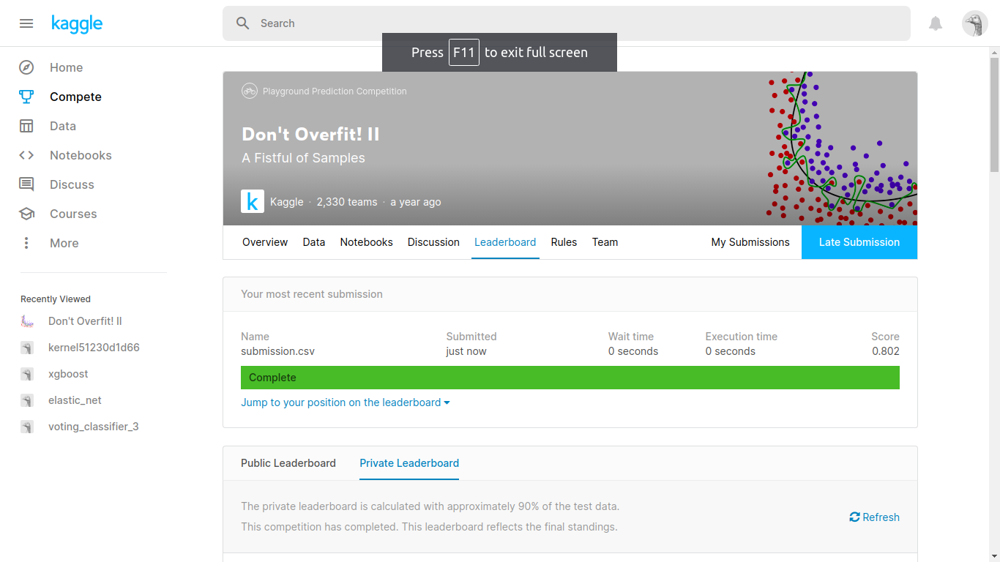

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 12-44-00.png')

###Using_simple_neural_net_architecture

In [0]:
y_trainn = keras.utils.to_categorical(y_train,dtype='int64')

In [0]:
x_train = np.asarray(x_train)
x_test = np.asarray(x_test)

In [0]:
from sklearn.model_selection import train_test_split
X_train, X_test, yy_train, yy_test = train_test_split( x_train, y_trainn, test_size=0.1, random_state=42,stratify = y_trainn)

In [0]:
tf.keras.backend.clear_session()

In [0]:
input_layer = Input(shape=(300))
dense1 = Dense(256,activation='relu')(input_layer)
drop1 = Dropout(0.2)(dense1)
dense2 = Dense(64,activation='relu')(drop1)
drop2 = Dropout(0.2)(dense2)
dense3 = Dense(32,activation='relu')(drop2)
drop3 = Dropout(0.2)(dense3)
output=Dense(2,activation='softmax')(drop3)
model = Model(inputs=input_layer, outputs=output)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 300)]             0         
_________________________________________________________________
dense (Dense)                (None, 256)               77056     
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                16448     
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dropout_2 (Dropout)          (None, 32)                0     

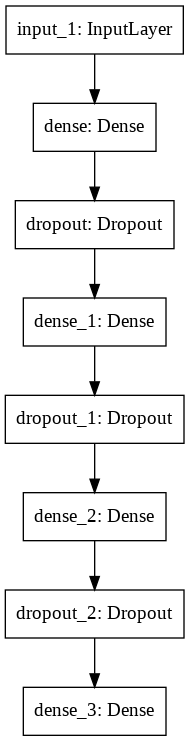

In [0]:
tf.keras.utils.plot_model(
 model,
 to_file='model.png',
 show_shapes=False,
 show_layer_names=True,
 rankdir='TB',
 expand_nested=False,
 dpi=96
)

In [0]:
reduce_lr = ReduceLROnPlateau(monitor = 'val_auc', factor = 0.95, patience = 4,min_lr = 0.00000001)
callback_list = [reduce_lr]

In [0]:
model.compile(loss='binary_crossentropy', optimizer = Adam(learning_rate=0.0001), metrics=[tf.keras.metrics.AUC()])

In [0]:
model.fit(X_train, yy_train, epochs=200,validation_data=(X_test, yy_test),batch_size=50,callbacks=callback_list)

Epoch 1/200
5/5 [==============================] - 0s 65ms/step - loss: 0.7653 - auc: 0.6470 - val_loss: 0.7334 - val_auc: 0.6144 - lr: 1.0000e-04
Epoch 2/200
5/5 [==============================] - 0s 10ms/step - loss: 0.8151 - auc: 0.5951 - val_loss: 0.7237 - val_auc: 0.6128 - lr: 1.0000e-04
Epoch 3/200
5/5 [==============================] - 0s 9ms/step - loss: 0.7400 - auc: 0.6396 - val_loss: 0.7180 - val_auc: 0.6112 - lr: 1.0000e-04
Epoch 4/200
5/5 [==============================] - 0s 10ms/step - loss: 0.7057 - auc: 0.6654 - val_loss: 0.7155 - val_auc: 0.6080 - lr: 1.0000e-04
Epoch 5/200
5/5 [==============================] - 0s 10ms/step - loss: 0.6584 - auc: 0.6880 - val_loss: 0.7146 - val_auc: 0.6048 - lr: 1.0000e-04
Epoch 6/200
5/5 [==============================] - 0s 10ms/step - loss: 0.6821 - auc: 0.6873 - val_loss: 0.7154 - val_auc: 0.5856 - lr: 1.0000e-04
Epoch 7/200
5/5 [==============================] - 0s 10ms/step - loss: 0.6638 - auc: 0.6831 - val_loss: 0.7164 - val_a

In [0]:
ss = model.predict(x_test)

In [0]:
ss.shape

(19750, 2)

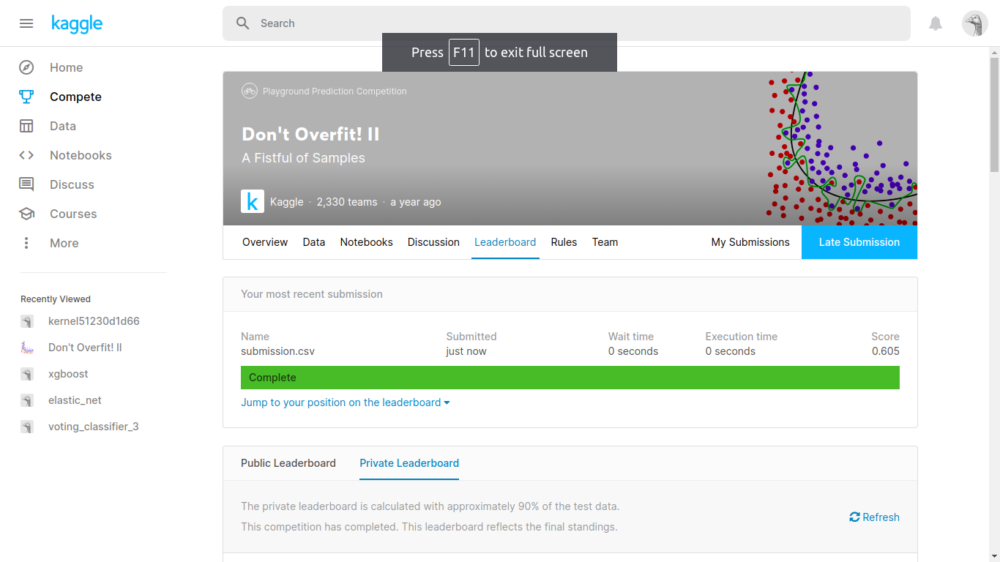

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 14-32-41.png')

###Using_neural_net_architecture_with_cnn1d and lstm

In [0]:
xx_train = x_train.reshape(250, 300,1)
xx_test = x_test.reshape(19750, 300,1)

In [0]:
from sklearn.model_selection import train_test_split
X_train, X_test, yy_train, yy_test = train_test_split( xx_train, y_trainn, test_size=0.1, random_state=42,stratify = y_trainn)

In [0]:
tf.keras.backend.clear_session()

In [0]:
input_layer = Input(shape=(300, 1))
conv1 = Conv1D(filters=64,
 kernel_size=8,
 strides=2,
 activation='relu',
 padding='same')(input_layer)
lstm1 = LSTM(128, return_sequences=True)(conv1)
conv2 = Conv1D(filters=64,
 kernel_size=8,
 strides=2,
 activation='relu',
 padding='same')(lstm1)
lstm2 = LSTM(64, return_sequences=True)(conv2)
conv3 = Conv1D(filters=32,
 kernel_size=8,
 strides=2,
 activation='relu',
 padding='same')(lstm2)
lstm3 = LSTM(32, return_sequences=True)(conv3)
flat_layer = Flatten()(lstm3)
dense1 = Dense(256,activation='relu')(flat_layer)
drop1 = Dropout(0.2)(dense1)
dense2 = Dense(64,activation='relu')(drop1)
drop2 = Dropout(0.2)(dense2)
dense3 = Dense(32,activation='relu')(drop2)
drop3 = Dropout(0.2)(dense3)
output=Dense(2,activation='softmax')(drop3)
model = Model(inputs=input_layer, outputs=output)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 300, 1)]          0         
_________________________________________________________________
conv1d (Conv1D)              (None, 150, 64)           576       
_________________________________________________________________
lstm (LSTM)                  (None, 150, 128)          98816     
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 75, 64)            65600     
_________________________________________________________________
lstm_1 (LSTM)                (None, 75, 64)            33024     
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 38, 32)            16416     
_________________________________________________________________
lstm_2 (LSTM)                (None, 38, 32)            8320  

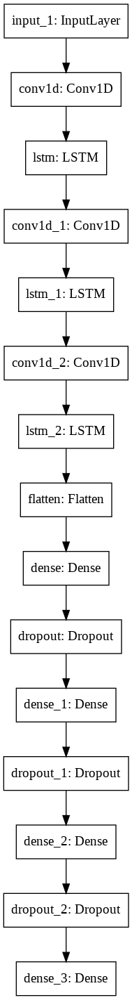

In [0]:
tf.keras.utils.plot_model(
 model,
 to_file='model.png',
 show_shapes=False,
 show_layer_names=True,
 rankdir='TB',
 expand_nested=False,
 dpi=96
)

In [0]:
reduce_lr = ReduceLROnPlateau(monitor = 'val_auc', factor = 0.95, patience = 4,min_lr = 0.00000001)
callback_list = [reduce_lr]

In [0]:
model.compile(loss='binary_crossentropy', optimizer = Adam(learning_rate=0.0001), metrics=[tf.keras.metrics.AUC()])

In [0]:
model.fit(X_train, yy_train, epochs=200,validation_data=(X_test, yy_test),batch_size=50,callbacks=callback_list)

Epoch 1/200
5/5 [==============================] - 3s 566ms/step - loss: 0.6854 - auc: 0.6207 - val_loss: 0.6736 - val_auc: 0.5616 - lr: 1.0000e-04
Epoch 2/200
5/5 [==============================] - 1s 289ms/step - loss: 0.6676 - auc: 0.6480 - val_loss: 0.6610 - val_auc: 0.5760 - lr: 1.0000e-04
Epoch 3/200
5/5 [==============================] - 1s 290ms/step - loss: 0.6519 - auc: 0.6562 - val_loss: 0.6566 - val_auc: 0.5888 - lr: 1.0000e-04
Epoch 4/200
5/5 [==============================] - 1s 288ms/step - loss: 0.6638 - auc: 0.6251 - val_loss: 0.6576 - val_auc: 0.5696 - lr: 1.0000e-04
Epoch 5/200
5/5 [==============================] - 1s 290ms/step - loss: 0.6507 - auc: 0.6599 - val_loss: 0.6568 - val_auc: 0.5600 - lr: 1.0000e-04
Epoch 6/200
5/5 [==============================] - 1s 285ms/step - loss: 0.6541 - auc: 0.6534 - val_loss: 0.6571 - val_auc: 0.5936 - lr: 1.0000e-04
Epoch 7/200
5/5 [==============================] - 1s 288ms/step - loss: 0.6527 - auc: 0.6596 - val_loss: 0.6572

In [0]:
ss = model.predict(xx_test)

In [0]:
ss.shape

(19750, 2)

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-09 16-14-13.png to Screenshot from 2020-05-09 16-14-13.png


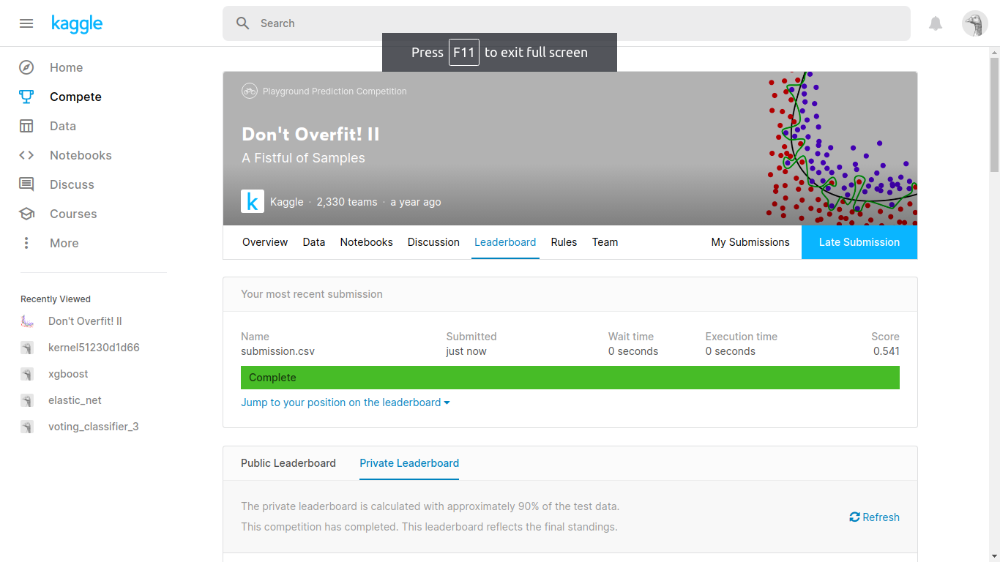

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 15-03-02.png')

###Now_apliying_some_feature_selection_techinque

####boruta Algorithm

In [0]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [0]:
y_train = train['target']
x_train = train.drop(['id' ,'target'] ,axis = 1)
x_test = test.drop(['id'] ,axis=1)

In [0]:
!pip install boruta

     |████████████████████████████████| 61kB 4.9MB/s 


In [0]:
from boruta import BorutaPy

In [0]:
#https://towardsdatascience.com/boruta-explained-the-way-i-wish-someone-explained-it-to-me-4489d70e154a
column = []
for i in tqdm(range(2,6)):#getting important features over a range(2-5) of max_depth by bourta package.
 ###initialize Boruta
    forest = RandomForestClassifier(
     n_jobs = -1,
     max_depth = i,random_state=(i*101)//22
    )
    boruta = BorutaPy(
     estimator = forest,
     n_estimators = 'auto',
     max_iter = 100 )
    boruta.fit(np.array(x_train), np.array(y_train))
    hii = []
    for i in range(boruta.support_.shape[0]):
        if (boruta.support_[i]!=[0]):#If this is not zero it means it got marked asimportant by this algorithm.
            hii.append(i)
    column.append(hii) #Appending this in a new list,so that we could have feature importance regarding each max_depth

100%|██████████| 4/4 [02:45<00:00, 41.27s/it]


In [0]:
column

[[24, 33, 65, 91, 117, 217, 237, 295],
 [24, 33, 65, 91, 117, 217, 295],
 [24, 33, 65, 91, 117, 189, 217],
 [24, 33, 65, 91, 117, 189, 217]]

In [0]:
ls= []
for i in range(len(column)):
    ls = ls+column[i]
columns = list(set(ls)) #Taking all columns name which got hitted atleast once.

In [0]:
columns

[33, 65, 295, 237, 117, 24, 217, 91, 189]

In [0]:
columns.sort()

In [0]:
columns

[24, 33, 65, 91, 117, 189, 217, 237, 295]

In [0]:
for i in range(len(columns)):
    columns[i]= str(columns[i])

In [0]:
x_train_new = x_train[columns]
x_test_new = x_test[columns]

In [0]:
stand_vec = StandardScaler()
x_train_new = stand_vec.fit_transform(x_train_new)

In [0]:
x_test_new = stand_vec.transform(x_test_new)

In [0]:
parameters = {"penalty":['l1','l2'],"alpha":np.logspace(-4, 4, 20)}
clff = linear_model.SGDClassifier(loss="log",class_weight='balanced',random_state=3)
new_best_SGD_LR = GridSearchCV(clff,parameters,cv = 5,scoring = "roc_auc")
new_best_SGD_LR.fit(x_train_new,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=SGDClassifier(alpha=0.0001, average=False,
                                     class_weight='balanced',
                                     early_stopping=False, epsilon=0.1,
                                     eta0=0.0, fit_intercept=True,
                                     l1_ratio=0.15, learning_rate='optimal',
                                     loss='log', max_iter=1000,
                                     n_iter_no_change=5, n_jobs=None,
                                     penalty='l2', power_t=0.5, random_state=3,
                                     shuffle=True, tol=0.001,
                                     validation_fraction=0.1...
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+

In [0]:
new_best_SGD_LR.best_score_

0.8579861111111111

In [0]:
ss = new_best_SGD_LR.predict_proba(x_train_new)

Roc_auc score is 0.7427777777777778


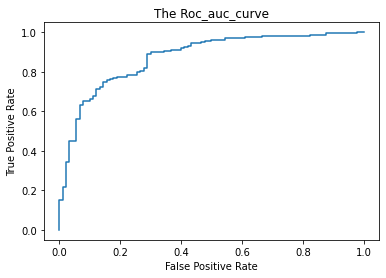

In [0]:
print("Roc_auc score is",roc_auc_score(y_train,y_prob[:,1]))
fpr, tpr,_ = roc_curve(y_train, ss[:,1])
plt.plot(fpr, tpr)
plt.title("The Roc_auc_curve")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

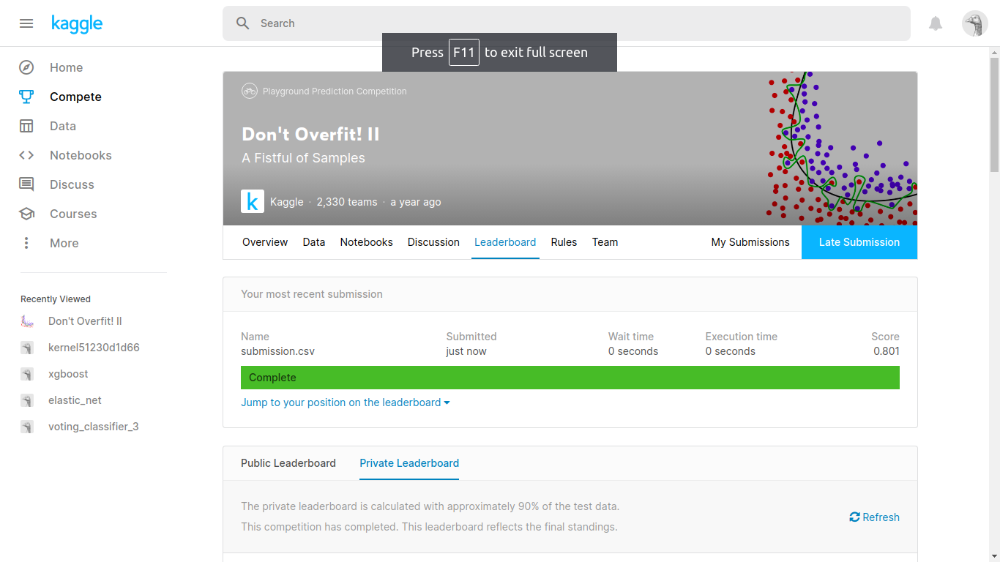

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 15-48-52.png')

####Recursive_feature_elimination

In [0]:
sel = RFE(RandomForestClassifier(n_estimators=100, random_state=110, n_jobs=-1),n_features_to_select=15)
sel.fit(x_train, y_train)

RFE(estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                     class_weight=None, criterion='gini',
                                     max_depth=None, max_features='auto',
                                     max_leaf_nodes=None, max_samples=None,
                                     min_impurity_decrease=0.0,
                                     min_impurity_split=None,
                                     min_samples_leaf=1, min_samples_split=2,
                                     min_weight_fraction_leaf=0.0,
                                     n_estimators=100, n_jobs=-1,
                                     oob_score=False, random_state=110,
                                     verbose=0, warm_start=False),
    n_features_to_select=15, step=1, verbose=0)

In [0]:
sel.get_support()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False,

In [0]:
features = x_train.columns[sel.get_support()]

In [0]:
x_train_rfe = sel.transform(x_train)
x_test_rfe = sel.transform(x_test)

In [0]:
stand_vec = StandardScaler()
x_train_rfe = stand_vec.fit_transform(x_train_rfe)

In [0]:
x_test_rfe = stand_vec.transform(x_test_rfe)

In [0]:
parameters = {"penalty":['l1','l2'],"alpha":np.logspace(-4, 4, 20)}
clff = linear_model.SGDClassifier(loss="log",class_weight=None,random_state=393)
new_best_SGD_LR = GridSearchCV(clff,parameters,cv = 5,scoring = "roc_auc")
new_best_SGD_LR.fit(x_train_rfe,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=SGDClassifier(alpha=0.0001, average=False,
                                     class_weight=None, early_stopping=False,
                                     epsilon=0.1, eta0=0.0, fit_intercept=True,
                                     l1_ratio=0.15, learning_rate='optimal',
                                     loss='log', max_iter=1000,
                                     n_iter_no_change=5, n_jobs=None,
                                     penalty='l2', power_t=0.5,
                                     random_state=393, shuffle=True, tol=0.001,
                                     validation_fraction=0.1, ver...
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                         'pena

In [0]:
new_best_SGD_LR.best_score_

0.8822916666666666

In [0]:
ss = new_best_SGD_LR.predict_proba(x_train_rfe)

Roc_auc score is 0.7427777777777778


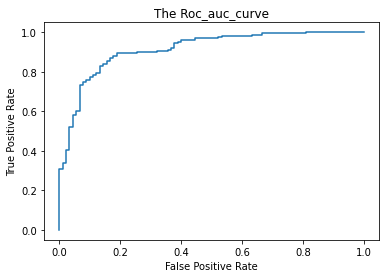

In [0]:
print("Roc_auc score is",roc_auc_score(y_train,y_prob[:,1]))
fpr, tpr,_ = roc_curve(y_train, ss[:,1])
plt.plot(fpr, tpr)
plt.title("The Roc_auc_curve")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-09 16-27-29.png to Screenshot from 2020-05-09 16-27-29.png


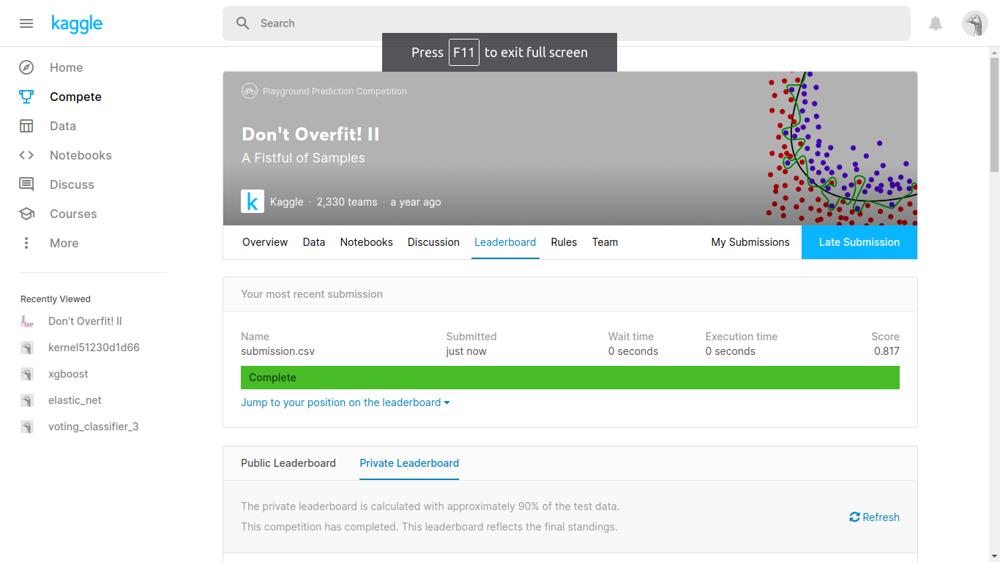

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 16-27-29.png')

###Balancing our data and then applying various techinque

In [0]:
smt = SMOTE(random_state=76,n_jobs=-1)
x_train_smt, y_train_smt = smt.fit_sample(x_train, y_train)

#####Using all the major 5 classifier which i have used earlier, but with balanced data

Using Logistic regression

In [0]:
parameters = {"penalty":['l1','l2'],"alpha":np.logspace(-4, 4, 20)}
clf = linear_model.SGDClassifier(loss="log",random_state = 2)
best_SGD_LR = GridSearchCV(clf,parameters,cv = 5,scoring = "roc_auc")
best_SGD_LR.fit(x_train_smt,y_train_smt)

GridSearchCV(cv=5, error_score=nan,
             estimator=SGDClassifier(alpha=0.0001, average=False,
                                     class_weight=None, early_stopping=False,
                                     epsilon=0.1, eta0=0.0, fit_intercept=True,
                                     l1_ratio=0.15, learning_rate='optimal',
                                     loss='log', max_iter=1000,
                                     n_iter_no_change=5, n_jobs=None,
                                     penalty='l2', power_t=0.5, random_state=2,
                                     shuffle=True, tol=0.001,
                                     validation_fraction=0.1, verbo...
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                         'pena

In [0]:
best_SGD_LR.best_score_

0.9294921875

In [0]:
best_SGD_LR.best_params_

{'alpha': 0.08858667904100823, 'penalty': 'l2'}

In [0]:
y_prob = best_SGD_LR.predict_proba(x_train_smt)

Roc_auc score is 1.0


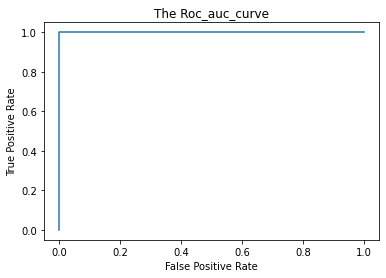

In [0]:
print("Roc_auc score is",roc_auc_score(y_train_smt,y_prob[:,1]))
fpr, tpr,_ = roc_curve(y_train_smt, y_prob[:,1])
plt.plot(fpr, tpr)
plt.title("The Roc_auc_curve")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-09 19-23-59.png to Screenshot from 2020-05-09 19-23-59.png


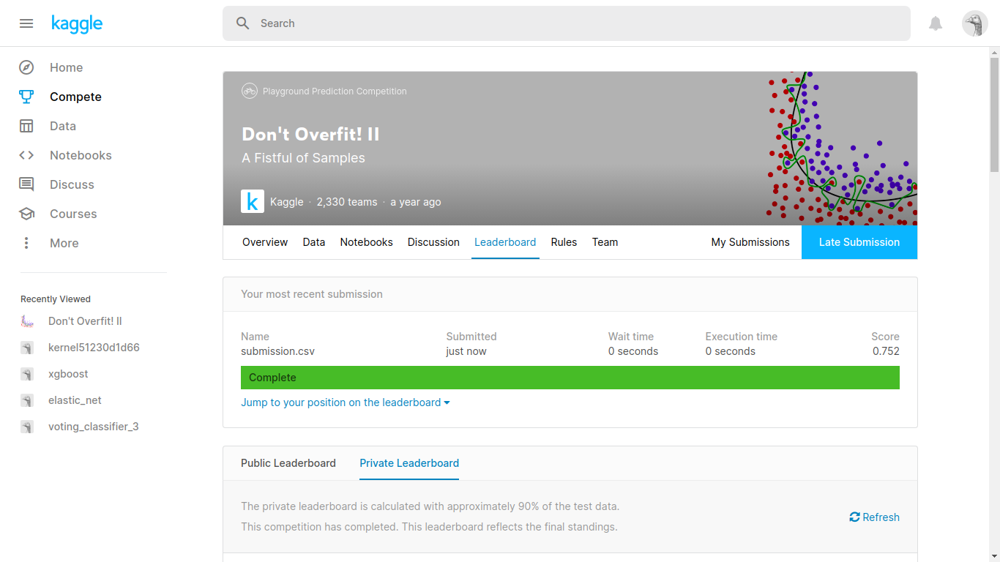

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 17-58-32.png')

Using svm

In [0]:
Cs = list(np.logspace(-4, 4, 20))
gammas = list(np.logspace(-4, 4, 20))
param_grid = {'C':Cs,'gamma':gammas}
svm = SVC(random_state = 4,kernel = 'linear',probability=True)
best_svm = GridSearchCV(svm,param_grid,cv= 5,scoring = "roc_auc")
best_svm.fit(x_train_smt, y_train_smt)

GridSearchCV(cv=5, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='linear', max_iter=-1,
                           probability=True, random_state=4, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.0001, 0.00026366508987303583,
                               0.00069...
                                   0.004832930238571752, 0.012742749857031334,
                                   0.03359818286283781, 0.08858667904100823,
                                   0.23357214690901212, 0.615848211066026,
                                   1.623776739188721, 4.281332398719396,
                                   11.288378916846883, 29.763514416313132,
                                   78.47

In [0]:
best_svm.best_score_

0.930078125

In [0]:
best_svm.best_params_

{'C': 0.03359818286283781, 'gamma': 0.0001}

In [0]:
y_prob = best_svm.predict_proba(x_train_smt)

Roc_auc score is 1.0


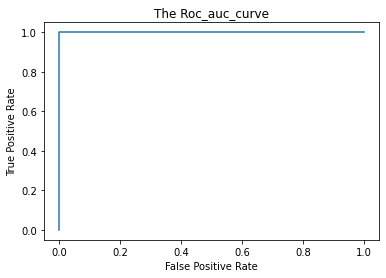

In [0]:
print("Roc_auc score is",roc_auc_score(y_train_smt,y_prob[:,1]))
fpr, tpr,_ = roc_curve(y_train_smt, y_prob[:,1])
plt.plot(fpr, tpr)
plt.title("The Roc_auc_curve")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

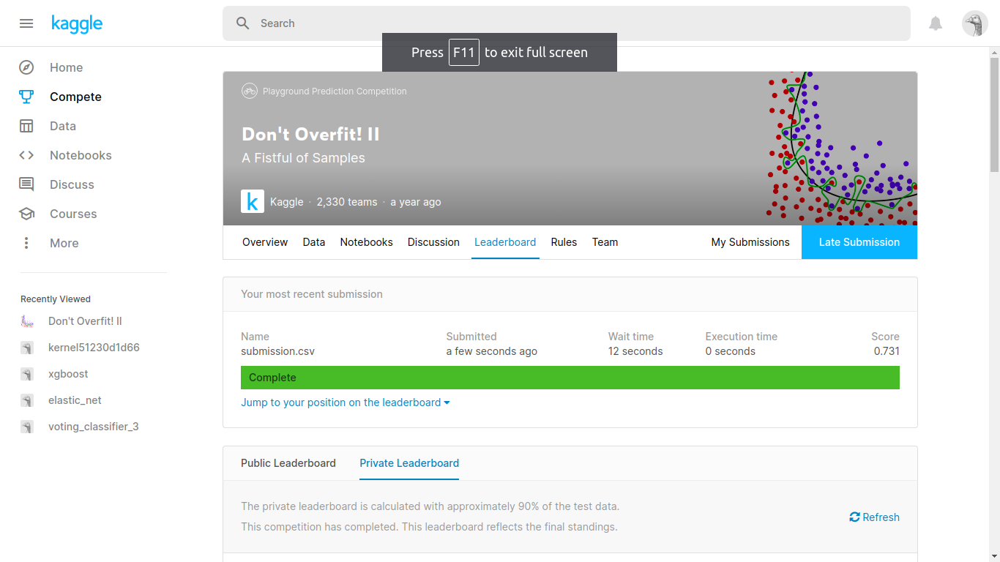

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 19-23-59.png')

Using Xgboost

In [0]:
param_grid = {
 'max_depth': range (2, 30, 2),
 'n_estimators': range(60, 220, 40),
 'learning_rate': [0.05, 0.10, 0.15, 0.20, 0.25, 0.30]}

In [0]:
xgboost = XGBClassifier(random_state=6)
best_xgboost = GridSearchCV(xgboost,param_grid,cv = 5,scoring = "roc_auc")
best_xgboost.fit(x_train_smt,y_train_smt)

GridSearchCV(cv=5, error_score=nan,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=6, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='deprecated', n_jobs=None,
             param_grid={'learning_rate': [0.05, 0.1, 0.15, 0.2, 0.25, 0.3],
                         'max_depth': range(2, 30, 2),
                         'n_estimators': rang

In [0]:
best_xgboost.best_score_

0.9158203125

In [0]:
best_xgboost.best_params_

{'learning_rate': 0.3, 'max_depth': 6, 'n_estimators': 140}

In [0]:
y_prob = best_xgboost.predict_proba(x_train_smt)

Roc_auc score is 1.0


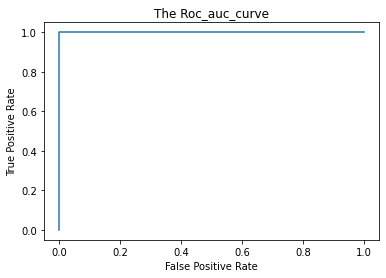

In [0]:
print("Roc_auc score is",roc_auc_score(y_train_smt,y_prob[:,1]))
fpr, tpr,_ = roc_curve(y_train_smt, y_prob[:,1])
plt.plot(fpr, tpr)
plt.title("The Roc_auc_curve")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-09 19-59-29.png to Screenshot from 2020-05-09 19-59-29.png


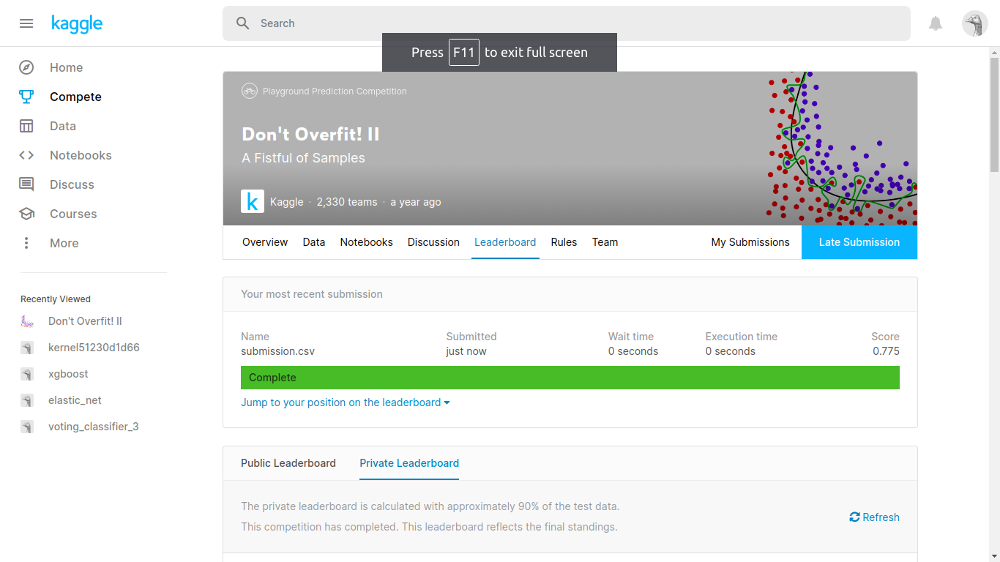

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 19-46-25.png')

Using Randomforest

In [0]:
param_grid = {
 'max_depth': range (2, 30, 2),
 'n_estimators': range(60, 220, 40),
 'criterion' : ['gini','entropy']}
rfc = RandomForestClassifier(random_state=10)
best_rfc = GridSearchCV(rfc ,param_grid,cv = 5,scoring = "roc_auc")
best_rfc.fit(x_train_smt,y_train_smt)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=10,
                                  

In [0]:
best_rfc.best_score_

0.916796875

In [0]:
best_rfc.best_params_

{'criterion': 'gini', 'max_depth': 4, 'n_estimators': 180}

In [0]:
y_prob = best_rfc.predict_proba(x_train_smt)

Roc_auc score is 1.0


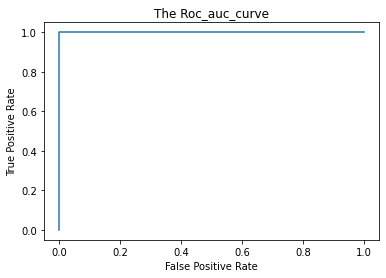

In [0]:
print("Roc_auc score is",roc_auc_score(y_train_smt,y_prob[:,1]))
fpr, tpr,_ = roc_curve(y_train_smt, y_prob[:,1])
plt.plot(fpr, tpr)
plt.title("The Roc_auc_curve")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

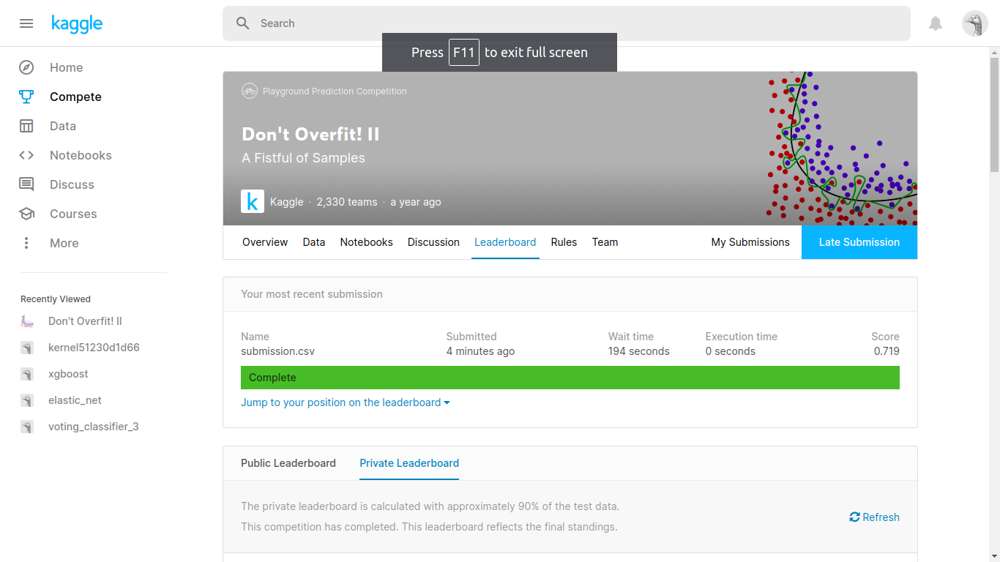

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 19-59-29.png')

Using Knn

In [0]:
param_grid = {'n_neighbors':[3,5,7,9,11,13,15,17,19],'metric':['euclidean','manhattan']}
neigh = KNeighborsClassifier()
best_knn = GridSearchCV(neigh,param_grid,cv = 5,scoring = "roc_auc")
best_knn.fit(x_train_smt,y_train_smt)

GridSearchCV(cv=5, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=None,
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 19]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='roc_auc', verbose=0)

In [0]:
best_knn.best_score_

0.6353515625

In [0]:
best_knn.best_params_

{'metric': 'manhattan', 'n_neighbors': 19}

In [0]:
y_prob = best_knn.predict_proba(x_train_smt)

Roc_auc score is 0.98662109375


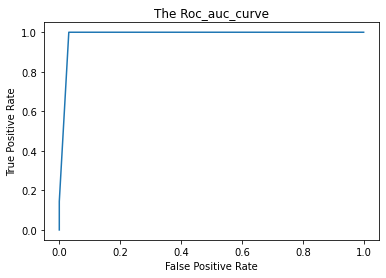

In [0]:
print("Roc_auc score is",roc_auc_score(y_train_smt,y_prob[:,1]))
fpr, tpr,_ = roc_curve(y_train_smt, y_prob[:,1])
plt.plot(fpr, tpr)
plt.title("The Roc_auc_curve")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-09 20-04-26.png to Screenshot from 2020-05-09 20-04-26.png


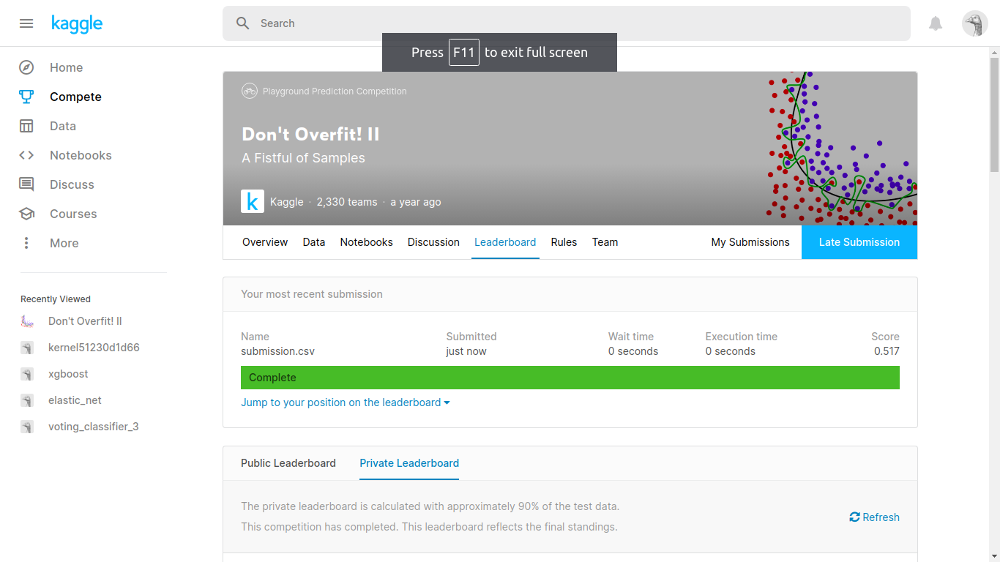

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-09 20-04-26.png')

In [0]:
import numpy as np 
import pandas as pd 
from sklearn.linear_model import LassoCV , LassoLarsCV
from sklearn.model_selection import cross_val_score , GridSearchCV
from sklearn.preprocessing import StandardScaler

##Method_1

Here i have tried to fit linear regression, while doing gridsaerch cv, with different type of regularizer.

This method is motivated by this blog, but many changes and manupulation https://medium.com/analytics-vidhya/just-dont-overfit-e2fddd28eb29

It has used LassoCV

###Lasso_regularizier

In [0]:
train = pd.read_csv("../input/datarar/train.csv")


In [0]:
test = pd.read_csv("../input/datarar/test.csv")


In [0]:
y_train = train['target']
x_train  = train.drop(['id' ,'target'] ,axis = 1)
test = test.drop('id',axis = 1)


In [0]:
from sklearn.linear_model import Lasso,Ridge,ElasticNet
lasso = Lasso()


In [0]:
alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
param_grid = dict(alpha=alpha)

In [0]:
grid = GridSearchCV(estimator=lasso, param_grid=param_grid, scoring='r2', verbose=1, n_jobs=-1)
grid.fit(x_train, y_train)

Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    1.7s finished


GridSearchCV(cv=None, error_score=nan,
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='deprecated', n_jobs=-1,
             param_grid={'alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='r2', verbose=1)

In [0]:
submit = pd.read_csv('../input/dont-overfit-ii/sample_submission.csv')
submit.head()

,id,target
0,250,0
1,251,0
2,252,0
3,253,0
4,254,0


In [0]:
predict = grid.predict(test)

In [0]:
greater_than_one = 0
less_than_zero = 0
for i in predict:
    if i<0:
        less_than_zero+=1
    else:
        greater_than_one+=1

In [0]:
print(greater_than_one,less_than_zero)

19214 536


As here some values are greater than 1, which should be made equal to one, beacuse probability score lies between 0 to 1

In [0]:
ss = []
for i in predict:
    if i>=1:
        ss.append(1)
    elif i<=0:
        ss.append(0)
    else:
        ss.append(i)

In [0]:
submit['target'] = ss
submit.head()

In [0]:
submit.to_csv('submit.csv', index = False)


In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-06 01-27-39.png to Screenshot from 2020-05-06 01-27-39.png


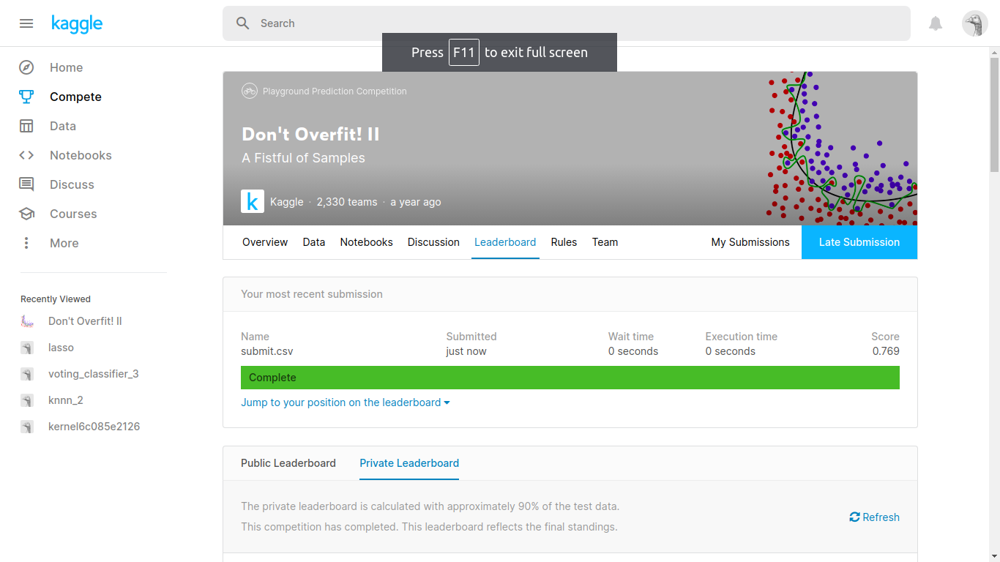

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-06 01-27-39.png')

###Ridge_regualrizer

In [0]:
import numpy as np 
import pandas as pd 
from sklearn.linear_model import LassoCV , LassoLarsCV
from sklearn.model_selection import cross_val_score , GridSearchCV
from sklearn.preprocessing import StandardScaler

In [0]:
train = pd.read_csv("../input/datarar/train.csv")


In [0]:
test = pd.read_csv("../input/datarar/test.csv")


In [0]:
y_train = train['target']
x_train  = train.drop(['id' ,'target'] ,axis = 1)
test = test.drop('id',axis = 1)


In [0]:
from sklearn.linear_model import Lasso,Ridge,ElasticNet
ridge = Ridge()


In [0]:
alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
param_grid = dict(alpha=alpha)

In [0]:
grid = GridSearchCV(estimator=ridge, param_grid=param_grid, scoring='r2', verbose=1, n_jobs=-1)
grid.fit(x_train, y_train)

Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    1.7s finished


GridSearchCV(cv=None, error_score=nan,
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='deprecated', n_jobs=-1,
             param_grid={'alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='r2', verbose=1)

In [0]:
submit = pd.read_csv('../input/dont-overfit-ii/sample_submission.csv')
submit.head()

,id,target
0,250,0
1,251,0
2,252,0
3,253,0
4,254,0


In [0]:
predict = grid.predict(test)

In [0]:
greater_than_one = 0
less_than_zero = 0
for i in predict:
    if i<0:
        less_than_zero+=1
    else:
        greater_than_one+=1

In [0]:
print(greater_than_one,less_than_zero)

19214 536


As here some values are greater than 1, which should be made equal to one, beacuse probability score lies between 0 to 1

In [0]:
ss = []
for i in predict:
    if i>=1:
        ss.append(1)
    elif i<=0:
        ss.append(0)
    else:
        ss.append(i)

In [0]:
submit['target'] = ss
submit.head()

,id,target
0,250,0.614757
1,251,0.470628
2,252,0.632355
3,253,1.000000
4,254,0.722787


In [0]:
submit.to_csv('submit.csv', index = False)


In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-06 01-29-52.png to Screenshot from 2020-05-06 01-29-52.png


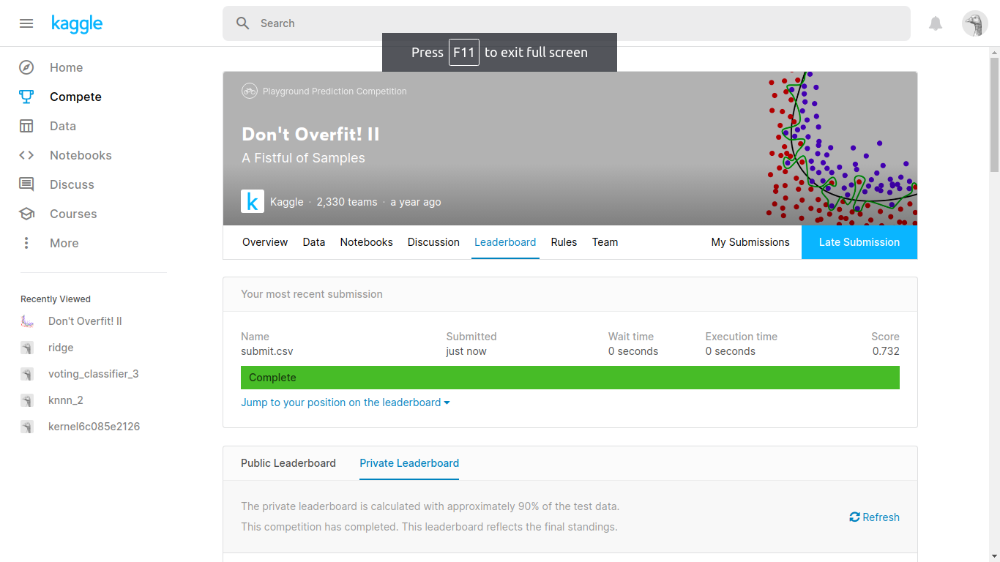

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-06 01-29-52.png')

###Elastic_net

In [0]:
import numpy as np 
import pandas as pd 
from sklearn.linear_model import LassoCV , LassoLarsCV
from sklearn.model_selection import cross_val_score , GridSearchCV
from sklearn.preprocessing import StandardScaler

In [0]:
train = pd.read_csv("../input/datarar/train.csv")


In [0]:
test = pd.read_csv("../input/datarar/test.csv")


In [0]:
y_train = train['target']
x_train  = train.drop(['id' ,'target'] ,axis = 1)
test = test.drop('id',axis = 1)


In [0]:
from sklearn.linear_model import Lasso,Ridge,ElasticNet
elastic_net = ElasticNet()


In [0]:
alpha = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
l1_ratio = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
param_grid = dict(alpha=alpha, l1_ratio=l1_ratio)

In [0]:
grid = GridSearchCV(estimator=elastic_net, param_grid=param_grid, scoring='r2', verbose=1, n_jobs=-1)
grid.fit(x_train, y_train)

In [0]:
submit = pd.read_csv('../input/dont-overfit-ii/sample_submission.csv')
submit.head()

,id,target
0,250,0
1,251,0
2,252,0
3,253,0
4,254,0


In [0]:
predict = grid.predict(test)

In [0]:
greater_than_one = 0
less_than_zero = 0
for i in predict:
    if i<0:
        less_than_zero+=1
    else:
        greater_than_one+=1

In [0]:
print(greater_than_one,less_than_zero)

19440 310


As here some values are greater than 1, which should be made equal to one, beacuse probability score lies between 0 to 1

In [0]:
ss = []
for i in predict:
    if i>=1:
        ss.append(1)
    elif i<=0:
        ss.append(0)
    else:
        ss.append(i)

In [0]:
submit['target'] = ss
submit.head()

,id,target
0,250,0.530384
1,251,0.352055
2,252,0.508634
3,253,1.000000
4,254,0.578750


In [0]:
submit.to_csv('submit.csv', index = False)


In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-06 01-33-16.png to Screenshot from 2020-05-06 01-33-16.png


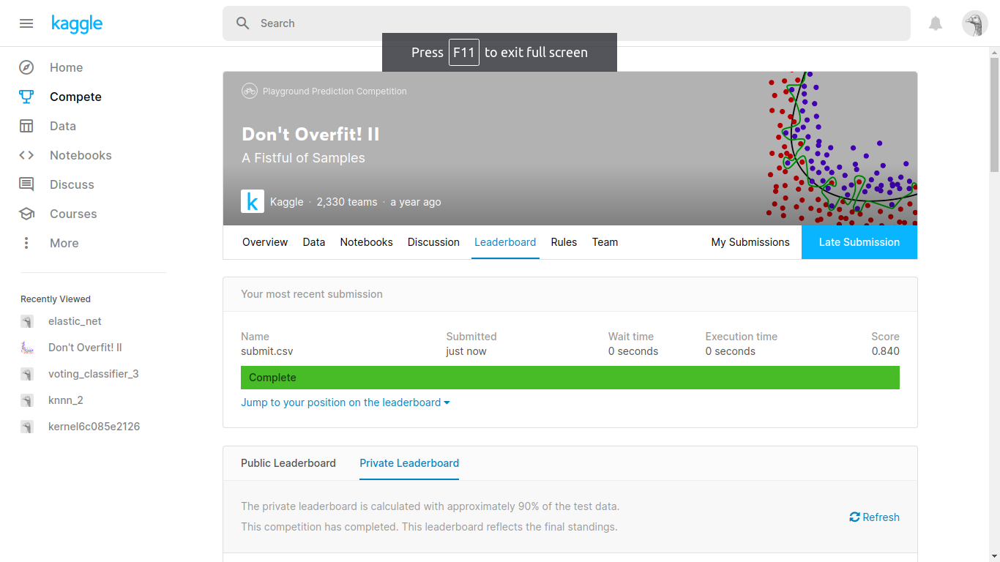

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-06 01-33-16.png')

In [0]:
from google.colab import files
uploaded = files.upload()

Saving IMG-20200506-WA0005.jpeg to IMG-20200506-WA0005.jpeg


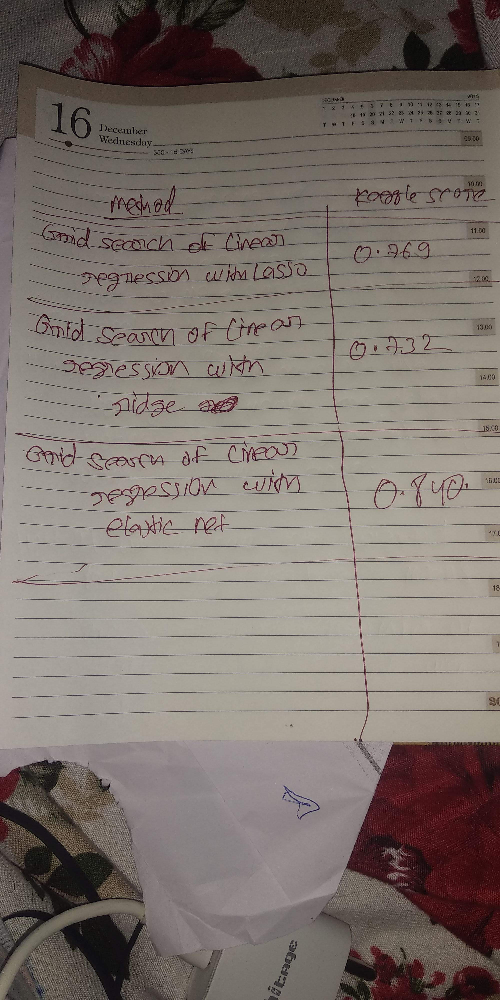

In [0]:
from IPython.display import Image
Image(filename='IMG-20200506-WA0005.jpeg')

##Model_2

Here i have used the same pdf, which i got in comment section of case study.

###Knn

In [0]:
import numpy as np
np.random.seed(42)
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold,cross_val_score
import matplotlib.pyplot as plt
from sklearn.calibration import CalibratedClassifierCV
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD

In [0]:
train = pd.read_csv("../input/datarar/train.csv")


In [0]:
test = pd.read_csv("../input/datarar/test.csv")


In [0]:
def feature_engg(df, if_test = False):
    if if_test:
        temp = df.drop(['id'], axis=1)
    else:
        temp = df.drop(['id','target'], axis=1)
    # Mean and Std FE
    df['mean'] = np.mean(temp, axis=1)
    df['std'] = np.std(temp, axis=1)
    # Trigometric FE
    sin_temp = np.sin(temp)
    cos_temp = np.cos(temp)
    tan_temp = np.tan(temp)
    df['mean_sin'] = np.mean(sin_temp, axis=1)
    df['mean_cos'] = np.mean(cos_temp, axis=1)
    df['mean_tan'] = np.mean(tan_temp, axis=1)
    # Hyperbolic FE
    sinh_temp = np.sinh(temp)
    cosh_temp = np.cosh(temp)
    tanh_temp = np.tanh(temp)
    df['mean_sinh'] = np.mean(sin_temp, axis=1)
    df['mean_cosh'] = np.mean(cos_temp, axis=1)
    df['mean_tanh'] = np.mean(tan_temp, axis=1)
    # Exponents FE
    exp_temp = np.exp(temp)
    expm1_temp = np.expm1(temp)
    exp2_temp = np.exp2(temp)
    df['mean_exp'] = np.mean(exp_temp, axis=1)
    df['mean_expm1'] = np.mean(expm1_temp, axis=1)
    df['mean_exp2'] = np.mean(exp2_temp, axis=1)
    # Polynomial FE
    # X**2
    df['mean_x2'] = np.mean(np.power(temp,2), axis=1)
    # X**3
    df['mean_x3'] = np.mean(np.power(temp,3), axis=1)
    # X**4
    df['mean_x4'] = np.mean(np.power(temp,4), axis=1)
    return df

In [0]:
df_train = feature_engg(train)
df_train.head(5)

,id,target,0,1,2,3,4,5,6,7,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,0,1.0,-0.098,2.165,0.681,-0.614,1.309,-0.455,-0.236,0.276,...,-0.315591,-0.010536,0.537968,-0.315591,1.760647,0.760647,1.315869,1.182425,0.015243,3.584848
1,1,0.0,1.081,-0.973,-0.383,0.326,-0.428,0.317,1.172,0.352,...,0.607457,0.075490,0.611600,0.607457,1.712292,0.712292,1.324817,0.976056,0.047272,2.766570
2,2,1.0,-0.523,-0.089,-0.348,0.148,-0.022,0.404,-0.023,-0.172,...,0.104777,-0.005509,0.599358,0.104777,1.749107,0.749107,1.313960,1.023024,0.266454,3.092631
3,3,1.0,0.067,-0.021,0.392,-1.637,-0.446,-0.725,-1.035,0.834,...,0.891722,0.046067,0.645721,0.891722,1.752101,0.752101,1.326229,0.887980,0.371308,2.553467
4,4,1.0,2.347,-0.831,0.511,-0.021,1.225,1.594,0.585,1.509,...,0.274261,0.059548,0.643508,0.274261,1.861741,0.861741,1.377569,0.901115,0.613952,2.671541


In [0]:
df_test = feature_engg(test, True)
df_test.head(5)

,id,0,1,2,3,4,5,6,7,8,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,250,0.500,-1.033,-1.595,0.309,-0.714,0.502,0.535,-0.129,-0.687,...,0.565830,0.094378,0.609398,0.565830,1.904397,0.904397,1.404195,0.985912,0.477020,2.913247
1,251,0.776,0.914,-0.494,1.347,-0.867,0.480,0.578,-0.313,0.203,...,-1.641918,-0.018425,0.570495,-1.641918,1.642217,0.642217,1.265487,1.094274,-0.128315,3.281111
2,252,1.750,0.509,-0.057,0.835,-0.476,1.428,-0.701,-2.009,-1.378,...,-0.516155,-0.012641,0.611053,-0.516155,1.517775,0.517775,1.214393,0.994294,-0.330590,3.062801
3,253,-0.556,-1.855,-0.682,0.578,1.592,0.512,-1.419,0.722,0.511,...,-0.816079,0.002689,0.610619,-0.816079,1.566765,0.566765,1.243412,0.956136,-0.076546,2.382968
4,254,0.754,-0.245,1.173,-1.623,0.009,0.370,0.781,-1.763,-1.432,...,-1.547172,0.067329,0.611907,-1.547172,1.849024,0.849024,1.374870,0.988710,0.371320,3.079160


In [0]:
tr_X = df_train.drop(['id','target'], axis=1)
tr_y = df_train['target'].values
ts_X = df_test.drop(['id'], axis=1)

In [0]:
exp_rat = []
for i in range(2,min(tr_X.shape[0],tr_X.shape[1])):
    trunsvd = TruncatedSVD(n_components=i)
    trunsvd.fit(tr_X,tr_y)
    exp_rat.append(np.sum(trunsvd.explained_variance_ratio_))

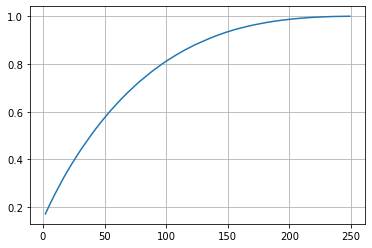

In [0]:
plt.plot(np.arange(2,min(tr_X.shape[0],tr_X.shape[1])),exp_rat)
plt.grid()
plt.show()

In [0]:
# Fit and transform on train data and transform on cv and test data
trunsvd = TruncatedSVD(n_components=175)
tr_X = trunsvd.fit_transform(tr_X,tr_y)
ts_X = trunsvd.transform(ts_X)

In [0]:
stand_vec = StandardScaler()
tr_X = stand_vec.fit_transform(tr_X)
pd.DataFrame(tr_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,-0.164532,0.487939,0.711550,1.063592,0.288814,0.679757,1.419163,-1.929692,1.662674,-1.552939,...,0.674197,-0.500293,2.319579,-0.841767,0.446332,1.842349,-0.889885,-0.612941,0.451177,-1.408989
1,0.032834,0.345192,0.684653,-0.683363,-1.071050,1.601912,-1.389540,-0.982794,-1.583500,0.530116,...,1.159822,-0.080116,0.458993,1.577653,-1.188102,0.410867,-2.342873,0.429029,-0.071122,1.187568
2,-0.042842,-1.009867,0.774578,0.258092,-1.530399,0.864581,-1.308243,-1.458523,1.559741,-0.128236,...,-0.325688,-0.212428,-0.324620,-1.406312,-0.265334,-0.870585,0.072708,0.596910,-0.163540,-0.186299
3,0.086111,-0.816340,-0.788503,0.657952,-0.141692,-1.418505,0.069040,1.360545,-0.419088,1.069888,...,-0.649263,0.210520,-0.117820,0.526989,-1.687033,0.003238,-0.373623,0.490749,1.195760,1.715022
4,-0.047900,0.107642,0.455264,0.929138,0.073400,1.730522,0.176378,-1.868323,-0.005129,0.789978,...,0.102664,-0.797968,-0.681129,1.251984,-1.929878,0.592734,0.444313,-1.195970,-0.398205,-0.075411


In [0]:
ts_X = stand_vec.transform(ts_X)
pd.DataFrame(ts_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,0.014912,-0.741837,0.274744,-0.063368,-0.432929,0.152815,-0.069140,0.272741,-0.981800,0.261619,...,-0.440932,2.019409,-0.674286,0.248574,0.172730,-0.201424,-0.133651,-0.679212,2.584033,-2.775280
1,-0.366959,-0.919499,-0.443526,0.626691,-0.076199,-0.502496,-0.784105,-0.332528,0.016349,0.193139,...,-3.586539,1.506607,1.235645,1.952467,0.481643,2.181453,0.265854,-0.255515,1.209500,2.050327
2,-0.178551,-0.651318,0.401148,-0.862620,0.579046,0.174308,-0.264050,-0.387602,1.146149,-0.298789,...,3.199833,0.978812,0.296180,0.984599,-1.230266,0.013612,-0.227200,-2.038692,0.130845,-0.244971
3,-0.226939,-1.074750,0.992441,-0.586995,0.002888,-0.118334,0.307092,-0.535269,0.015127,-0.167287,...,-0.924251,0.810002,0.241974,-1.006728,-0.351655,1.283195,-1.792211,3.315743,-4.006598,1.562571
4,-0.330429,-0.465384,-0.621555,-1.089506,-1.306731,-0.059321,0.148408,-0.022165,0.001760,-0.500889,...,-1.122691,0.482733,-2.019647,-0.426909,0.752649,0.194994,0.969147,-2.318632,2.219397,1.524134


In [0]:
def hyperparameter_model(models, params):
    str_cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=42)
    grid_clf = GridSearchCV(models, params, cv=str_cv, return_train_score=True,scoring='roc_auc',verbose = 1)
    grid_clf.fit(tr_X, tr_y)
    return grid_clf

In [0]:
from sklearn.neighbors import KNeighborsClassifier

In [0]:
params = {'n_neighbors':np.arange(3,51,2).tolist(), 'algorithm': ['kd_tree','brute']}
knn_model = KNeighborsClassifier()
knn_clf = hyperparameter_model(knn_model, params)

Fitting 50 folds for each of 48 candidates, totalling 2400 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 2400 out of 2400 | elapsed:   41.7s finished


In [0]:
cv_pvt = pd.pivot_table(pd.DataFrame(knn_clf.cv_results_),values='mean_test_score', index='param_n_neighbors', columns='param_algorithm')

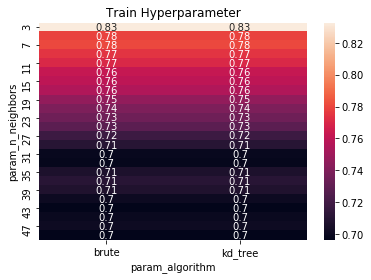

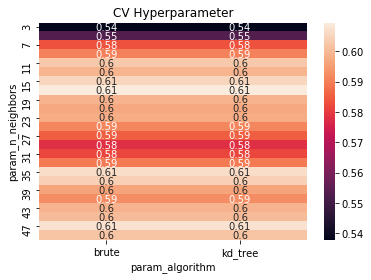

In [0]:
tr_pvt = pd.pivot_table(pd.DataFrame(knn_clf.cv_results_),values='mean_train_score', index='param_n_neighbors',columns='param_algorithm')
plt.title('Train Hyperparameter')
sns.heatmap(tr_pvt, annot=True)
plt.show()
plt.title('CV Hyperparameter')
sns.heatmap(cv_pvt, annot=True)
plt.show()

In [0]:
print(knn_clf.best_params_)
clf = CalibratedClassifierCV(knn_clf, cv=3)
clf.fit(tr_X,tr_y)

{'algorithm': 'kd_tree', 'n_neighbors': 17}
Fitting 50 folds for each of 48 candidates, totalling 2400 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 2400 out of 2400 | elapsed:   27.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 50 folds for each of 48 candidates, totalling 2400 fits


In [0]:
# Create a submssion format to make submission in Kaggle
temp_id = df_test['id']
knn_csv = clf.predict_proba(ts_X)[:,1]
knn_df = pd.DataFrame(np.column_stack((temp_id,knn_csv)),columns=['id','target'])
knn_df['id'] = knn_df['id'].astype('int32')

In [0]:
knn_df.head()

In [0]:
knn_df.to_csv('submission.csv', index=False)

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-05 21-29-57.png to Screenshot from 2020-05-05 21-29-57.png


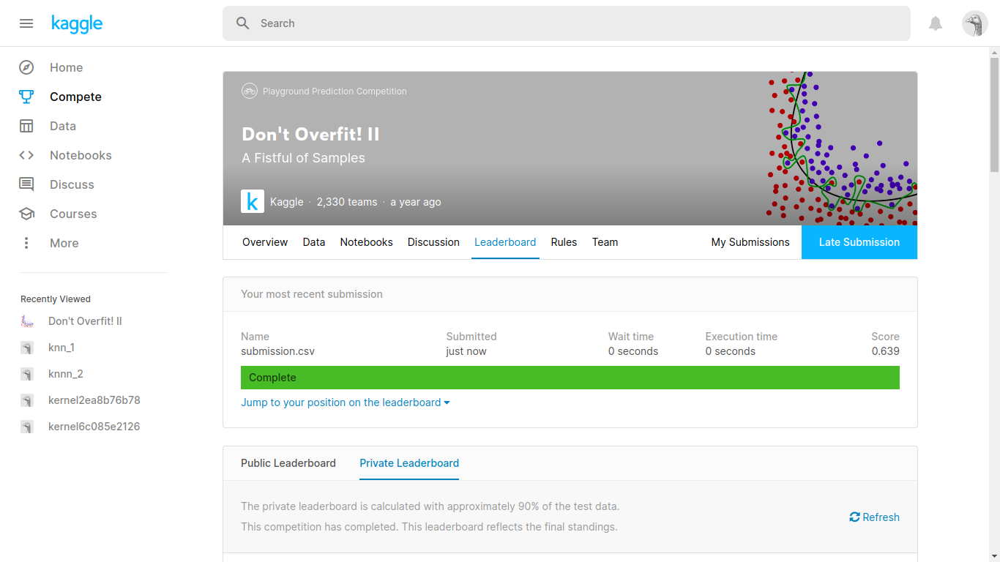

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-05 21-29-57.png')

###Logistic_regression

In [0]:
import numpy as np
np.random.seed(42)
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold,cross_val_score
import matplotlib.pyplot as plt
from sklearn.calibration import CalibratedClassifierCV
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD

In [0]:
train = pd.read_csv("../input/datarar/train.csv")


In [0]:
test = pd.read_csv("../input/datarar/test.csv")


In [0]:
def feature_engg(df, if_test = False):
    if if_test:
        temp = df.drop(['id'], axis=1)
    else:
        temp = df.drop(['id','target'], axis=1)
    # Mean and Std FE
    df['mean'] = np.mean(temp, axis=1)
    df['std'] = np.std(temp, axis=1)
    # Trigometric FE
    sin_temp = np.sin(temp)
    cos_temp = np.cos(temp)
    tan_temp = np.tan(temp)
    df['mean_sin'] = np.mean(sin_temp, axis=1)
    df['mean_cos'] = np.mean(cos_temp, axis=1)
    df['mean_tan'] = np.mean(tan_temp, axis=1)
    # Hyperbolic FE
    sinh_temp = np.sinh(temp)
    cosh_temp = np.cosh(temp)
    tanh_temp = np.tanh(temp)
    df['mean_sinh'] = np.mean(sin_temp, axis=1)
    df['mean_cosh'] = np.mean(cos_temp, axis=1)
    df['mean_tanh'] = np.mean(tan_temp, axis=1)
    # Exponents FE
    exp_temp = np.exp(temp)
    expm1_temp = np.expm1(temp)
    exp2_temp = np.exp2(temp)
    df['mean_exp'] = np.mean(exp_temp, axis=1)
    df['mean_expm1'] = np.mean(expm1_temp, axis=1)
    df['mean_exp2'] = np.mean(exp2_temp, axis=1)
    # Polynomial FE
    # X**2
    df['mean_x2'] = np.mean(np.power(temp,2), axis=1)
    # X**3
    df['mean_x3'] = np.mean(np.power(temp,3), axis=1)
    # X**4
    df['mean_x4'] = np.mean(np.power(temp,4), axis=1)
    return df

In [0]:
df_train = feature_engg(train)
df_train.head(5)

,id,target,0,1,2,3,4,5,6,7,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,0,1.0,-0.098,2.165,0.681,-0.614,1.309,-0.455,-0.236,0.276,...,-0.315591,-0.010536,0.537968,-0.315591,1.760647,0.760647,1.315869,1.182425,0.015243,3.584848
1,1,0.0,1.081,-0.973,-0.383,0.326,-0.428,0.317,1.172,0.352,...,0.607457,0.075490,0.611600,0.607457,1.712292,0.712292,1.324817,0.976056,0.047272,2.766570
2,2,1.0,-0.523,-0.089,-0.348,0.148,-0.022,0.404,-0.023,-0.172,...,0.104777,-0.005509,0.599358,0.104777,1.749107,0.749107,1.313960,1.023024,0.266454,3.092631
3,3,1.0,0.067,-0.021,0.392,-1.637,-0.446,-0.725,-1.035,0.834,...,0.891722,0.046067,0.645721,0.891722,1.752101,0.752101,1.326229,0.887980,0.371308,2.553467
4,4,1.0,2.347,-0.831,0.511,-0.021,1.225,1.594,0.585,1.509,...,0.274261,0.059548,0.643508,0.274261,1.861741,0.861741,1.377569,0.901115,0.613952,2.671541


In [0]:
df_test = feature_engg(test, True)
df_test.head(5)

,id,0,1,2,3,4,5,6,7,8,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,250,0.500,-1.033,-1.595,0.309,-0.714,0.502,0.535,-0.129,-0.687,...,0.565830,0.094378,0.609398,0.565830,1.904397,0.904397,1.404195,0.985912,0.477020,2.913247
1,251,0.776,0.914,-0.494,1.347,-0.867,0.480,0.578,-0.313,0.203,...,-1.641918,-0.018425,0.570495,-1.641918,1.642217,0.642217,1.265487,1.094274,-0.128315,3.281111
2,252,1.750,0.509,-0.057,0.835,-0.476,1.428,-0.701,-2.009,-1.378,...,-0.516155,-0.012641,0.611053,-0.516155,1.517775,0.517775,1.214393,0.994294,-0.330590,3.062801
3,253,-0.556,-1.855,-0.682,0.578,1.592,0.512,-1.419,0.722,0.511,...,-0.816079,0.002689,0.610619,-0.816079,1.566765,0.566765,1.243412,0.956136,-0.076546,2.382968
4,254,0.754,-0.245,1.173,-1.623,0.009,0.370,0.781,-1.763,-1.432,...,-1.547172,0.067329,0.611907,-1.547172,1.849024,0.849024,1.374870,0.988710,0.371320,3.079160


In [0]:
tr_X = df_train.drop(['id','target'], axis=1)
tr_y = df_train['target'].values
ts_X = df_test.drop(['id'], axis=1)

In [0]:
exp_rat = []
for i in range(2,min(tr_X.shape[0],tr_X.shape[1])):
    trunsvd = TruncatedSVD(n_components=i)
    trunsvd.fit(tr_X,tr_y)
    exp_rat.append(np.sum(trunsvd.explained_variance_ratio_))

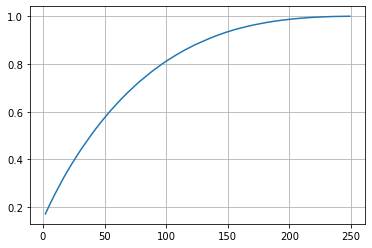

In [0]:
plt.plot(np.arange(2,min(tr_X.shape[0],tr_X.shape[1])),exp_rat)
plt.grid()
plt.show()

In [0]:
# Fit and transform on train data and transform on cv and test data
trunsvd = TruncatedSVD(n_components=175)
tr_X = trunsvd.fit_transform(tr_X,tr_y)
ts_X = trunsvd.transform(ts_X)

In [0]:
stand_vec = StandardScaler()
tr_X = stand_vec.fit_transform(tr_X)
pd.DataFrame(tr_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,-0.164532,0.487939,0.711550,1.063592,0.288814,0.679757,1.419163,-1.929692,1.662674,-1.552939,...,0.674197,-0.500293,2.319579,-0.841767,0.446332,1.842349,-0.889885,-0.612941,0.451177,-1.408989
1,0.032834,0.345192,0.684653,-0.683363,-1.071050,1.601912,-1.389540,-0.982794,-1.583500,0.530116,...,1.159822,-0.080116,0.458993,1.577653,-1.188102,0.410867,-2.342873,0.429029,-0.071122,1.187568
2,-0.042842,-1.009867,0.774578,0.258092,-1.530399,0.864581,-1.308243,-1.458523,1.559741,-0.128236,...,-0.325688,-0.212428,-0.324620,-1.406312,-0.265334,-0.870585,0.072708,0.596910,-0.163540,-0.186299
3,0.086111,-0.816340,-0.788503,0.657952,-0.141692,-1.418505,0.069040,1.360545,-0.419088,1.069888,...,-0.649263,0.210520,-0.117820,0.526989,-1.687033,0.003238,-0.373623,0.490749,1.195760,1.715022
4,-0.047900,0.107642,0.455264,0.929138,0.073400,1.730522,0.176378,-1.868323,-0.005129,0.789978,...,0.102664,-0.797968,-0.681129,1.251984,-1.929878,0.592734,0.444313,-1.195970,-0.398205,-0.075411


In [0]:
ts_X = stand_vec.transform(ts_X)
pd.DataFrame(ts_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,0.014912,-0.741837,0.274744,-0.063368,-0.432929,0.152815,-0.069140,0.272741,-0.981800,0.261619,...,-0.440932,2.019409,-0.674286,0.248574,0.172730,-0.201424,-0.133651,-0.679212,2.584033,-2.775280
1,-0.366959,-0.919499,-0.443526,0.626691,-0.076199,-0.502496,-0.784105,-0.332528,0.016349,0.193139,...,-3.586539,1.506607,1.235645,1.952467,0.481643,2.181453,0.265854,-0.255515,1.209500,2.050327
2,-0.178551,-0.651318,0.401148,-0.862620,0.579046,0.174308,-0.264050,-0.387602,1.146149,-0.298789,...,3.199833,0.978812,0.296180,0.984599,-1.230266,0.013612,-0.227200,-2.038692,0.130845,-0.244971
3,-0.226939,-1.074750,0.992441,-0.586995,0.002888,-0.118334,0.307092,-0.535269,0.015127,-0.167287,...,-0.924251,0.810002,0.241974,-1.006728,-0.351655,1.283195,-1.792211,3.315743,-4.006598,1.562571
4,-0.330429,-0.465384,-0.621555,-1.089506,-1.306731,-0.059321,0.148408,-0.022165,0.001760,-0.500889,...,-1.122691,0.482733,-2.019647,-0.426909,0.752649,0.194994,0.969147,-2.318632,2.219397,1.524134


In [0]:
def hyperparameter_model(models, params):
    str_cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=42)
    grid_clf = GridSearchCV(models, params, cv=str_cv, return_train_score=True,scoring='roc_auc',verbose = 1)
    grid_clf.fit(tr_X, tr_y)
    return grid_clf

In [0]:
from sklearn.linear_model import LogisticRegression

In [0]:
params = {'penalty':['l1', 'l2', 'elasticnet'], 'C':[10**i for i in range(-4,5)], 'solver':['liblinear','sag']}
log_model = LogisticRegression(random_state=42, class_weight='balanced')
log_clf = hyperparameter_model(log_model, params)

Fitting 50 folds for each of 54 candidates, totalling 2700 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 2700 out of 2700 | elapsed:   35.2s finished


In [0]:
print(log_clf.best_params_)
clf = CalibratedClassifierCV(log_clf, cv=3)
clf.fit(tr_X,tr_y)

{'C': 1000, 'penalty': 'l1', 'solver': 'liblinear'}
Fitting 50 folds for each of 54 candidates, totalling 2700 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 2700 out of 2700 | elapsed:   26.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 50 folds for each of 54 candidates, totalling 2700 fits


[Parallel(n_jobs=1)]: Done 2700 out of 2700 | elapsed:   26.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 50 folds for each of 54 candidates, totalling 2700 fits


[Parallel(n_jobs=1)]: Done 2700 out of 2700 | elapsed:   26.5s finished


CalibratedClassifierCV(base_estimator=GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=5, n_splits=10, random_state=42),
                                                   error_score=nan,
                                                   estimator=LogisticRegression(C=1.0,
                                                                                class_weight='balanced',
                                                                                dual=False,
                                                                                fit_intercept=True,
                                                                                intercept_scaling=1,
                                                                                l1_ratio=None,
                                                                                max_iter=100,
                                                                                multi_class='auto',
                                    

In [0]:
temp_id = df_test['id']
log_csv = clf.predict_proba(ts_X)[:,1]
log_df = pd.DataFrame(np.column_stack((temp_id,log_csv)),columns=['id','target'])
log_df['id'] = log_df['id'].astype('int32')

In [0]:
log_df.head()

,id,target
0,250,0.654475
1,251,0.622241
2,252,0.653991
3,253,0.789161
4,254,0.619674


In [0]:
log_df.to_csv('submission.csv', index=False)

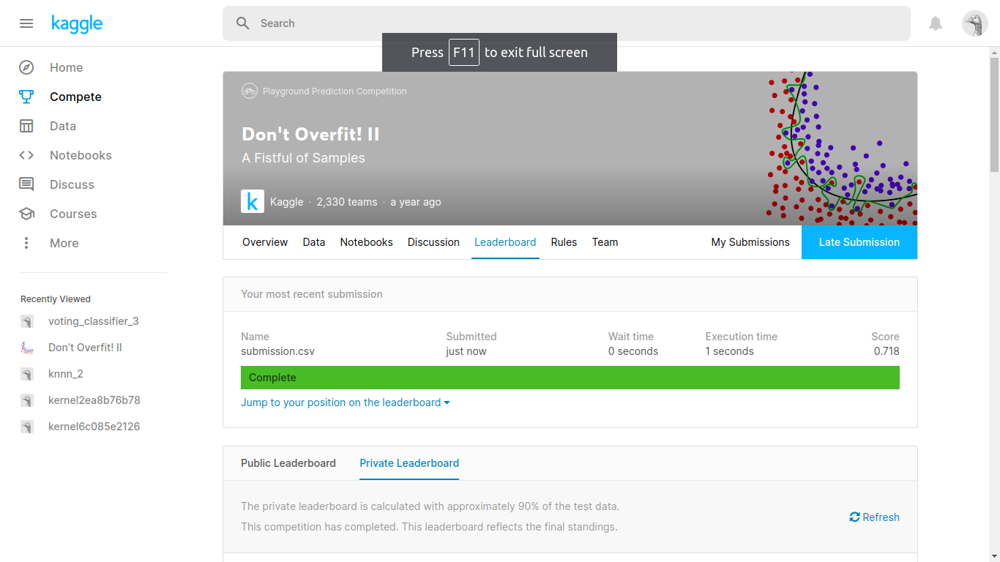

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-06 01-08-09.png')

###SVC

In [0]:
import numpy as np
np.random.seed(42)
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold,cross_val_score
import matplotlib.pyplot as plt
from sklearn.calibration import CalibratedClassifierCV
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD

In [0]:
train = pd.read_csv("../input/datarar/train.csv")


In [0]:
test = pd.read_csv("../input/datarar/test.csv")


In [0]:
def feature_engg(df, if_test = False):
    if if_test:
        temp = df.drop(['id'], axis=1)
    else:
        temp = df.drop(['id','target'], axis=1)
    # Mean and Std FE
    df['mean'] = np.mean(temp, axis=1)
    df['std'] = np.std(temp, axis=1)
    # Trigometric FE
    sin_temp = np.sin(temp)
    cos_temp = np.cos(temp)
    tan_temp = np.tan(temp)
    df['mean_sin'] = np.mean(sin_temp, axis=1)
    df['mean_cos'] = np.mean(cos_temp, axis=1)
    df['mean_tan'] = np.mean(tan_temp, axis=1)
    # Hyperbolic FE
    sinh_temp = np.sinh(temp)
    cosh_temp = np.cosh(temp)
    tanh_temp = np.tanh(temp)
    df['mean_sinh'] = np.mean(sin_temp, axis=1)
    df['mean_cosh'] = np.mean(cos_temp, axis=1)
    df['mean_tanh'] = np.mean(tan_temp, axis=1)
    # Exponents FE
    exp_temp = np.exp(temp)
    expm1_temp = np.expm1(temp)
    exp2_temp = np.exp2(temp)
    df['mean_exp'] = np.mean(exp_temp, axis=1)
    df['mean_expm1'] = np.mean(expm1_temp, axis=1)
    df['mean_exp2'] = np.mean(exp2_temp, axis=1)
    # Polynomial FE
    # X**2
    df['mean_x2'] = np.mean(np.power(temp,2), axis=1)
    # X**3
    df['mean_x3'] = np.mean(np.power(temp,3), axis=1)
    # X**4
    df['mean_x4'] = np.mean(np.power(temp,4), axis=1)
    return df

In [0]:
df_train = feature_engg(train)
df_train.head(5)

,id,target,0,1,2,3,4,5,6,7,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,0,1.0,-0.098,2.165,0.681,-0.614,1.309,-0.455,-0.236,0.276,...,-0.315591,-0.010536,0.537968,-0.315591,1.760647,0.760647,1.315869,1.182425,0.015243,3.584848
1,1,0.0,1.081,-0.973,-0.383,0.326,-0.428,0.317,1.172,0.352,...,0.607457,0.075490,0.611600,0.607457,1.712292,0.712292,1.324817,0.976056,0.047272,2.766570
2,2,1.0,-0.523,-0.089,-0.348,0.148,-0.022,0.404,-0.023,-0.172,...,0.104777,-0.005509,0.599358,0.104777,1.749107,0.749107,1.313960,1.023024,0.266454,3.092631
3,3,1.0,0.067,-0.021,0.392,-1.637,-0.446,-0.725,-1.035,0.834,...,0.891722,0.046067,0.645721,0.891722,1.752101,0.752101,1.326229,0.887980,0.371308,2.553467
4,4,1.0,2.347,-0.831,0.511,-0.021,1.225,1.594,0.585,1.509,...,0.274261,0.059548,0.643508,0.274261,1.861741,0.861741,1.377569,0.901115,0.613952,2.671541


In [0]:
df_test = feature_engg(test, True)
df_test.head(5)

,id,0,1,2,3,4,5,6,7,8,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,250,0.500,-1.033,-1.595,0.309,-0.714,0.502,0.535,-0.129,-0.687,...,0.565830,0.094378,0.609398,0.565830,1.904397,0.904397,1.404195,0.985912,0.477020,2.913247
1,251,0.776,0.914,-0.494,1.347,-0.867,0.480,0.578,-0.313,0.203,...,-1.641918,-0.018425,0.570495,-1.641918,1.642217,0.642217,1.265487,1.094274,-0.128315,3.281111
2,252,1.750,0.509,-0.057,0.835,-0.476,1.428,-0.701,-2.009,-1.378,...,-0.516155,-0.012641,0.611053,-0.516155,1.517775,0.517775,1.214393,0.994294,-0.330590,3.062801
3,253,-0.556,-1.855,-0.682,0.578,1.592,0.512,-1.419,0.722,0.511,...,-0.816079,0.002689,0.610619,-0.816079,1.566765,0.566765,1.243412,0.956136,-0.076546,2.382968
4,254,0.754,-0.245,1.173,-1.623,0.009,0.370,0.781,-1.763,-1.432,...,-1.547172,0.067329,0.611907,-1.547172,1.849024,0.849024,1.374870,0.988710,0.371320,3.079160


In [0]:
tr_X = df_train.drop(['id','target'], axis=1)
tr_y = df_train['target'].values
ts_X = df_test.drop(['id'], axis=1)

In [0]:
exp_rat = []
for i in range(2,min(tr_X.shape[0],tr_X.shape[1])):
    trunsvd = TruncatedSVD(n_components=i)
    trunsvd.fit(tr_X,tr_y)
    exp_rat.append(np.sum(trunsvd.explained_variance_ratio_))

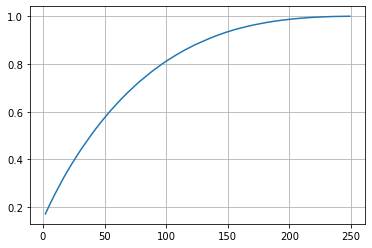

In [0]:
plt.plot(np.arange(2,min(tr_X.shape[0],tr_X.shape[1])),exp_rat)
plt.grid()
plt.show()

In [0]:
# Fit and transform on train data and transform on cv and test data
trunsvd = TruncatedSVD(n_components=175)
tr_X = trunsvd.fit_transform(tr_X,tr_y)
ts_X = trunsvd.transform(ts_X)

In [0]:
stand_vec = StandardScaler()
tr_X = stand_vec.fit_transform(tr_X)
pd.DataFrame(tr_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,-0.164532,0.487939,0.711550,1.063592,0.288814,0.679757,1.419163,-1.929692,1.662674,-1.552939,...,0.674197,-0.500293,2.319579,-0.841767,0.446332,1.842349,-0.889885,-0.612941,0.451177,-1.408989
1,0.032834,0.345192,0.684653,-0.683363,-1.071050,1.601912,-1.389540,-0.982794,-1.583500,0.530116,...,1.159822,-0.080116,0.458993,1.577653,-1.188102,0.410867,-2.342873,0.429029,-0.071122,1.187568
2,-0.042842,-1.009867,0.774578,0.258092,-1.530399,0.864581,-1.308243,-1.458523,1.559741,-0.128236,...,-0.325688,-0.212428,-0.324620,-1.406312,-0.265334,-0.870585,0.072708,0.596910,-0.163540,-0.186299
3,0.086111,-0.816340,-0.788503,0.657952,-0.141692,-1.418505,0.069040,1.360545,-0.419088,1.069888,...,-0.649263,0.210520,-0.117820,0.526989,-1.687033,0.003238,-0.373623,0.490749,1.195760,1.715022
4,-0.047900,0.107642,0.455264,0.929138,0.073400,1.730522,0.176378,-1.868323,-0.005129,0.789978,...,0.102664,-0.797968,-0.681129,1.251984,-1.929878,0.592734,0.444313,-1.195970,-0.398205,-0.075411


In [0]:
ts_X = stand_vec.transform(ts_X)
pd.DataFrame(ts_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,0.014912,-0.741837,0.274744,-0.063368,-0.432929,0.152815,-0.069140,0.272741,-0.981800,0.261619,...,-0.440932,2.019409,-0.674286,0.248574,0.172730,-0.201424,-0.133651,-0.679212,2.584033,-2.775280
1,-0.366959,-0.919499,-0.443526,0.626691,-0.076199,-0.502496,-0.784105,-0.332528,0.016349,0.193139,...,-3.586539,1.506607,1.235645,1.952467,0.481643,2.181453,0.265854,-0.255515,1.209500,2.050327
2,-0.178551,-0.651318,0.401148,-0.862620,0.579046,0.174308,-0.264050,-0.387602,1.146149,-0.298789,...,3.199833,0.978812,0.296180,0.984599,-1.230266,0.013612,-0.227200,-2.038692,0.130845,-0.244971
3,-0.226939,-1.074750,0.992441,-0.586995,0.002888,-0.118334,0.307092,-0.535269,0.015127,-0.167287,...,-0.924251,0.810002,0.241974,-1.006728,-0.351655,1.283195,-1.792211,3.315743,-4.006598,1.562571
4,-0.330429,-0.465384,-0.621555,-1.089506,-1.306731,-0.059321,0.148408,-0.022165,0.001760,-0.500889,...,-1.122691,0.482733,-2.019647,-0.426909,0.752649,0.194994,0.969147,-2.318632,2.219397,1.524134


In [0]:
def hyperparameter_model(models, params):
    str_cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=42)
    grid_clf = GridSearchCV(models, params, cv=str_cv, return_train_score=True,scoring='roc_auc',verbose = 1)
    grid_clf.fit(tr_X, tr_y)
    return grid_clf

In [0]:
from sklearn.svm import SVC

In [0]:
params = {'C':[10**i for i in range(-4,5)], 'kernel':['linear','poly','sigmoid','rbf']}
svc_model = SVC(class_weight='balanced', random_state=42, probability=True)
svc_clf = hyperparameter_model(svc_model, params)

Fitting 50 folds for each of 36 candidates, totalling 1800 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


In [0]:
print(svc_clf.best_params_)
clf = CalibratedClassifierCV(svc_clf, cv=3)
clf.fit(tr_X,tr_y)

In [0]:
temp_id = df_test['id']
svc_csv = clf.predict_proba(ts_X)[:,1]
svc_df = pd.DataFrame(np.column_stack((temp_id,svc_csv)),columns=['id','target'])
svc_df['id'] = svc_df['id'].astype('int32')

In [0]:
svc_df.head()

In [0]:
svc_df.to_csv('submission.csv', index=False)

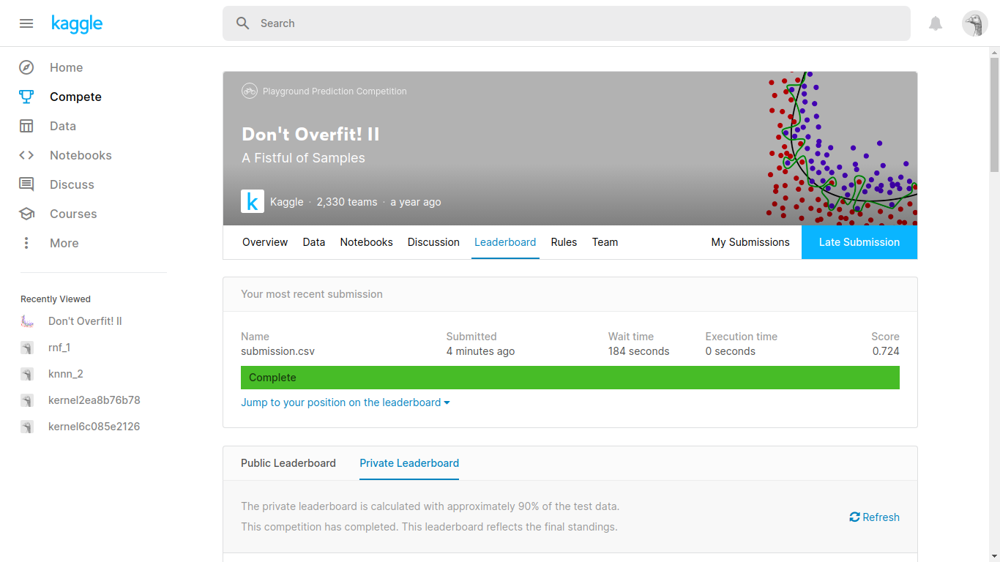

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-05 22-11-56.png')

###Random_forest

In [0]:
import numpy as np
np.random.seed(42)
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold,cross_val_score
import matplotlib.pyplot as plt
from sklearn.calibration import CalibratedClassifierCV
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD

In [0]:
train = pd.read_csv("../input/datarar/train.csv")


In [0]:
test = pd.read_csv("../input/datarar/test.csv")


In [0]:
def feature_engg(df, if_test = False):
    if if_test:
        temp = df.drop(['id'], axis=1)
    else:
        temp = df.drop(['id','target'], axis=1)
    # Mean and Std FE
    df['mean'] = np.mean(temp, axis=1)
    df['std'] = np.std(temp, axis=1)
    # Trigometric FE
    sin_temp = np.sin(temp)
    cos_temp = np.cos(temp)
    tan_temp = np.tan(temp)
    df['mean_sin'] = np.mean(sin_temp, axis=1)
    df['mean_cos'] = np.mean(cos_temp, axis=1)
    df['mean_tan'] = np.mean(tan_temp, axis=1)
    # Hyperbolic FE
    sinh_temp = np.sinh(temp)
    cosh_temp = np.cosh(temp)
    tanh_temp = np.tanh(temp)
    df['mean_sinh'] = np.mean(sin_temp, axis=1)
    df['mean_cosh'] = np.mean(cos_temp, axis=1)
    df['mean_tanh'] = np.mean(tan_temp, axis=1)
    # Exponents FE
    exp_temp = np.exp(temp)
    expm1_temp = np.expm1(temp)
    exp2_temp = np.exp2(temp)
    df['mean_exp'] = np.mean(exp_temp, axis=1)
    df['mean_expm1'] = np.mean(expm1_temp, axis=1)
    df['mean_exp2'] = np.mean(exp2_temp, axis=1)
    # Polynomial FE
    # X**2
    df['mean_x2'] = np.mean(np.power(temp,2), axis=1)
    # X**3
    df['mean_x3'] = np.mean(np.power(temp,3), axis=1)
    # X**4
    df['mean_x4'] = np.mean(np.power(temp,4), axis=1)
    return df

In [0]:
df_train = feature_engg(train)
df_train.head(5)

,id,target,0,1,2,3,4,5,6,7,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,0,1.0,-0.098,2.165,0.681,-0.614,1.309,-0.455,-0.236,0.276,...,-0.315591,-0.010536,0.537968,-0.315591,1.760647,0.760647,1.315869,1.182425,0.015243,3.584848
1,1,0.0,1.081,-0.973,-0.383,0.326,-0.428,0.317,1.172,0.352,...,0.607457,0.075490,0.611600,0.607457,1.712292,0.712292,1.324817,0.976056,0.047272,2.766570
2,2,1.0,-0.523,-0.089,-0.348,0.148,-0.022,0.404,-0.023,-0.172,...,0.104777,-0.005509,0.599358,0.104777,1.749107,0.749107,1.313960,1.023024,0.266454,3.092631
3,3,1.0,0.067,-0.021,0.392,-1.637,-0.446,-0.725,-1.035,0.834,...,0.891722,0.046067,0.645721,0.891722,1.752101,0.752101,1.326229,0.887980,0.371308,2.553467
4,4,1.0,2.347,-0.831,0.511,-0.021,1.225,1.594,0.585,1.509,...,0.274261,0.059548,0.643508,0.274261,1.861741,0.861741,1.377569,0.901115,0.613952,2.671541


In [0]:
df_test = feature_engg(test, True)
df_test.head(5)

,id,0,1,2,3,4,5,6,7,8,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,250,0.500,-1.033,-1.595,0.309,-0.714,0.502,0.535,-0.129,-0.687,...,0.565830,0.094378,0.609398,0.565830,1.904397,0.904397,1.404195,0.985912,0.477020,2.913247
1,251,0.776,0.914,-0.494,1.347,-0.867,0.480,0.578,-0.313,0.203,...,-1.641918,-0.018425,0.570495,-1.641918,1.642217,0.642217,1.265487,1.094274,-0.128315,3.281111
2,252,1.750,0.509,-0.057,0.835,-0.476,1.428,-0.701,-2.009,-1.378,...,-0.516155,-0.012641,0.611053,-0.516155,1.517775,0.517775,1.214393,0.994294,-0.330590,3.062801
3,253,-0.556,-1.855,-0.682,0.578,1.592,0.512,-1.419,0.722,0.511,...,-0.816079,0.002689,0.610619,-0.816079,1.566765,0.566765,1.243412,0.956136,-0.076546,2.382968
4,254,0.754,-0.245,1.173,-1.623,0.009,0.370,0.781,-1.763,-1.432,...,-1.547172,0.067329,0.611907,-1.547172,1.849024,0.849024,1.374870,0.988710,0.371320,3.079160


In [0]:
tr_X = df_train.drop(['id','target'], axis=1)
tr_y = df_train['target'].values
ts_X = df_test.drop(['id'], axis=1)

In [0]:
exp_rat = []
for i in range(2,min(tr_X.shape[0],tr_X.shape[1])):
    trunsvd = TruncatedSVD(n_components=i)
    trunsvd.fit(tr_X,tr_y)
    exp_rat.append(np.sum(trunsvd.explained_variance_ratio_))

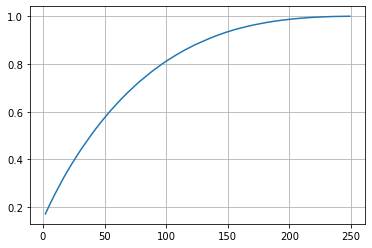

In [0]:
plt.plot(np.arange(2,min(tr_X.shape[0],tr_X.shape[1])),exp_rat)
plt.grid()
plt.show()

In [0]:
# Fit and transform on train data and transform on cv and test data
trunsvd = TruncatedSVD(n_components=175)
tr_X = trunsvd.fit_transform(tr_X,tr_y)
ts_X = trunsvd.transform(ts_X)

In [0]:
stand_vec = StandardScaler()
tr_X = stand_vec.fit_transform(tr_X)
pd.DataFrame(tr_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,-0.164532,0.487939,0.711550,1.063592,0.288814,0.679757,1.419163,-1.929692,1.662674,-1.552939,...,0.674197,-0.500293,2.319579,-0.841767,0.446332,1.842349,-0.889885,-0.612941,0.451177,-1.408989
1,0.032834,0.345192,0.684653,-0.683363,-1.071050,1.601912,-1.389540,-0.982794,-1.583500,0.530116,...,1.159822,-0.080116,0.458993,1.577653,-1.188102,0.410867,-2.342873,0.429029,-0.071122,1.187568
2,-0.042842,-1.009867,0.774578,0.258092,-1.530399,0.864581,-1.308243,-1.458523,1.559741,-0.128236,...,-0.325688,-0.212428,-0.324620,-1.406312,-0.265334,-0.870585,0.072708,0.596910,-0.163540,-0.186299
3,0.086111,-0.816340,-0.788503,0.657952,-0.141692,-1.418505,0.069040,1.360545,-0.419088,1.069888,...,-0.649263,0.210520,-0.117820,0.526989,-1.687033,0.003238,-0.373623,0.490749,1.195760,1.715022
4,-0.047900,0.107642,0.455264,0.929138,0.073400,1.730522,0.176378,-1.868323,-0.005129,0.789978,...,0.102664,-0.797968,-0.681129,1.251984,-1.929878,0.592734,0.444313,-1.195970,-0.398205,-0.075411


In [0]:
ts_X = stand_vec.transform(ts_X)
pd.DataFrame(ts_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,0.014912,-0.741837,0.274744,-0.063368,-0.432929,0.152815,-0.069140,0.272741,-0.981800,0.261619,...,-0.440932,2.019409,-0.674286,0.248574,0.172730,-0.201424,-0.133651,-0.679212,2.584033,-2.775280
1,-0.366959,-0.919499,-0.443526,0.626691,-0.076199,-0.502496,-0.784105,-0.332528,0.016349,0.193139,...,-3.586539,1.506607,1.235645,1.952467,0.481643,2.181453,0.265854,-0.255515,1.209500,2.050327
2,-0.178551,-0.651318,0.401148,-0.862620,0.579046,0.174308,-0.264050,-0.387602,1.146149,-0.298789,...,3.199833,0.978812,0.296180,0.984599,-1.230266,0.013612,-0.227200,-2.038692,0.130845,-0.244971
3,-0.226939,-1.074750,0.992441,-0.586995,0.002888,-0.118334,0.307092,-0.535269,0.015127,-0.167287,...,-0.924251,0.810002,0.241974,-1.006728,-0.351655,1.283195,-1.792211,3.315743,-4.006598,1.562571
4,-0.330429,-0.465384,-0.621555,-1.089506,-1.306731,-0.059321,0.148408,-0.022165,0.001760,-0.500889,...,-1.122691,0.482733,-2.019647,-0.426909,0.752649,0.194994,0.969147,-2.318632,2.219397,1.524134


In [0]:
def hyperparameter_model(models, params):
    str_cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=42)
    grid_clf = GridSearchCV(models, params, cv=str_cv, return_train_score=True,scoring='roc_auc',verbose = 1)
    grid_clf.fit(tr_X, tr_y)
    return grid_clf

In [0]:
from sklearn.ensemble import RandomForestClassifier

In [0]:
params = {'n_estimators':[10,20,30,40,50,100,200,300,400],'max_depth':[2,3,5,7]}
rf_model = RandomForestClassifier(random_state=42)
rf_clf = hyperparameter_model(rf_model, params)

In [0]:
print(rf_clf.best_params_)
clf = CalibratedClassifierCV(rf_clf, cv=3)
clf.fit(tr_X, tr_y)

{'max_depth': 2, 'n_estimators': 400}
Fitting 50 folds for each of 36 candidates, totalling 1800 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1800 out of 1800 | elapsed: 10.1min finished


Fitting 50 folds for each of 36 candidates, totalling 1800 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1800 out of 1800 | elapsed: 10.2min finished


Fitting 50 folds for each of 36 candidates, totalling 1800 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1800 out of 1800 | elapsed: 10.2min finished


CalibratedClassifierCV(base_estimator=GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=5, n_splits=10, random_state=42),
                                                   error_score=nan,
                                                   estimator=RandomForestClassifier(bootstrap=True,
                                                                                    ccp_alpha=0.0,
                                                                                    class_weight=None,
                                                                                    criterion='gini',
                                                                                    max_depth=None,
                                                                                    max_features='auto',
                                                                                    max_leaf_nodes=None,
                                                                                    max_samples=

In [0]:
temp_id = df_test['id']
rf_csv = clf.predict_proba(ts_X)[:,1]
rf_df = pd.DataFrame(np.column_stack((temp_id,rf_csv)), columns=['id','target'])
rf_df['id'] = rf_df['id'].astype('int32')

In [0]:
rf_df.head()

,id,target
0,250,0.712677
1,251,0.733235
2,252,0.559190
3,253,0.742087
4,254,0.721015


In [0]:
rf_df.to_csv('submission.csv', index=False)

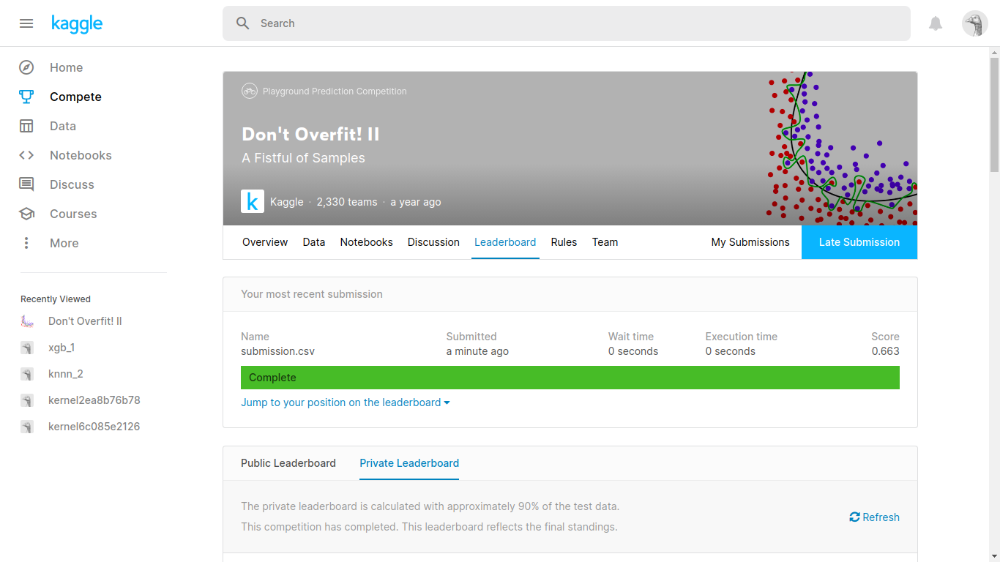

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-05 23-19-08.png')

###XGBoost

In [0]:
import numpy as np
np.random.seed(42)
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold,cross_val_score
import matplotlib.pyplot as plt
from sklearn.calibration import CalibratedClassifierCV
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD

In [0]:
train = pd.read_csv("../input/datarar/train.csv")


In [0]:
test = pd.read_csv("../input/datarar/test.csv")


In [0]:
def feature_engg(df, if_test = False):
    if if_test:
        temp = df.drop(['id'], axis=1)
    else:
        temp = df.drop(['id','target'], axis=1)
    # Mean and Std FE
    df['mean'] = np.mean(temp, axis=1)
    df['std'] = np.std(temp, axis=1)
    # Trigometric FE
    sin_temp = np.sin(temp)
    cos_temp = np.cos(temp)
    tan_temp = np.tan(temp)
    df['mean_sin'] = np.mean(sin_temp, axis=1)
    df['mean_cos'] = np.mean(cos_temp, axis=1)
    df['mean_tan'] = np.mean(tan_temp, axis=1)
    # Hyperbolic FE
    sinh_temp = np.sinh(temp)
    cosh_temp = np.cosh(temp)
    tanh_temp = np.tanh(temp)
    df['mean_sinh'] = np.mean(sin_temp, axis=1)
    df['mean_cosh'] = np.mean(cos_temp, axis=1)
    df['mean_tanh'] = np.mean(tan_temp, axis=1)
    # Exponents FE
    exp_temp = np.exp(temp)
    expm1_temp = np.expm1(temp)
    exp2_temp = np.exp2(temp)
    df['mean_exp'] = np.mean(exp_temp, axis=1)
    df['mean_expm1'] = np.mean(expm1_temp, axis=1)
    df['mean_exp2'] = np.mean(exp2_temp, axis=1)
    # Polynomial FE
    # X**2
    df['mean_x2'] = np.mean(np.power(temp,2), axis=1)
    # X**3
    df['mean_x3'] = np.mean(np.power(temp,3), axis=1)
    # X**4
    df['mean_x4'] = np.mean(np.power(temp,4), axis=1)
    return df

In [0]:
df_train = feature_engg(train)
df_train.head(5)

,id,target,0,1,2,3,4,5,6,7,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,0,1.0,-0.098,2.165,0.681,-0.614,1.309,-0.455,-0.236,0.276,...,-0.315591,-0.010536,0.537968,-0.315591,1.760647,0.760647,1.315869,1.182425,0.015243,3.584848
1,1,0.0,1.081,-0.973,-0.383,0.326,-0.428,0.317,1.172,0.352,...,0.607457,0.075490,0.611600,0.607457,1.712292,0.712292,1.324817,0.976056,0.047272,2.766570
2,2,1.0,-0.523,-0.089,-0.348,0.148,-0.022,0.404,-0.023,-0.172,...,0.104777,-0.005509,0.599358,0.104777,1.749107,0.749107,1.313960,1.023024,0.266454,3.092631
3,3,1.0,0.067,-0.021,0.392,-1.637,-0.446,-0.725,-1.035,0.834,...,0.891722,0.046067,0.645721,0.891722,1.752101,0.752101,1.326229,0.887980,0.371308,2.553467
4,4,1.0,2.347,-0.831,0.511,-0.021,1.225,1.594,0.585,1.509,...,0.274261,0.059548,0.643508,0.274261,1.861741,0.861741,1.377569,0.901115,0.613952,2.671541


In [0]:
df_test = feature_engg(test, True)
df_test.head(5)

,id,0,1,2,3,4,5,6,7,8,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,250,0.500,-1.033,-1.595,0.309,-0.714,0.502,0.535,-0.129,-0.687,...,0.565830,0.094378,0.609398,0.565830,1.904397,0.904397,1.404195,0.985912,0.477020,2.913247
1,251,0.776,0.914,-0.494,1.347,-0.867,0.480,0.578,-0.313,0.203,...,-1.641918,-0.018425,0.570495,-1.641918,1.642217,0.642217,1.265487,1.094274,-0.128315,3.281111
2,252,1.750,0.509,-0.057,0.835,-0.476,1.428,-0.701,-2.009,-1.378,...,-0.516155,-0.012641,0.611053,-0.516155,1.517775,0.517775,1.214393,0.994294,-0.330590,3.062801
3,253,-0.556,-1.855,-0.682,0.578,1.592,0.512,-1.419,0.722,0.511,...,-0.816079,0.002689,0.610619,-0.816079,1.566765,0.566765,1.243412,0.956136,-0.076546,2.382968
4,254,0.754,-0.245,1.173,-1.623,0.009,0.370,0.781,-1.763,-1.432,...,-1.547172,0.067329,0.611907,-1.547172,1.849024,0.849024,1.374870,0.988710,0.371320,3.079160


In [0]:
tr_X = df_train.drop(['id','target'], axis=1)
tr_y = df_train['target'].values
ts_X = df_test.drop(['id'], axis=1)

In [0]:
exp_rat = []
for i in range(2,min(tr_X.shape[0],tr_X.shape[1])):
    trunsvd = TruncatedSVD(n_components=i)
    trunsvd.fit(tr_X,tr_y)
    exp_rat.append(np.sum(trunsvd.explained_variance_ratio_))

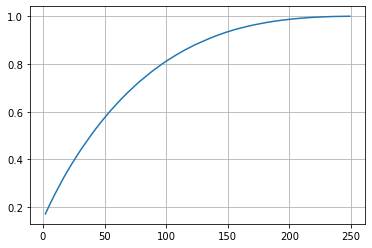

In [0]:
plt.plot(np.arange(2,min(tr_X.shape[0],tr_X.shape[1])),exp_rat)
plt.grid()
plt.show()

In [0]:
# Fit and transform on train data and transform on cv and test data
trunsvd = TruncatedSVD(n_components=175)
tr_X = trunsvd.fit_transform(tr_X,tr_y)
ts_X = trunsvd.transform(ts_X)

In [0]:
stand_vec = StandardScaler()
tr_X = stand_vec.fit_transform(tr_X)
pd.DataFrame(tr_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,-0.164532,0.487939,0.711550,1.063592,0.288814,0.679757,1.419163,-1.929692,1.662674,-1.552939,...,0.674197,-0.500293,2.319579,-0.841767,0.446332,1.842349,-0.889885,-0.612941,0.451177,-1.408989
1,0.032834,0.345192,0.684653,-0.683363,-1.071050,1.601912,-1.389540,-0.982794,-1.583500,0.530116,...,1.159822,-0.080116,0.458993,1.577653,-1.188102,0.410867,-2.342873,0.429029,-0.071122,1.187568
2,-0.042842,-1.009867,0.774578,0.258092,-1.530399,0.864581,-1.308243,-1.458523,1.559741,-0.128236,...,-0.325688,-0.212428,-0.324620,-1.406312,-0.265334,-0.870585,0.072708,0.596910,-0.163540,-0.186299
3,0.086111,-0.816340,-0.788503,0.657952,-0.141692,-1.418505,0.069040,1.360545,-0.419088,1.069888,...,-0.649263,0.210520,-0.117820,0.526989,-1.687033,0.003238,-0.373623,0.490749,1.195760,1.715022
4,-0.047900,0.107642,0.455264,0.929138,0.073400,1.730522,0.176378,-1.868323,-0.005129,0.789978,...,0.102664,-0.797968,-0.681129,1.251984,-1.929878,0.592734,0.444313,-1.195970,-0.398205,-0.075411


In [0]:
ts_X = stand_vec.transform(ts_X)
pd.DataFrame(ts_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,0.014912,-0.741837,0.274744,-0.063368,-0.432929,0.152815,-0.069140,0.272741,-0.981800,0.261619,...,-0.440932,2.019409,-0.674286,0.248574,0.172730,-0.201424,-0.133651,-0.679212,2.584033,-2.775280
1,-0.366959,-0.919499,-0.443526,0.626691,-0.076199,-0.502496,-0.784105,-0.332528,0.016349,0.193139,...,-3.586539,1.506607,1.235645,1.952467,0.481643,2.181453,0.265854,-0.255515,1.209500,2.050327
2,-0.178551,-0.651318,0.401148,-0.862620,0.579046,0.174308,-0.264050,-0.387602,1.146149,-0.298789,...,3.199833,0.978812,0.296180,0.984599,-1.230266,0.013612,-0.227200,-2.038692,0.130845,-0.244971
3,-0.226939,-1.074750,0.992441,-0.586995,0.002888,-0.118334,0.307092,-0.535269,0.015127,-0.167287,...,-0.924251,0.810002,0.241974,-1.006728,-0.351655,1.283195,-1.792211,3.315743,-4.006598,1.562571
4,-0.330429,-0.465384,-0.621555,-1.089506,-1.306731,-0.059321,0.148408,-0.022165,0.001760,-0.500889,...,-1.122691,0.482733,-2.019647,-0.426909,0.752649,0.194994,0.969147,-2.318632,2.219397,1.524134


In [0]:
def hyperparameter_model(models, params):
    str_cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=42)
    grid_clf = GridSearchCV(models, params, cv=str_cv, return_train_score=True,scoring='roc_auc',verbose = 1)
    grid_clf.fit(tr_X, tr_y)
    return grid_clf

In [0]:
from xgboost import XGBClassifier

In [0]:
params = {'max_depth':[2,3,5,7], 'n_estimators':[10,20,50,100,200,300,400]}
xgb_model = XGBClassifier(scale_pos_weight=0.5)
xgb_clf = hyperparameter_model(xgb_model, params)

Fitting 50 folds for each of 28 candidates, totalling 1400 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


In [0]:
print(xgb_clf.best_params_)
clf = CalibratedClassifierCV(xgb_clf, cv=3)
clf.fit(tr_X, tr_y)

In [0]:
temp_id = df_test['id']
xgb_csv = clf.predict_proba(ts_X)[:,1]
xgb_df = pd.DataFrame(np.column_stack((temp_id,xgb_csv)),columns=['id','target'])
xgb_df['id'] = xgb_df['id'].astype('int32')

In [0]:
xgb_df.head()

In [0]:
xgb_df.to_csv('submission.csv', index=False)

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-05 23-39-48.png to Screenshot from 2020-05-05 23-39-48.png


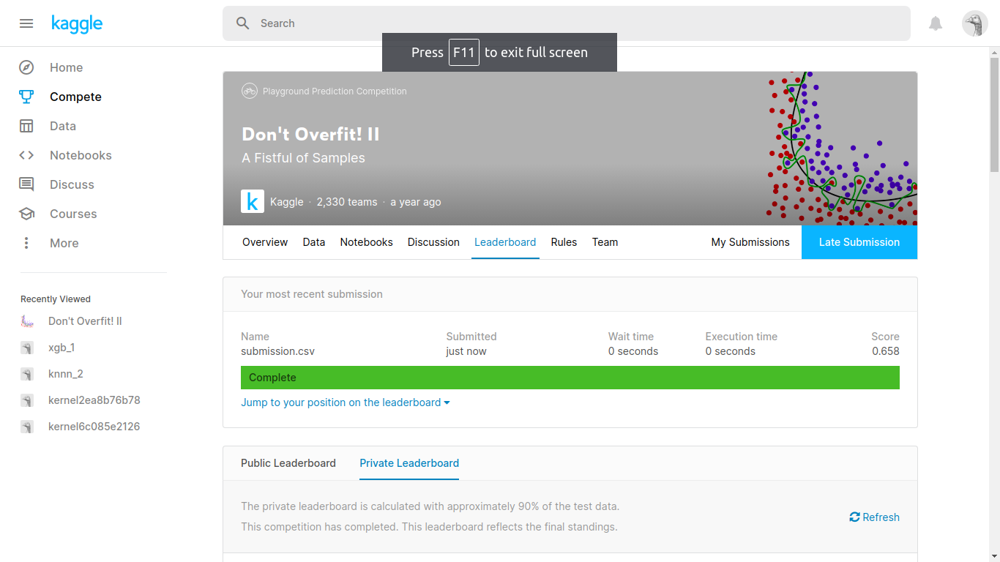

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-05 23-39-48.png')

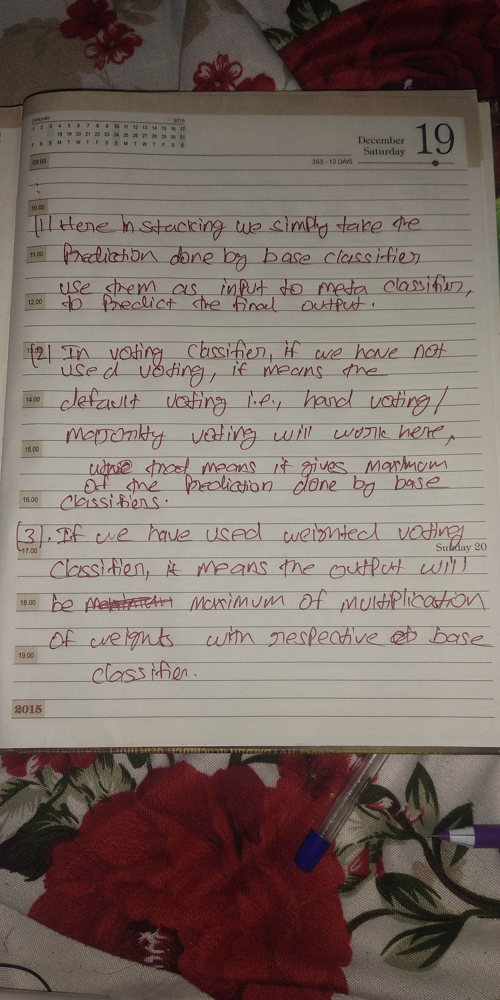

In [0]:
from IPython.display import Image
Image(filename='IMG-20200506-WA0003.jpeg')

###Stacking_classifier

In [0]:
import numpy as np
np.random.seed(42)
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold,cross_val_score
import matplotlib.pyplot as plt
from sklearn.calibration import CalibratedClassifierCV
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD

In [0]:
train = pd.read_csv("../input/datarar/train.csv")


In [0]:
test = pd.read_csv("../input/datarar/test.csv")


In [0]:
def feature_engg(df, if_test = False):
    if if_test:
        temp = df.drop(['id'], axis=1)
    else:
        temp = df.drop(['id','target'], axis=1)
    # Mean and Std FE
    df['mean'] = np.mean(temp, axis=1)
    df['std'] = np.std(temp, axis=1)
    # Trigometric FE
    sin_temp = np.sin(temp)
    cos_temp = np.cos(temp)
    tan_temp = np.tan(temp)
    df['mean_sin'] = np.mean(sin_temp, axis=1)
    df['mean_cos'] = np.mean(cos_temp, axis=1)
    df['mean_tan'] = np.mean(tan_temp, axis=1)
    # Hyperbolic FE
    sinh_temp = np.sinh(temp)
    cosh_temp = np.cosh(temp)
    tanh_temp = np.tanh(temp)
    df['mean_sinh'] = np.mean(sin_temp, axis=1)
    df['mean_cosh'] = np.mean(cos_temp, axis=1)
    df['mean_tanh'] = np.mean(tan_temp, axis=1)
    # Exponents FE
    exp_temp = np.exp(temp)
    expm1_temp = np.expm1(temp)
    exp2_temp = np.exp2(temp)
    df['mean_exp'] = np.mean(exp_temp, axis=1)
    df['mean_expm1'] = np.mean(expm1_temp, axis=1)
    df['mean_exp2'] = np.mean(exp2_temp, axis=1)
    # Polynomial FE
    # X**2
    df['mean_x2'] = np.mean(np.power(temp,2), axis=1)
    # X**3
    df['mean_x3'] = np.mean(np.power(temp,3), axis=1)
    # X**4
    df['mean_x4'] = np.mean(np.power(temp,4), axis=1)
    return df

In [0]:
df_train = feature_engg(train)
df_train.head(5)

,id,target,0,1,2,3,4,5,6,7,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,0,1.0,-0.098,2.165,0.681,-0.614,1.309,-0.455,-0.236,0.276,...,-0.315591,-0.010536,0.537968,-0.315591,1.760647,0.760647,1.315869,1.182425,0.015243,3.584848
1,1,0.0,1.081,-0.973,-0.383,0.326,-0.428,0.317,1.172,0.352,...,0.607457,0.075490,0.611600,0.607457,1.712292,0.712292,1.324817,0.976056,0.047272,2.766570
2,2,1.0,-0.523,-0.089,-0.348,0.148,-0.022,0.404,-0.023,-0.172,...,0.104777,-0.005509,0.599358,0.104777,1.749107,0.749107,1.313960,1.023024,0.266454,3.092631
3,3,1.0,0.067,-0.021,0.392,-1.637,-0.446,-0.725,-1.035,0.834,...,0.891722,0.046067,0.645721,0.891722,1.752101,0.752101,1.326229,0.887980,0.371308,2.553467
4,4,1.0,2.347,-0.831,0.511,-0.021,1.225,1.594,0.585,1.509,...,0.274261,0.059548,0.643508,0.274261,1.861741,0.861741,1.377569,0.901115,0.613952,2.671541


In [0]:
df_test = feature_engg(test, True)
df_test.head(5)

,id,0,1,2,3,4,5,6,7,8,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,250,0.500,-1.033,-1.595,0.309,-0.714,0.502,0.535,-0.129,-0.687,...,0.565830,0.094378,0.609398,0.565830,1.904397,0.904397,1.404195,0.985912,0.477020,2.913247
1,251,0.776,0.914,-0.494,1.347,-0.867,0.480,0.578,-0.313,0.203,...,-1.641918,-0.018425,0.570495,-1.641918,1.642217,0.642217,1.265487,1.094274,-0.128315,3.281111
2,252,1.750,0.509,-0.057,0.835,-0.476,1.428,-0.701,-2.009,-1.378,...,-0.516155,-0.012641,0.611053,-0.516155,1.517775,0.517775,1.214393,0.994294,-0.330590,3.062801
3,253,-0.556,-1.855,-0.682,0.578,1.592,0.512,-1.419,0.722,0.511,...,-0.816079,0.002689,0.610619,-0.816079,1.566765,0.566765,1.243412,0.956136,-0.076546,2.382968
4,254,0.754,-0.245,1.173,-1.623,0.009,0.370,0.781,-1.763,-1.432,...,-1.547172,0.067329,0.611907,-1.547172,1.849024,0.849024,1.374870,0.988710,0.371320,3.079160


In [0]:
tr_X = df_train.drop(['id','target'], axis=1)
tr_y = df_train['target'].values
ts_X = df_test.drop(['id'], axis=1)

In [0]:
exp_rat = []
for i in range(2,min(tr_X.shape[0],tr_X.shape[1])):
    trunsvd = TruncatedSVD(n_components=i)
    trunsvd.fit(tr_X,tr_y)
    exp_rat.append(np.sum(trunsvd.explained_variance_ratio_))

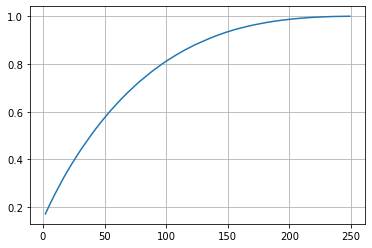

In [0]:
plt.plot(np.arange(2,min(tr_X.shape[0],tr_X.shape[1])),exp_rat)
plt.grid()
plt.show()

In [0]:
# Fit and transform on train data and transform on cv and test data
trunsvd = TruncatedSVD(n_components=175)
tr_X = trunsvd.fit_transform(tr_X,tr_y)
ts_X = trunsvd.transform(ts_X)

In [0]:
stand_vec = StandardScaler()
tr_X = stand_vec.fit_transform(tr_X)
pd.DataFrame(tr_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,-0.164532,0.487939,0.711550,1.063592,0.288814,0.679757,1.419163,-1.929692,1.662674,-1.552939,...,0.674197,-0.500293,2.319579,-0.841767,0.446332,1.842349,-0.889885,-0.612941,0.451177,-1.408989
1,0.032834,0.345192,0.684653,-0.683363,-1.071050,1.601912,-1.389540,-0.982794,-1.583500,0.530116,...,1.159822,-0.080116,0.458993,1.577653,-1.188102,0.410867,-2.342873,0.429029,-0.071122,1.187568
2,-0.042842,-1.009867,0.774578,0.258092,-1.530399,0.864581,-1.308243,-1.458523,1.559741,-0.128236,...,-0.325688,-0.212428,-0.324620,-1.406312,-0.265334,-0.870585,0.072708,0.596910,-0.163540,-0.186299
3,0.086111,-0.816340,-0.788503,0.657952,-0.141692,-1.418505,0.069040,1.360545,-0.419088,1.069888,...,-0.649263,0.210520,-0.117820,0.526989,-1.687033,0.003238,-0.373623,0.490749,1.195760,1.715022
4,-0.047900,0.107642,0.455264,0.929138,0.073400,1.730522,0.176378,-1.868323,-0.005129,0.789978,...,0.102664,-0.797968,-0.681129,1.251984,-1.929878,0.592734,0.444313,-1.195970,-0.398205,-0.075411


In [0]:
ts_X = stand_vec.transform(ts_X)
pd.DataFrame(ts_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,0.014912,-0.741837,0.274744,-0.063368,-0.432929,0.152815,-0.069140,0.272741,-0.981800,0.261619,...,-0.440932,2.019409,-0.674286,0.248574,0.172730,-0.201424,-0.133651,-0.679212,2.584033,-2.775280
1,-0.366959,-0.919499,-0.443526,0.626691,-0.076199,-0.502496,-0.784105,-0.332528,0.016349,0.193139,...,-3.586539,1.506607,1.235645,1.952467,0.481643,2.181453,0.265854,-0.255515,1.209500,2.050327
2,-0.178551,-0.651318,0.401148,-0.862620,0.579046,0.174308,-0.264050,-0.387602,1.146149,-0.298789,...,3.199833,0.978812,0.296180,0.984599,-1.230266,0.013612,-0.227200,-2.038692,0.130845,-0.244971
3,-0.226939,-1.074750,0.992441,-0.586995,0.002888,-0.118334,0.307092,-0.535269,0.015127,-0.167287,...,-0.924251,0.810002,0.241974,-1.006728,-0.351655,1.283195,-1.792211,3.315743,-4.006598,1.562571
4,-0.330429,-0.465384,-0.621555,-1.089506,-1.306731,-0.059321,0.148408,-0.022165,0.001760,-0.500889,...,-1.122691,0.482733,-2.019647,-0.426909,0.752649,0.194994,0.969147,-2.318632,2.219397,1.524134


In [0]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

from mlxtend.classifier import StackingClassifier

In [0]:
# Classifier 1: Logistic Regression with best params
clf1 = LogisticRegression(C = 1000, penalty = 'l1', solver = 'liblinear',class_weight='balanced', random_state=42)
clf1.fit(tr_X,tr_y)
clf1 = CalibratedClassifierCV(clf1, cv=3)

# Classifier 2: SVC with best params
clf2 = SVC(C=0.1, kernel='linear', random_state=42, class_weight='balanced',probability=True)
clf2.fit(tr_X,tr_y)
clf2 = CalibratedClassifierCV(clf2, cv=3)

# Classifier 3: XGBoost with best params
clf3 = XGBClassifier(max_depth=7, n_estimators=300, scale_pos_weight=0.5)
clf3.fit(tr_X,tr_y)
clf3 = CalibratedClassifierCV(clf3, cv=3)
# Classifier 4: RF with best params
clf4 = RandomForestClassifier(max_depth=2, n_estimators=400)
clf4.fit(tr_X,tr_y)
clf4 = CalibratedClassifierCV(clf4, cv=3)
# Stack Classifier
sclf = StackingClassifier(classifiers=[clf1,clf2,clf3,clf4],meta_classifier=clf1, use_probas=True)
# Fit the model
sclf.fit(tr_X, tr_y)

StackingClassifier(average_probas=False,
                   classifiers=[CalibratedClassifierCV(base_estimator=LogisticRegression(C=1000,
                                                                                         class_weight='balanced',
                                                                                         dual=False,
                                                                                         fit_intercept=True,
                                                                                         intercept_scaling=1,
                                                                                         l1_ratio=None,
                                                                                         max_iter=100,
                                                                                         multi_class='auto',
                                                                                         n_jobs=None,
          

In [0]:
temp_id = df_test['id']
sclf_csv = sclf.predict_proba(ts_X)[:,1]
sclf_df = pd.DataFrame(np.column_stack((temp_id,sclf_csv)),columns=['id','target'])
sclf_df['id'] = sclf_df['id'].astype('int32')

In [0]:
sclf_df.head()

,id,target
0,250,0.827283
1,251,0.962308
2,252,0.500814
3,253,0.991065
4,254,0.905420


In [0]:
sclf_df.to_csv('submission.csv', index=False)

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-06 00-34-21.png to Screenshot from 2020-05-06 00-34-21.png


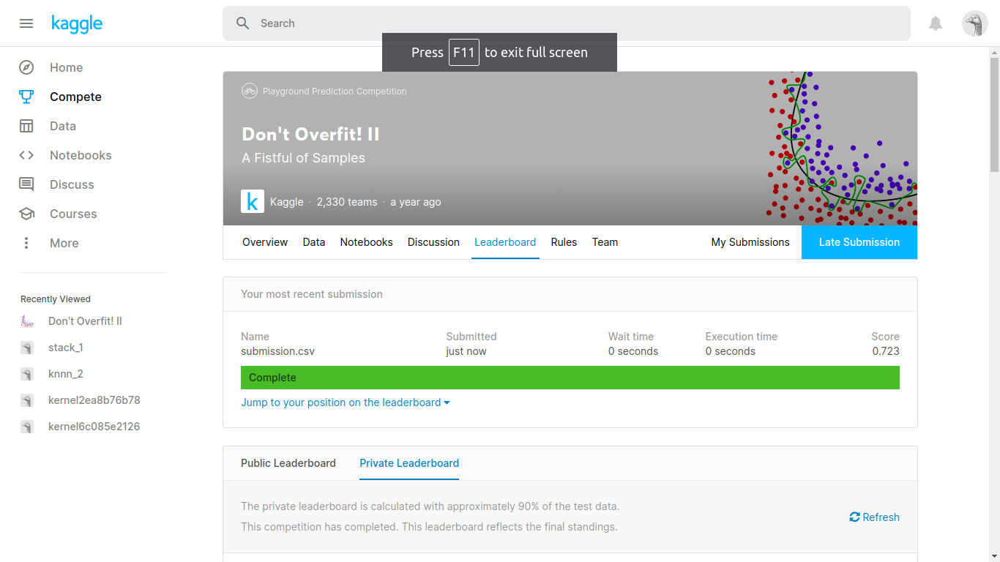

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-06 00-34-21.png')

###Voting Classifier (Without Stack Classifier + no weights)

In [0]:
import numpy as np
np.random.seed(42)
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold,cross_val_score
import matplotlib.pyplot as plt
from sklearn.calibration import CalibratedClassifierCV
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD

In [0]:
train = pd.read_csv("../input/datarar/train.csv")


In [0]:
test = pd.read_csv("../input/datarar/test.csv")


In [0]:
def feature_engg(df, if_test = False):
    if if_test:
        temp = df.drop(['id'], axis=1)
    else:
        temp = df.drop(['id','target'], axis=1)
    # Mean and Std FE
    df['mean'] = np.mean(temp, axis=1)
    df['std'] = np.std(temp, axis=1)
    # Trigometric FE
    sin_temp = np.sin(temp)
    cos_temp = np.cos(temp)
    tan_temp = np.tan(temp)
    df['mean_sin'] = np.mean(sin_temp, axis=1)
    df['mean_cos'] = np.mean(cos_temp, axis=1)
    df['mean_tan'] = np.mean(tan_temp, axis=1)
    # Hyperbolic FE
    sinh_temp = np.sinh(temp)
    cosh_temp = np.cosh(temp)
    tanh_temp = np.tanh(temp)
    df['mean_sinh'] = np.mean(sin_temp, axis=1)
    df['mean_cosh'] = np.mean(cos_temp, axis=1)
    df['mean_tanh'] = np.mean(tan_temp, axis=1)
    # Exponents FE
    exp_temp = np.exp(temp)
    expm1_temp = np.expm1(temp)
    exp2_temp = np.exp2(temp)
    df['mean_exp'] = np.mean(exp_temp, axis=1)
    df['mean_expm1'] = np.mean(expm1_temp, axis=1)
    df['mean_exp2'] = np.mean(exp2_temp, axis=1)
    # Polynomial FE
    # X**2
    df['mean_x2'] = np.mean(np.power(temp,2), axis=1)
    # X**3
    df['mean_x3'] = np.mean(np.power(temp,3), axis=1)
    # X**4
    df['mean_x4'] = np.mean(np.power(temp,4), axis=1)
    return df

In [0]:
df_train = feature_engg(train)
df_train.head(5)

,id,target,0,1,2,3,4,5,6,7,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,0,1.0,-0.098,2.165,0.681,-0.614,1.309,-0.455,-0.236,0.276,...,-0.315591,-0.010536,0.537968,-0.315591,1.760647,0.760647,1.315869,1.182425,0.015243,3.584848
1,1,0.0,1.081,-0.973,-0.383,0.326,-0.428,0.317,1.172,0.352,...,0.607457,0.075490,0.611600,0.607457,1.712292,0.712292,1.324817,0.976056,0.047272,2.766570
2,2,1.0,-0.523,-0.089,-0.348,0.148,-0.022,0.404,-0.023,-0.172,...,0.104777,-0.005509,0.599358,0.104777,1.749107,0.749107,1.313960,1.023024,0.266454,3.092631
3,3,1.0,0.067,-0.021,0.392,-1.637,-0.446,-0.725,-1.035,0.834,...,0.891722,0.046067,0.645721,0.891722,1.752101,0.752101,1.326229,0.887980,0.371308,2.553467
4,4,1.0,2.347,-0.831,0.511,-0.021,1.225,1.594,0.585,1.509,...,0.274261,0.059548,0.643508,0.274261,1.861741,0.861741,1.377569,0.901115,0.613952,2.671541


In [0]:
df_test = feature_engg(test, True)
df_test.head(5)

,id,0,1,2,3,4,5,6,7,8,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,250,0.500,-1.033,-1.595,0.309,-0.714,0.502,0.535,-0.129,-0.687,...,0.565830,0.094378,0.609398,0.565830,1.904397,0.904397,1.404195,0.985912,0.477020,2.913247
1,251,0.776,0.914,-0.494,1.347,-0.867,0.480,0.578,-0.313,0.203,...,-1.641918,-0.018425,0.570495,-1.641918,1.642217,0.642217,1.265487,1.094274,-0.128315,3.281111
2,252,1.750,0.509,-0.057,0.835,-0.476,1.428,-0.701,-2.009,-1.378,...,-0.516155,-0.012641,0.611053,-0.516155,1.517775,0.517775,1.214393,0.994294,-0.330590,3.062801
3,253,-0.556,-1.855,-0.682,0.578,1.592,0.512,-1.419,0.722,0.511,...,-0.816079,0.002689,0.610619,-0.816079,1.566765,0.566765,1.243412,0.956136,-0.076546,2.382968
4,254,0.754,-0.245,1.173,-1.623,0.009,0.370,0.781,-1.763,-1.432,...,-1.547172,0.067329,0.611907,-1.547172,1.849024,0.849024,1.374870,0.988710,0.371320,3.079160


In [0]:
tr_X = df_train.drop(['id','target'], axis=1)
tr_y = df_train['target'].values
ts_X = df_test.drop(['id'], axis=1)

In [0]:
exp_rat = []
for i in range(2,min(tr_X.shape[0],tr_X.shape[1])):
    trunsvd = TruncatedSVD(n_components=i)
    trunsvd.fit(tr_X,tr_y)
    exp_rat.append(np.sum(trunsvd.explained_variance_ratio_))

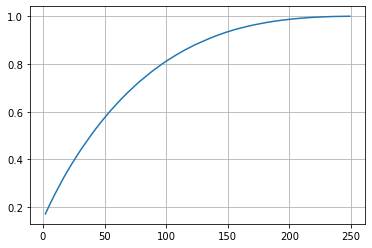

In [0]:
plt.plot(np.arange(2,min(tr_X.shape[0],tr_X.shape[1])),exp_rat)
plt.grid()
plt.show()

In [0]:
# Fit and transform on train data and transform on cv and test data
trunsvd = TruncatedSVD(n_components=175)
tr_X = trunsvd.fit_transform(tr_X,tr_y)
ts_X = trunsvd.transform(ts_X)

In [0]:
stand_vec = StandardScaler()
tr_X = stand_vec.fit_transform(tr_X)
pd.DataFrame(tr_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,-0.164532,0.487939,0.711550,1.063592,0.288814,0.679757,1.419163,-1.929692,1.662674,-1.552939,...,0.674197,-0.500293,2.319579,-0.841767,0.446332,1.842349,-0.889885,-0.612941,0.451177,-1.408989
1,0.032834,0.345192,0.684653,-0.683363,-1.071050,1.601912,-1.389540,-0.982794,-1.583500,0.530116,...,1.159822,-0.080116,0.458993,1.577653,-1.188102,0.410867,-2.342873,0.429029,-0.071122,1.187568
2,-0.042842,-1.009867,0.774578,0.258092,-1.530399,0.864581,-1.308243,-1.458523,1.559741,-0.128236,...,-0.325688,-0.212428,-0.324620,-1.406312,-0.265334,-0.870585,0.072708,0.596910,-0.163540,-0.186299
3,0.086111,-0.816340,-0.788503,0.657952,-0.141692,-1.418505,0.069040,1.360545,-0.419088,1.069888,...,-0.649263,0.210520,-0.117820,0.526989,-1.687033,0.003238,-0.373623,0.490749,1.195760,1.715022
4,-0.047900,0.107642,0.455264,0.929138,0.073400,1.730522,0.176378,-1.868323,-0.005129,0.789978,...,0.102664,-0.797968,-0.681129,1.251984,-1.929878,0.592734,0.444313,-1.195970,-0.398205,-0.075411


In [0]:
ts_X = stand_vec.transform(ts_X)
pd.DataFrame(ts_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,0.014912,-0.741837,0.274744,-0.063368,-0.432929,0.152815,-0.069140,0.272741,-0.981800,0.261619,...,-0.440932,2.019409,-0.674286,0.248574,0.172730,-0.201424,-0.133651,-0.679212,2.584033,-2.775280
1,-0.366959,-0.919499,-0.443526,0.626691,-0.076199,-0.502496,-0.784105,-0.332528,0.016349,0.193139,...,-3.586539,1.506607,1.235645,1.952467,0.481643,2.181453,0.265854,-0.255515,1.209500,2.050327
2,-0.178551,-0.651318,0.401148,-0.862620,0.579046,0.174308,-0.264050,-0.387602,1.146149,-0.298789,...,3.199833,0.978812,0.296180,0.984599,-1.230266,0.013612,-0.227200,-2.038692,0.130845,-0.244971
3,-0.226939,-1.074750,0.992441,-0.586995,0.002888,-0.118334,0.307092,-0.535269,0.015127,-0.167287,...,-0.924251,0.810002,0.241974,-1.006728,-0.351655,1.283195,-1.792211,3.315743,-4.006598,1.562571
4,-0.330429,-0.465384,-0.621555,-1.089506,-1.306731,-0.059321,0.148408,-0.022165,0.001760,-0.500889,...,-1.122691,0.482733,-2.019647,-0.426909,0.752649,0.194994,0.969147,-2.318632,2.219397,1.524134


In [0]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from mlxtend.classifier import EnsembleVoteClassifier
from mlxtend.classifier import StackingClassifier

In [0]:
# Classifier 1: Logistic Regression with best params
clf1 = LogisticRegression(C = 1000, penalty = 'l1', solver = 'liblinear',class_weight='balanced', random_state=42)
clf1.fit(tr_X,tr_y)
clf1 = CalibratedClassifierCV(clf1, cv=3)

# Classifier 2: SVC with best params
clf2 = SVC(C=0.1, kernel='linear', random_state=42, class_weight='balanced',probability=True)
clf2.fit(tr_X,tr_y)
clf2 = CalibratedClassifierCV(clf2, cv=3)

# Classifier 3: XGBoost with best params
clf3 = XGBClassifier(max_depth=7, n_estimators=300, scale_pos_weight=0.5)
clf3.fit(tr_X,tr_y)
clf3 = CalibratedClassifierCV(clf3, cv=3)
# Classifier 4: RF with best params
clf4 = RandomForestClassifier(max_depth=2, n_estimators=400)
clf4.fit(tr_X,tr_y)
clf4 = CalibratedClassifierCV(clf4, cv=3)
# Stack Classifier
sclf = StackingClassifier(classifiers=[clf1,clf2,clf3,clf4],meta_classifier=clf1, use_probas=True)
# Fit the model
sclf.fit(tr_X, tr_y)

StackingClassifier(average_probas=False,
                   classifiers=[CalibratedClassifierCV(base_estimator=LogisticRegression(C=1000,
                                                                                         class_weight='balanced',
                                                                                         dual=False,
                                                                                         fit_intercept=True,
                                                                                         intercept_scaling=1,
                                                                                         l1_ratio=None,
                                                                                         max_iter=100,
                                                                                         multi_class='auto',
                                                                                         n_jobs=None,
          

In [0]:
eclf = EnsembleVoteClassifier(clfs=[clf1, clf2,clf3,clf4])
eclf.fit(tr_X,tr_y)

EnsembleVoteClassifier(clfs=[CalibratedClassifierCV(base_estimator=LogisticRegression(C=1000,
                                                                                      class_weight='balanced',
                                                                                      dual=False,
                                                                                      fit_intercept=True,
                                                                                      intercept_scaling=1,
                                                                                      l1_ratio=None,
                                                                                      max_iter=100,
                                                                                      multi_class='auto',
                                                                                      n_jobs=None,
                                                                              

In [0]:
temp_id = df_test['id']
eclf_csv = eclf.predict_proba(ts_X)[:,1]
eclf_df = pd.DataFrame(np.column_stack((temp_id,eclf_csv)),columns=['id','target'])
eclf_df['id'] = eclf_df['id'].astype('int32')

In [0]:
eclf_df.head()

,id,target
0,250,0.618144
1,251,0.647636
2,252,0.589306
3,253,0.780121
4,254,0.637569


In [0]:
eclf_df.to_csv('submission.csv', index=False)

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-06 00-39-20.png to Screenshot from 2020-05-06 00-39-20.png


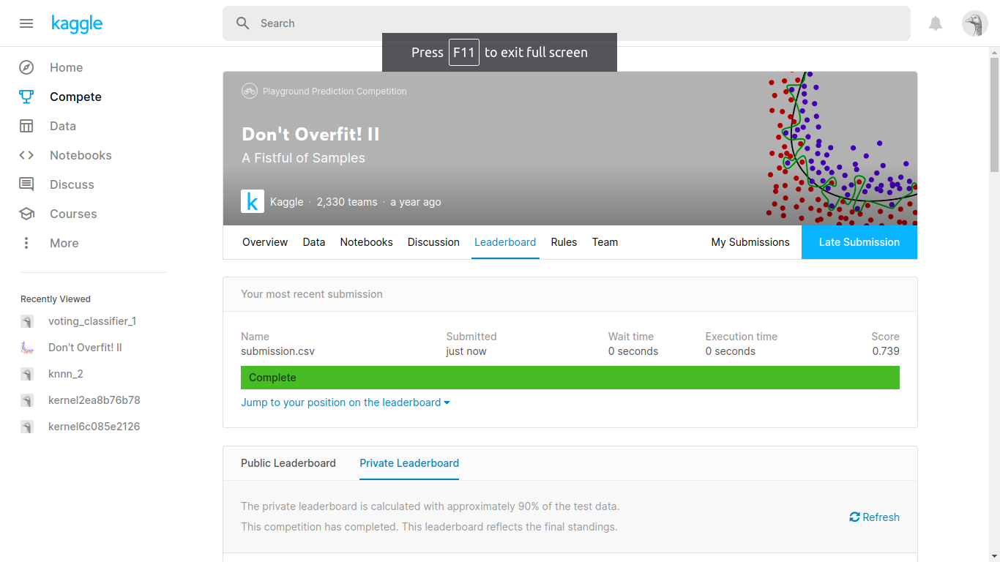

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-06 00-39-20.png')

###Voting Classifier (With Stack Classifier + no weights)

In [0]:
import numpy as np
np.random.seed(42)
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold,cross_val_score
import matplotlib.pyplot as plt
from sklearn.calibration import CalibratedClassifierCV
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD

In [0]:
train = pd.read_csv("../input/datarar/train.csv")


In [0]:
test = pd.read_csv("../input/datarar/test.csv")


In [0]:
def feature_engg(df, if_test = False):
    if if_test:
        temp = df.drop(['id'], axis=1)
    else:
        temp = df.drop(['id','target'], axis=1)
    # Mean and Std FE
    df['mean'] = np.mean(temp, axis=1)
    df['std'] = np.std(temp, axis=1)
    # Trigometric FE
    sin_temp = np.sin(temp)
    cos_temp = np.cos(temp)
    tan_temp = np.tan(temp)
    df['mean_sin'] = np.mean(sin_temp, axis=1)
    df['mean_cos'] = np.mean(cos_temp, axis=1)
    df['mean_tan'] = np.mean(tan_temp, axis=1)
    # Hyperbolic FE
    sinh_temp = np.sinh(temp)
    cosh_temp = np.cosh(temp)
    tanh_temp = np.tanh(temp)
    df['mean_sinh'] = np.mean(sin_temp, axis=1)
    df['mean_cosh'] = np.mean(cos_temp, axis=1)
    df['mean_tanh'] = np.mean(tan_temp, axis=1)
    # Exponents FE
    exp_temp = np.exp(temp)
    expm1_temp = np.expm1(temp)
    exp2_temp = np.exp2(temp)
    df['mean_exp'] = np.mean(exp_temp, axis=1)
    df['mean_expm1'] = np.mean(expm1_temp, axis=1)
    df['mean_exp2'] = np.mean(exp2_temp, axis=1)
    # Polynomial FE
    # X**2
    df['mean_x2'] = np.mean(np.power(temp,2), axis=1)
    # X**3
    df['mean_x3'] = np.mean(np.power(temp,3), axis=1)
    # X**4
    df['mean_x4'] = np.mean(np.power(temp,4), axis=1)
    return df

In [0]:
df_train = feature_engg(train)
df_train.head(5)

,id,target,0,1,2,3,4,5,6,7,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,0,1.0,-0.098,2.165,0.681,-0.614,1.309,-0.455,-0.236,0.276,...,-0.315591,-0.010536,0.537968,-0.315591,1.760647,0.760647,1.315869,1.182425,0.015243,3.584848
1,1,0.0,1.081,-0.973,-0.383,0.326,-0.428,0.317,1.172,0.352,...,0.607457,0.075490,0.611600,0.607457,1.712292,0.712292,1.324817,0.976056,0.047272,2.766570
2,2,1.0,-0.523,-0.089,-0.348,0.148,-0.022,0.404,-0.023,-0.172,...,0.104777,-0.005509,0.599358,0.104777,1.749107,0.749107,1.313960,1.023024,0.266454,3.092631
3,3,1.0,0.067,-0.021,0.392,-1.637,-0.446,-0.725,-1.035,0.834,...,0.891722,0.046067,0.645721,0.891722,1.752101,0.752101,1.326229,0.887980,0.371308,2.553467
4,4,1.0,2.347,-0.831,0.511,-0.021,1.225,1.594,0.585,1.509,...,0.274261,0.059548,0.643508,0.274261,1.861741,0.861741,1.377569,0.901115,0.613952,2.671541


In [0]:
df_test = feature_engg(test, True)
df_test.head(5)

,id,0,1,2,3,4,5,6,7,8,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,250,0.500,-1.033,-1.595,0.309,-0.714,0.502,0.535,-0.129,-0.687,...,0.565830,0.094378,0.609398,0.565830,1.904397,0.904397,1.404195,0.985912,0.477020,2.913247
1,251,0.776,0.914,-0.494,1.347,-0.867,0.480,0.578,-0.313,0.203,...,-1.641918,-0.018425,0.570495,-1.641918,1.642217,0.642217,1.265487,1.094274,-0.128315,3.281111
2,252,1.750,0.509,-0.057,0.835,-0.476,1.428,-0.701,-2.009,-1.378,...,-0.516155,-0.012641,0.611053,-0.516155,1.517775,0.517775,1.214393,0.994294,-0.330590,3.062801
3,253,-0.556,-1.855,-0.682,0.578,1.592,0.512,-1.419,0.722,0.511,...,-0.816079,0.002689,0.610619,-0.816079,1.566765,0.566765,1.243412,0.956136,-0.076546,2.382968
4,254,0.754,-0.245,1.173,-1.623,0.009,0.370,0.781,-1.763,-1.432,...,-1.547172,0.067329,0.611907,-1.547172,1.849024,0.849024,1.374870,0.988710,0.371320,3.079160


In [0]:
tr_X = df_train.drop(['id','target'], axis=1)
tr_y = df_train['target'].values
ts_X = df_test.drop(['id'], axis=1)

In [0]:
exp_rat = []
for i in range(2,min(tr_X.shape[0],tr_X.shape[1])):
    trunsvd = TruncatedSVD(n_components=i)
    trunsvd.fit(tr_X,tr_y)
    exp_rat.append(np.sum(trunsvd.explained_variance_ratio_))

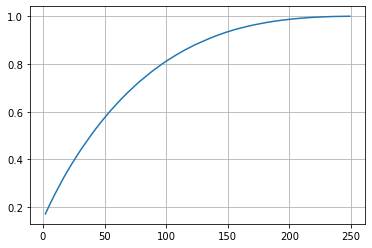

In [0]:
plt.plot(np.arange(2,min(tr_X.shape[0],tr_X.shape[1])),exp_rat)
plt.grid()
plt.show()

In [0]:
# Fit and transform on train data and transform on cv and test data
trunsvd = TruncatedSVD(n_components=175)
tr_X = trunsvd.fit_transform(tr_X,tr_y)
ts_X = trunsvd.transform(ts_X)

In [0]:
stand_vec = StandardScaler()
tr_X = stand_vec.fit_transform(tr_X)
pd.DataFrame(tr_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,-0.164532,0.487939,0.711550,1.063592,0.288814,0.679757,1.419163,-1.929692,1.662674,-1.552939,...,0.674197,-0.500293,2.319579,-0.841767,0.446332,1.842349,-0.889885,-0.612941,0.451177,-1.408989
1,0.032834,0.345192,0.684653,-0.683363,-1.071050,1.601912,-1.389540,-0.982794,-1.583500,0.530116,...,1.159822,-0.080116,0.458993,1.577653,-1.188102,0.410867,-2.342873,0.429029,-0.071122,1.187568
2,-0.042842,-1.009867,0.774578,0.258092,-1.530399,0.864581,-1.308243,-1.458523,1.559741,-0.128236,...,-0.325688,-0.212428,-0.324620,-1.406312,-0.265334,-0.870585,0.072708,0.596910,-0.163540,-0.186299
3,0.086111,-0.816340,-0.788503,0.657952,-0.141692,-1.418505,0.069040,1.360545,-0.419088,1.069888,...,-0.649263,0.210520,-0.117820,0.526989,-1.687033,0.003238,-0.373623,0.490749,1.195760,1.715022
4,-0.047900,0.107642,0.455264,0.929138,0.073400,1.730522,0.176378,-1.868323,-0.005129,0.789978,...,0.102664,-0.797968,-0.681129,1.251984,-1.929878,0.592734,0.444313,-1.195970,-0.398205,-0.075411


In [0]:
ts_X = stand_vec.transform(ts_X)
pd.DataFrame(ts_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,0.014912,-0.741837,0.274744,-0.063368,-0.432929,0.152815,-0.069140,0.272741,-0.981800,0.261619,...,-0.440932,2.019409,-0.674286,0.248574,0.172730,-0.201424,-0.133651,-0.679212,2.584033,-2.775280
1,-0.366959,-0.919499,-0.443526,0.626691,-0.076199,-0.502496,-0.784105,-0.332528,0.016349,0.193139,...,-3.586539,1.506607,1.235645,1.952467,0.481643,2.181453,0.265854,-0.255515,1.209500,2.050327
2,-0.178551,-0.651318,0.401148,-0.862620,0.579046,0.174308,-0.264050,-0.387602,1.146149,-0.298789,...,3.199833,0.978812,0.296180,0.984599,-1.230266,0.013612,-0.227200,-2.038692,0.130845,-0.244971
3,-0.226939,-1.074750,0.992441,-0.586995,0.002888,-0.118334,0.307092,-0.535269,0.015127,-0.167287,...,-0.924251,0.810002,0.241974,-1.006728,-0.351655,1.283195,-1.792211,3.315743,-4.006598,1.562571
4,-0.330429,-0.465384,-0.621555,-1.089506,-1.306731,-0.059321,0.148408,-0.022165,0.001760,-0.500889,...,-1.122691,0.482733,-2.019647,-0.426909,0.752649,0.194994,0.969147,-2.318632,2.219397,1.524134


In [0]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from mlxtend.classifier import EnsembleVoteClassifier
from mlxtend.classifier import StackingClassifier

In [0]:
# Classifier 1: Logistic Regression with best params
clf1 = LogisticRegression(C = 1000, penalty = 'l1', solver = 'liblinear',class_weight='balanced', random_state=42)
clf1.fit(tr_X,tr_y)
clf1 = CalibratedClassifierCV(clf1, cv=3)

# Classifier 2: SVC with best params
clf2 = SVC(C=0.1, kernel='linear', random_state=42, class_weight='balanced',probability=True)
clf2.fit(tr_X,tr_y)
clf2 = CalibratedClassifierCV(clf2, cv=3)

# Classifier 3: XGBoost with best params
clf3 = XGBClassifier(max_depth=7, n_estimators=300, scale_pos_weight=0.5)
clf3.fit(tr_X,tr_y)
clf3 = CalibratedClassifierCV(clf3, cv=3)
# Classifier 4: RF with best params
clf4 = RandomForestClassifier(max_depth=2, n_estimators=400)
clf4.fit(tr_X,tr_y)
clf4 = CalibratedClassifierCV(clf4, cv=3)
# Stack Classifier
sclf = StackingClassifier(classifiers=[clf1,clf2,clf3,clf4],meta_classifier=clf1, use_probas=True)
# Fit the model
sclf.fit(tr_X, tr_y)

StackingClassifier(average_probas=False,
                   classifiers=[CalibratedClassifierCV(base_estimator=LogisticRegression(C=1000,
                                                                                         class_weight='balanced',
                                                                                         dual=False,
                                                                                         fit_intercept=True,
                                                                                         intercept_scaling=1,
                                                                                         l1_ratio=None,
                                                                                         max_iter=100,
                                                                                         multi_class='auto',
                                                                                         n_jobs=None,
          

In [0]:
eclf = EnsembleVoteClassifier(clfs=[clf1, clf2,clf3,clf4,sclf])
eclf.fit(tr_X,tr_y)

EnsembleVoteClassifier(clfs=[CalibratedClassifierCV(base_estimator=LogisticRegression(C=1000,
                                                                                      class_weight='balanced',
                                                                                      dual=False,
                                                                                      fit_intercept=True,
                                                                                      intercept_scaling=1,
                                                                                      l1_ratio=None,
                                                                                      max_iter=100,
                                                                                      multi_class='auto',
                                                                                      n_jobs=None,
                                                                              

In [0]:
temp_id = df_test['id']
eclf_csv = eclf.predict_proba(ts_X)[:,1]
eclf_df = pd.DataFrame(np.column_stack((temp_id,eclf_csv)),columns=['id','target'])
eclf_df['id'] = eclf_df['id'].astype('int32')

In [0]:
eclf_df.head()

,id,target
0,250,0.618144
1,251,0.647636
2,252,0.589306
3,253,0.780121
4,254,0.637569


In [0]:
eclf_df.to_csv('submission.csv', index=False)

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-06 00-46-28.png to Screenshot from 2020-05-06 00-46-28.png


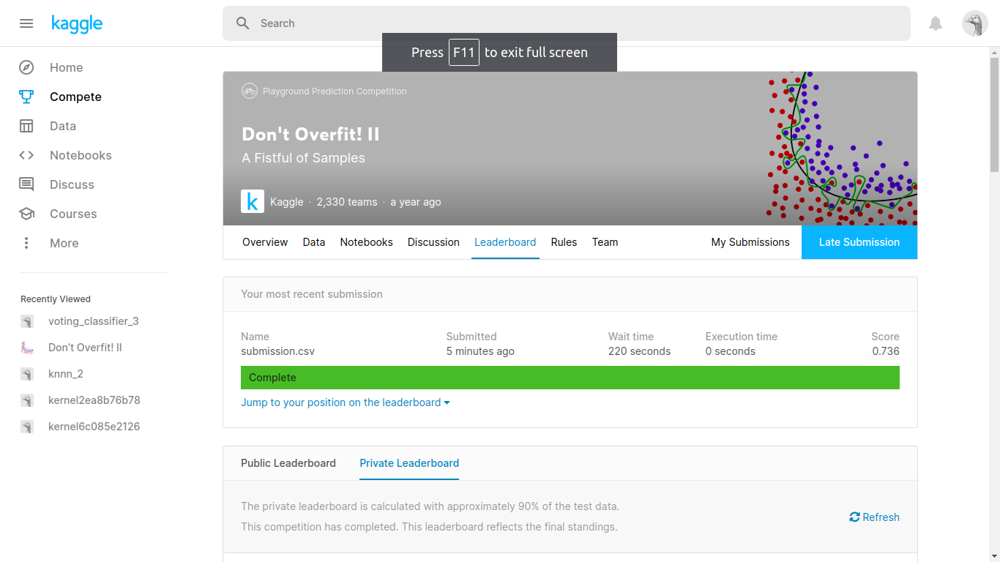

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-06 00-46-28.png')

###Voting Classifier (without Stack Classifier + weights)

In [0]:
import numpy as np
np.random.seed(42)
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold,cross_val_score
import matplotlib.pyplot as plt
from sklearn.calibration import CalibratedClassifierCV
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD

In [0]:
train = pd.read_csv("../input/datarar/train.csv")


In [0]:
test = pd.read_csv("../input/datarar/test.csv")


In [0]:
def feature_engg(df, if_test = False):
    if if_test:
        temp = df.drop(['id'], axis=1)
    else:
        temp = df.drop(['id','target'], axis=1)
    # Mean and Std FE
    df['mean'] = np.mean(temp, axis=1)
    df['std'] = np.std(temp, axis=1)
    # Trigometric FE
    sin_temp = np.sin(temp)
    cos_temp = np.cos(temp)
    tan_temp = np.tan(temp)
    df['mean_sin'] = np.mean(sin_temp, axis=1)
    df['mean_cos'] = np.mean(cos_temp, axis=1)
    df['mean_tan'] = np.mean(tan_temp, axis=1)
    # Hyperbolic FE
    sinh_temp = np.sinh(temp)
    cosh_temp = np.cosh(temp)
    tanh_temp = np.tanh(temp)
    df['mean_sinh'] = np.mean(sin_temp, axis=1)
    df['mean_cosh'] = np.mean(cos_temp, axis=1)
    df['mean_tanh'] = np.mean(tan_temp, axis=1)
    # Exponents FE
    exp_temp = np.exp(temp)
    expm1_temp = np.expm1(temp)
    exp2_temp = np.exp2(temp)
    df['mean_exp'] = np.mean(exp_temp, axis=1)
    df['mean_expm1'] = np.mean(expm1_temp, axis=1)
    df['mean_exp2'] = np.mean(exp2_temp, axis=1)
    # Polynomial FE
    # X**2
    df['mean_x2'] = np.mean(np.power(temp,2), axis=1)
    # X**3
    df['mean_x3'] = np.mean(np.power(temp,3), axis=1)
    # X**4
    df['mean_x4'] = np.mean(np.power(temp,4), axis=1)
    return df

In [0]:
df_train = feature_engg(train)
df_train.head(5)

,id,target,0,1,2,3,4,5,6,7,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,0,1.0,-0.098,2.165,0.681,-0.614,1.309,-0.455,-0.236,0.276,...,-0.315591,-0.010536,0.537968,-0.315591,1.760647,0.760647,1.315869,1.182425,0.015243,3.584848
1,1,0.0,1.081,-0.973,-0.383,0.326,-0.428,0.317,1.172,0.352,...,0.607457,0.075490,0.611600,0.607457,1.712292,0.712292,1.324817,0.976056,0.047272,2.766570
2,2,1.0,-0.523,-0.089,-0.348,0.148,-0.022,0.404,-0.023,-0.172,...,0.104777,-0.005509,0.599358,0.104777,1.749107,0.749107,1.313960,1.023024,0.266454,3.092631
3,3,1.0,0.067,-0.021,0.392,-1.637,-0.446,-0.725,-1.035,0.834,...,0.891722,0.046067,0.645721,0.891722,1.752101,0.752101,1.326229,0.887980,0.371308,2.553467
4,4,1.0,2.347,-0.831,0.511,-0.021,1.225,1.594,0.585,1.509,...,0.274261,0.059548,0.643508,0.274261,1.861741,0.861741,1.377569,0.901115,0.613952,2.671541


In [0]:
df_test = feature_engg(test, True)
df_test.head(5)

,id,0,1,2,3,4,5,6,7,8,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,250,0.500,-1.033,-1.595,0.309,-0.714,0.502,0.535,-0.129,-0.687,...,0.565830,0.094378,0.609398,0.565830,1.904397,0.904397,1.404195,0.985912,0.477020,2.913247
1,251,0.776,0.914,-0.494,1.347,-0.867,0.480,0.578,-0.313,0.203,...,-1.641918,-0.018425,0.570495,-1.641918,1.642217,0.642217,1.265487,1.094274,-0.128315,3.281111
2,252,1.750,0.509,-0.057,0.835,-0.476,1.428,-0.701,-2.009,-1.378,...,-0.516155,-0.012641,0.611053,-0.516155,1.517775,0.517775,1.214393,0.994294,-0.330590,3.062801
3,253,-0.556,-1.855,-0.682,0.578,1.592,0.512,-1.419,0.722,0.511,...,-0.816079,0.002689,0.610619,-0.816079,1.566765,0.566765,1.243412,0.956136,-0.076546,2.382968
4,254,0.754,-0.245,1.173,-1.623,0.009,0.370,0.781,-1.763,-1.432,...,-1.547172,0.067329,0.611907,-1.547172,1.849024,0.849024,1.374870,0.988710,0.371320,3.079160


In [0]:
tr_X = df_train.drop(['id','target'], axis=1)
tr_y = df_train['target'].values
ts_X = df_test.drop(['id'], axis=1)

In [0]:
exp_rat = []
for i in range(2,min(tr_X.shape[0],tr_X.shape[1])):
    trunsvd = TruncatedSVD(n_components=i)
    trunsvd.fit(tr_X,tr_y)
    exp_rat.append(np.sum(trunsvd.explained_variance_ratio_))

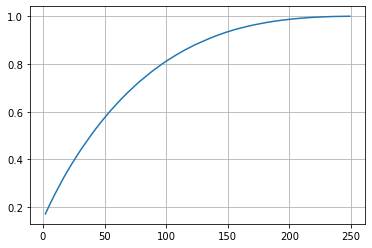

In [0]:
plt.plot(np.arange(2,min(tr_X.shape[0],tr_X.shape[1])),exp_rat)
plt.grid()
plt.show()

In [0]:
# Fit and transform on train data and transform on cv and test data
trunsvd = TruncatedSVD(n_components=175)
tr_X = trunsvd.fit_transform(tr_X,tr_y)
ts_X = trunsvd.transform(ts_X)

In [0]:
stand_vec = StandardScaler()
tr_X = stand_vec.fit_transform(tr_X)
pd.DataFrame(tr_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,-0.164532,0.487939,0.711550,1.063592,0.288814,0.679757,1.419163,-1.929692,1.662674,-1.552939,...,0.674197,-0.500293,2.319579,-0.841767,0.446332,1.842349,-0.889885,-0.612941,0.451177,-1.408989
1,0.032834,0.345192,0.684653,-0.683363,-1.071050,1.601912,-1.389540,-0.982794,-1.583500,0.530116,...,1.159822,-0.080116,0.458993,1.577653,-1.188102,0.410867,-2.342873,0.429029,-0.071122,1.187568
2,-0.042842,-1.009867,0.774578,0.258092,-1.530399,0.864581,-1.308243,-1.458523,1.559741,-0.128236,...,-0.325688,-0.212428,-0.324620,-1.406312,-0.265334,-0.870585,0.072708,0.596910,-0.163540,-0.186299
3,0.086111,-0.816340,-0.788503,0.657952,-0.141692,-1.418505,0.069040,1.360545,-0.419088,1.069888,...,-0.649263,0.210520,-0.117820,0.526989,-1.687033,0.003238,-0.373623,0.490749,1.195760,1.715022
4,-0.047900,0.107642,0.455264,0.929138,0.073400,1.730522,0.176378,-1.868323,-0.005129,0.789978,...,0.102664,-0.797968,-0.681129,1.251984,-1.929878,0.592734,0.444313,-1.195970,-0.398205,-0.075411


In [0]:
ts_X = stand_vec.transform(ts_X)
pd.DataFrame(ts_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,0.014912,-0.741837,0.274744,-0.063368,-0.432929,0.152815,-0.069140,0.272741,-0.981800,0.261619,...,-0.440932,2.019409,-0.674286,0.248574,0.172730,-0.201424,-0.133651,-0.679212,2.584033,-2.775280
1,-0.366959,-0.919499,-0.443526,0.626691,-0.076199,-0.502496,-0.784105,-0.332528,0.016349,0.193139,...,-3.586539,1.506607,1.235645,1.952467,0.481643,2.181453,0.265854,-0.255515,1.209500,2.050327
2,-0.178551,-0.651318,0.401148,-0.862620,0.579046,0.174308,-0.264050,-0.387602,1.146149,-0.298789,...,3.199833,0.978812,0.296180,0.984599,-1.230266,0.013612,-0.227200,-2.038692,0.130845,-0.244971
3,-0.226939,-1.074750,0.992441,-0.586995,0.002888,-0.118334,0.307092,-0.535269,0.015127,-0.167287,...,-0.924251,0.810002,0.241974,-1.006728,-0.351655,1.283195,-1.792211,3.315743,-4.006598,1.562571
4,-0.330429,-0.465384,-0.621555,-1.089506,-1.306731,-0.059321,0.148408,-0.022165,0.001760,-0.500889,...,-1.122691,0.482733,-2.019647,-0.426909,0.752649,0.194994,0.969147,-2.318632,2.219397,1.524134


In [0]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from mlxtend.classifier import EnsembleVoteClassifier
from mlxtend.classifier import StackingClassifier

In [0]:
# Classifier 1: Logistic Regression with best params
clf1 = LogisticRegression(C = 1000, penalty = 'l1', solver = 'liblinear',class_weight='balanced', random_state=42)
clf1.fit(tr_X,tr_y)
clf1 = CalibratedClassifierCV(clf1, cv=3)

# Classifier 2: SVC with best params
clf2 = SVC(C=0.1, kernel='linear', random_state=42, class_weight='balanced',probability=True)
clf2.fit(tr_X,tr_y)
clf2 = CalibratedClassifierCV(clf2, cv=3)

# Classifier 3: XGBoost with best params
clf3 = XGBClassifier(max_depth=7, n_estimators=300, scale_pos_weight=0.5)
clf3.fit(tr_X,tr_y)
clf3 = CalibratedClassifierCV(clf3, cv=3)
# Classifier 4: RF with best params
clf4 = RandomForestClassifier(max_depth=2, n_estimators=400)
clf4.fit(tr_X,tr_y)
clf4 = CalibratedClassifierCV(clf4, cv=3)
# Stack Classifier
sclf = StackingClassifier(classifiers=[clf1,clf2,clf3,clf4],meta_classifier=clf1, use_probas=True)
# Fit the model
sclf.fit(tr_X, tr_y)

StackingClassifier(average_probas=False,
                   classifiers=[CalibratedClassifierCV(base_estimator=LogisticRegression(C=1000,
                                                                                         class_weight='balanced',
                                                                                         dual=False,
                                                                                         fit_intercept=True,
                                                                                         intercept_scaling=1,
                                                                                         l1_ratio=None,
                                                                                         max_iter=100,
                                                                                         multi_class='auto',
                                                                                         n_jobs=None,
          

In [0]:
eclf = EnsembleVoteClassifier(clfs=[clf1, clf2,clf3,clf4], weights=[0.3,0.3,0.2,0.2])
eclf.fit(tr_X,tr_y)

EnsembleVoteClassifier(clfs=[CalibratedClassifierCV(base_estimator=LogisticRegression(C=1000,
                                                                                      class_weight='balanced',
                                                                                      dual=False,
                                                                                      fit_intercept=True,
                                                                                      intercept_scaling=1,
                                                                                      l1_ratio=None,
                                                                                      max_iter=100,
                                                                                      multi_class='auto',
                                                                                      n_jobs=None,
                                                                              

In [0]:
temp_id = df_test['id']
eclf_csv = eclf.predict_proba(ts_X)[:,1]
eclf_df = pd.DataFrame(np.column_stack((temp_id,eclf_csv)),columns=['id','target'])
eclf_df['id'] = eclf_df['id'].astype('int32')

In [0]:
eclf_df.head()

,id,target
0,250,0.642978
1,251,0.670657
2,252,0.567219
3,253,0.842698
4,254,0.665709


In [0]:
eclf_df.to_csv('submission.csv', index=False)

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-06 00-53-24.png to Screenshot from 2020-05-06 00-53-24.png


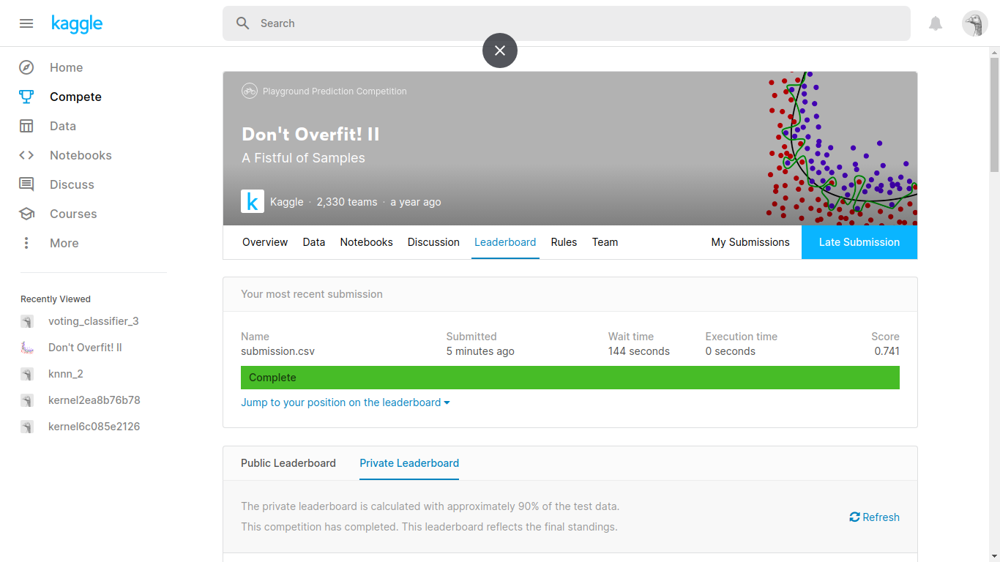

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-06 00-53-24.png')

###Voting Classifier (with Stack Classifier + weights)

In [0]:
import numpy as np
np.random.seed(42)
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold,cross_val_score
import matplotlib.pyplot as plt
from sklearn.calibration import CalibratedClassifierCV
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD

In [0]:
train = pd.read_csv("../input/datarar/train.csv")


In [0]:
test = pd.read_csv("../input/datarar/test.csv")


In [0]:
def feature_engg(df, if_test = False):
    if if_test:
        temp = df.drop(['id'], axis=1)
    else:
        temp = df.drop(['id','target'], axis=1)
    # Mean and Std FE
    df['mean'] = np.mean(temp, axis=1)
    df['std'] = np.std(temp, axis=1)
    # Trigometric FE
    sin_temp = np.sin(temp)
    cos_temp = np.cos(temp)
    tan_temp = np.tan(temp)
    df['mean_sin'] = np.mean(sin_temp, axis=1)
    df['mean_cos'] = np.mean(cos_temp, axis=1)
    df['mean_tan'] = np.mean(tan_temp, axis=1)
    # Hyperbolic FE
    sinh_temp = np.sinh(temp)
    cosh_temp = np.cosh(temp)
    tanh_temp = np.tanh(temp)
    df['mean_sinh'] = np.mean(sin_temp, axis=1)
    df['mean_cosh'] = np.mean(cos_temp, axis=1)
    df['mean_tanh'] = np.mean(tan_temp, axis=1)
    # Exponents FE
    exp_temp = np.exp(temp)
    expm1_temp = np.expm1(temp)
    exp2_temp = np.exp2(temp)
    df['mean_exp'] = np.mean(exp_temp, axis=1)
    df['mean_expm1'] = np.mean(expm1_temp, axis=1)
    df['mean_exp2'] = np.mean(exp2_temp, axis=1)
    # Polynomial FE
    # X**2
    df['mean_x2'] = np.mean(np.power(temp,2), axis=1)
    # X**3
    df['mean_x3'] = np.mean(np.power(temp,3), axis=1)
    # X**4
    df['mean_x4'] = np.mean(np.power(temp,4), axis=1)
    return df

In [0]:
df_train = feature_engg(train)
df_train.head(5)

,id,target,0,1,2,3,4,5,6,7,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,0,1.0,-0.098,2.165,0.681,-0.614,1.309,-0.455,-0.236,0.276,...,-0.315591,-0.010536,0.537968,-0.315591,1.760647,0.760647,1.315869,1.182425,0.015243,3.584848
1,1,0.0,1.081,-0.973,-0.383,0.326,-0.428,0.317,1.172,0.352,...,0.607457,0.075490,0.611600,0.607457,1.712292,0.712292,1.324817,0.976056,0.047272,2.766570
2,2,1.0,-0.523,-0.089,-0.348,0.148,-0.022,0.404,-0.023,-0.172,...,0.104777,-0.005509,0.599358,0.104777,1.749107,0.749107,1.313960,1.023024,0.266454,3.092631
3,3,1.0,0.067,-0.021,0.392,-1.637,-0.446,-0.725,-1.035,0.834,...,0.891722,0.046067,0.645721,0.891722,1.752101,0.752101,1.326229,0.887980,0.371308,2.553467
4,4,1.0,2.347,-0.831,0.511,-0.021,1.225,1.594,0.585,1.509,...,0.274261,0.059548,0.643508,0.274261,1.861741,0.861741,1.377569,0.901115,0.613952,2.671541


In [0]:
df_test = feature_engg(test, True)
df_test.head(5)

,id,0,1,2,3,4,5,6,7,8,...,mean_tan,mean_sinh,mean_cosh,mean_tanh,mean_exp,mean_expm1,mean_exp2,mean_x2,mean_x3,mean_x4
0,250,0.500,-1.033,-1.595,0.309,-0.714,0.502,0.535,-0.129,-0.687,...,0.565830,0.094378,0.609398,0.565830,1.904397,0.904397,1.404195,0.985912,0.477020,2.913247
1,251,0.776,0.914,-0.494,1.347,-0.867,0.480,0.578,-0.313,0.203,...,-1.641918,-0.018425,0.570495,-1.641918,1.642217,0.642217,1.265487,1.094274,-0.128315,3.281111
2,252,1.750,0.509,-0.057,0.835,-0.476,1.428,-0.701,-2.009,-1.378,...,-0.516155,-0.012641,0.611053,-0.516155,1.517775,0.517775,1.214393,0.994294,-0.330590,3.062801
3,253,-0.556,-1.855,-0.682,0.578,1.592,0.512,-1.419,0.722,0.511,...,-0.816079,0.002689,0.610619,-0.816079,1.566765,0.566765,1.243412,0.956136,-0.076546,2.382968
4,254,0.754,-0.245,1.173,-1.623,0.009,0.370,0.781,-1.763,-1.432,...,-1.547172,0.067329,0.611907,-1.547172,1.849024,0.849024,1.374870,0.988710,0.371320,3.079160


In [0]:
tr_X = df_train.drop(['id','target'], axis=1)
tr_y = df_train['target'].values
ts_X = df_test.drop(['id'], axis=1)

In [0]:
exp_rat = []
for i in range(2,min(tr_X.shape[0],tr_X.shape[1])):
    trunsvd = TruncatedSVD(n_components=i)
    trunsvd.fit(tr_X,tr_y)
    exp_rat.append(np.sum(trunsvd.explained_variance_ratio_))

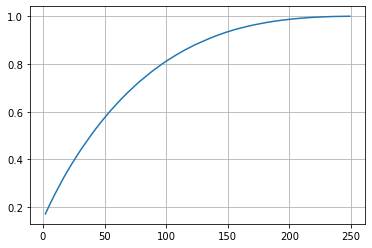

In [0]:
plt.plot(np.arange(2,min(tr_X.shape[0],tr_X.shape[1])),exp_rat)
plt.grid()
plt.show()

In [0]:
# Fit and transform on train data and transform on cv and test data
trunsvd = TruncatedSVD(n_components=175)
tr_X = trunsvd.fit_transform(tr_X,tr_y)
ts_X = trunsvd.transform(ts_X)

In [0]:
stand_vec = StandardScaler()
tr_X = stand_vec.fit_transform(tr_X)
pd.DataFrame(tr_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,-0.164532,0.487939,0.711550,1.063592,0.288814,0.679757,1.419163,-1.929692,1.662674,-1.552939,...,0.674197,-0.500293,2.319579,-0.841767,0.446332,1.842349,-0.889885,-0.612941,0.451177,-1.408989
1,0.032834,0.345192,0.684653,-0.683363,-1.071050,1.601912,-1.389540,-0.982794,-1.583500,0.530116,...,1.159822,-0.080116,0.458993,1.577653,-1.188102,0.410867,-2.342873,0.429029,-0.071122,1.187568
2,-0.042842,-1.009867,0.774578,0.258092,-1.530399,0.864581,-1.308243,-1.458523,1.559741,-0.128236,...,-0.325688,-0.212428,-0.324620,-1.406312,-0.265334,-0.870585,0.072708,0.596910,-0.163540,-0.186299
3,0.086111,-0.816340,-0.788503,0.657952,-0.141692,-1.418505,0.069040,1.360545,-0.419088,1.069888,...,-0.649263,0.210520,-0.117820,0.526989,-1.687033,0.003238,-0.373623,0.490749,1.195760,1.715022
4,-0.047900,0.107642,0.455264,0.929138,0.073400,1.730522,0.176378,-1.868323,-0.005129,0.789978,...,0.102664,-0.797968,-0.681129,1.251984,-1.929878,0.592734,0.444313,-1.195970,-0.398205,-0.075411


In [0]:
ts_X = stand_vec.transform(ts_X)
pd.DataFrame(ts_X).head(5)

,0,1,2,3,4,5,6,7,8,9,...,165,166,167,168,169,170,171,172,173,174
0,0.014912,-0.741837,0.274744,-0.063368,-0.432929,0.152815,-0.069140,0.272741,-0.981800,0.261619,...,-0.440932,2.019409,-0.674286,0.248574,0.172730,-0.201424,-0.133651,-0.679212,2.584033,-2.775280
1,-0.366959,-0.919499,-0.443526,0.626691,-0.076199,-0.502496,-0.784105,-0.332528,0.016349,0.193139,...,-3.586539,1.506607,1.235645,1.952467,0.481643,2.181453,0.265854,-0.255515,1.209500,2.050327
2,-0.178551,-0.651318,0.401148,-0.862620,0.579046,0.174308,-0.264050,-0.387602,1.146149,-0.298789,...,3.199833,0.978812,0.296180,0.984599,-1.230266,0.013612,-0.227200,-2.038692,0.130845,-0.244971
3,-0.226939,-1.074750,0.992441,-0.586995,0.002888,-0.118334,0.307092,-0.535269,0.015127,-0.167287,...,-0.924251,0.810002,0.241974,-1.006728,-0.351655,1.283195,-1.792211,3.315743,-4.006598,1.562571
4,-0.330429,-0.465384,-0.621555,-1.089506,-1.306731,-0.059321,0.148408,-0.022165,0.001760,-0.500889,...,-1.122691,0.482733,-2.019647,-0.426909,0.752649,0.194994,0.969147,-2.318632,2.219397,1.524134


In [0]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from mlxtend.classifier import EnsembleVoteClassifier
from mlxtend.classifier import StackingClassifier

In [0]:
# Classifier 1: Logistic Regression with best params
clf1 = LogisticRegression(C = 1000, penalty = 'l1', solver = 'liblinear',class_weight='balanced', random_state=42)
clf1.fit(tr_X,tr_y)
clf1 = CalibratedClassifierCV(clf1, cv=3)

# Classifier 2: SVC with best params
clf2 = SVC(C=0.1, kernel='linear', random_state=42, class_weight='balanced',probability=True)
clf2.fit(tr_X,tr_y)
clf2 = CalibratedClassifierCV(clf2, cv=3)

# Classifier 3: XGBoost with best params
clf3 = XGBClassifier(max_depth=7, n_estimators=300, scale_pos_weight=0.5)
clf3.fit(tr_X,tr_y)
clf3 = CalibratedClassifierCV(clf3, cv=3)
# Classifier 4: RF with best params
clf4 = RandomForestClassifier(max_depth=2, n_estimators=400)
clf4.fit(tr_X,tr_y)
clf4 = CalibratedClassifierCV(clf4, cv=3)
# Stack Classifier
sclf = StackingClassifier(classifiers=[clf1,clf2,clf3,clf4],meta_classifier=clf1, use_probas=True)
# Fit the model
sclf.fit(tr_X, tr_y)

StackingClassifier(average_probas=False,
                   classifiers=[CalibratedClassifierCV(base_estimator=LogisticRegression(C=1000,
                                                                                         class_weight='balanced',
                                                                                         dual=False,
                                                                                         fit_intercept=True,
                                                                                         intercept_scaling=1,
                                                                                         l1_ratio=None,
                                                                                         max_iter=100,
                                                                                         multi_class='auto',
                                                                                         n_jobs=None,
          

In [0]:
eclf = EnsembleVoteClassifier(clfs=[clf1, clf2,clf3,clf4,sclf], weights=[0.3,0.3,0.05,0.05,0.2])
eclf.fit(tr_X,tr_y)

In [0]:
temp_id = df_test['id']
eclf_csv = eclf.predict_proba(ts_X)[:,1]
eclf_df = pd.DataFrame(np.column_stack((temp_id,eclf_csv)),columns=['id','target'])
eclf_df['id'] = eclf_df['id'].astype('int32')

In [0]:
eclf_df.head()

In [0]:
eclf_df.to_csv('submission.csv', index=False)

In [0]:
from google.colab import files
uploaded = files.upload()

Saving Screenshot from 2020-05-06 00-54-34.png to Screenshot from 2020-05-06 00-54-34.png


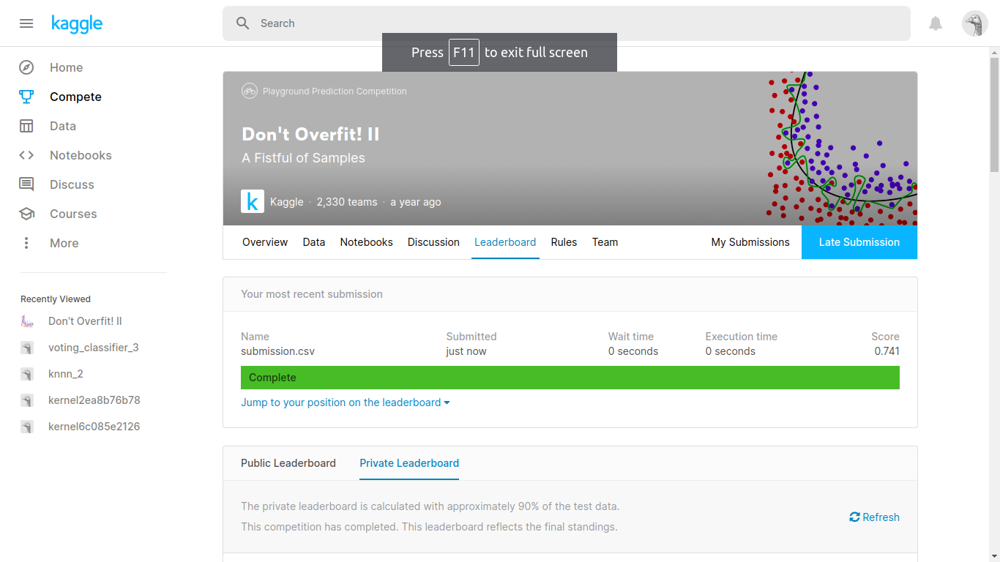

In [0]:
from IPython.display import Image
Image(filename='Screenshot from 2020-05-06 00-54-34.png')

In [0]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ['Model','Features','Hyperparameter','Test Score']
x.add_row(['knn','AF',r"{'algorithm': 'kd_tree', 'n_neighbors': 17}",0.639])
x.add_row(['Logistic Regression','AF',r"{'C': 1000, 'penalty': 'l1', 'solver':'liblinear'}",0.718])
x.add_row(['SVC','AF',r"{'C': 0.1, 'kernel': 'linear'}",0.724])
x.add_row(['RandomForest','AF',r"{'max_depth': 2, 'n_estimators': 400}",0.663])
x.add_row(['XGBoost','AF',r"{'max_depth': 7, 'n_estimators': 300}",0.658])
x.add_row(['Stacking Classifier','AF','-',0.723])
x.add_row(['Voting Classifier(No stacking + no weights)','AF',"-",0.739])
x.add_row(['Voting Classifier(stacking + no weights)','AF',"-",0.736])
x.add_row(['Voting Classifier(no stacking + weights)','AF',"-",0.741])
x.add_row(['Voting Classifier(stacking + weights)','AF',"-",0.741])
print(x)

+---------------------------------------------+----------+----------------------------------------------------+------------+
|                    Model                    | Features |                   Hyperparameter                   | Test Score |
+---------------------------------------------+----------+----------------------------------------------------+------------+
|                     knn                     |    AF    |    {'algorithm': 'kd_tree', 'n_neighbors': 17}     |   0.639    |
|             Logistic Regression             |    AF    | {'C': 1000, 'penalty': 'l1', 'solver':'liblinear'} |   0.718    |
|                     SVC                     |    AF    |           {'C': 0.1, 'kernel': 'linear'}           |   0.724    |
|                 RandomForest                |    AF    |       {'max_depth': 2, 'n_estimators': 400}        |   0.663    |
|                   XGBoost                   |    AF    |       {'max_depth': 7, 'n_estimators': 300}        |   0.658    |
